<a href="https://colab.research.google.com/github/ipeirotis/autoencoders_census/blob/main/measure_accuracy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Autoencoders and Data Quality for Tabular Data**

In [1]:
!rm -rf autoencoders_census
!git clone https://github.com/ipeirotis/autoencoders_census.git
%cd autoencoders_census

Cloning into 'autoencoders_census'...
remote: Enumerating objects: 528, done.
remote: Counting objects: 100% (162/162), done.
remote: Compressing objects: 100% (160/160), done.
remote: Total 528 (delta 99), reused 2 (delta 2), pack-reused 366
Receiving objects: 100% (528/528), 48.01 MiB | 13.69 MiB/s, done.
Resolving deltas: 100% (313/313), done.
/content/autoencoders_census


In [2]:
from google.colab import auth

# Login using the account that has access to the Google project
# in order to access the resources for the project
auth.authenticate_user()

In [15]:
# This code imports the DataTransformer object from
# the notebook pandas2vector.ipynb
!pip install -q import_ipynb keras-tuner
import import_ipynb
from pandas2vector import Table2Vector
from data_loader import DataLoader
from autoencoder import AutoencoderModel
from autoencoder import VariationalAutoencoderModel

# Data Source

The used data stems from the Youth Risk Behavior Surveillance System by CDC (Centers for Disease Control and Prevention). It includes data on a set of surveys that track behaviors that can lead to poor health in students grades 9 through 12. [Here](https://www.cdc.gov/healthyyouth/data/yrbs/data.htm) is the link to the dataset.

Note: The dataset is updated every two years. We use the 2017 version of the national high school YRBS dataset.

## Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [26]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, label_binarize
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import confusion_matrix
from pandas.api.types import is_numeric_dtype
from matplotlib.offsetbox import TransformedBbox

In [6]:
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.interpolate import interp1d
from numpy.random import uniform
from numpy.random import seed

In [17]:
from keras.layers import Input, Lambda
from keras.layers import Dense
from keras.layers import BatchNormalization
from keras import backend as K
from keras import Model

In [8]:
import tensorflow as tf
from tensorflow.random import set_seed
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow import keras

# Load Original Dataset

In [9]:

# Data Source
data_loader = DataLoader()

project_data, variable_types  = data_loader.load_2017()



In [10]:
project_data.shape

(14765, 98)

In [11]:
project_data.dropna().shape

(14765, 98)

# Vectorizing the data set

In [12]:
# Data Transformation
vectorizer = Table2Vector(variable_types)


# Without indicator variables for missingness
vectorized_df = vectorizer.vectorize_table(project_data)

In [13]:
assert( vectorizer.tabularize_vector(vectorized_df).shape == project_data.shape )

# Autoencoder loading

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import custom_object_scope
import gcsfs




# Define the path to the file on GCS
gcs_model_path = "gs://autoencoder_census_models/best_parameters_autoencoder.keras"

# Define the local path where the model will be downloaded
local_model_path = "best_parameters_autoencoder.keras"

# Create a GCS filesystem object using your project ID
fs = gcsfs.GCSFileSystem(project='autoencoder-census')

# Download the model file from GCS
with fs.open(gcs_model_path, 'rb') as gcs_file:
    with open(local_model_path, 'wb') as local_file:
        local_file.write(gcs_file.read())


# Initialize AutoencoderModel with attribute_cardinalities
# to use the custom loss function
attr_cardinalities = list(project_data.describe().T['unique'].values)
autoencoder_model = AutoencoderModel(attr_cardinalities)


# Load the model from the local file
model = load_model(local_model_path)




## Making Predictions and Filling in the Missing Values


In [ ]:

filled = vectorized_df.fillna(vectorized_df.median())

# Define a condition for stopping the iteration
epsilon = 1e-5
old_filled = None

while old_filled is None or np.abs(filled - old_filled).sum().sum() > epsilon:
  # Save the old filled DataFrame for convergence check
  old_filled = filled.copy()

  # Run the data through the autoencoder, which will return a complete version of the data.
  predicted = model.predict(filled)

  # Replace the initially guessed values in the original data with the corresponding values from the autoencoder's output. But keep the observed values unchanged.
  mask = vectorized_df.isna()
  filled[mask] = np.where(mask, predicted, filled)


462/462 [==============================] - 7s 7ms/step


In [ ]:
filled

,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,age__17 years old,age__18 years old or older,age__nan,sex__Female,sex__Male,...,stweight_cat__missing,stweight_cat__normal,stweight_cat__top-extreme,bmi_cat__bottom-extreme,bmi_cat__missing,bmi_cat__normal,bmi_cat__top-extreme,bmipct_cat__bottom-extreme,bmipct_cat__missing,bmipct_cat__normal
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14760,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
14761,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
14762,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
14763,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


Now that we have filled in the original dataset with the most likely values for their missing values, we run the Autoencoder on the filled vectorized dataset.

In [ ]:
predicted = pd.DataFrame(model.predict(filled))
predicted.columns = filled.columns
predicted

462/462 [==============================] - 3s 6ms/step


,age__12 years old or younger,age__13 years old,age__14 years old,age__15 years old,age__16 years old,age__17 years old,age__18 years old or older,age__nan,sex__Female,sex__Male,...,stweight_cat__missing,stweight_cat__normal,stweight_cat__top-extreme,bmi_cat__bottom-extreme,bmi_cat__missing,bmi_cat__normal,bmi_cat__top-extreme,bmipct_cat__bottom-extreme,bmipct_cat__missing,bmipct_cat__normal
0,0.002158,0.000009,0.000364,0.040148,0.280721,0.140852,0.011154,0.524595,0.387606,0.059416,...,0.999989,0.000011,4.434761e-07,0.000054,0.999073,0.000786,8.663143e-05,0.000008,0.999991,1.585380e-06
1,0.000739,0.000187,0.001513,0.024379,0.069677,0.029296,0.006716,0.867493,0.113316,0.010237,...,0.999973,0.000023,2.226475e-06,0.000368,0.997942,0.001343,3.473843e-04,0.000053,0.999945,2.387330e-06
2,0.072804,0.000484,0.011782,0.184326,0.319929,0.117722,0.018810,0.274143,0.572062,0.072926,...,0.999922,0.000066,1.264528e-06,0.000535,0.997251,0.002106,1.083214e-04,0.000106,0.999886,8.005180e-06
3,0.001603,0.000062,0.000212,0.012750,0.114308,0.112990,0.012941,0.745133,0.260794,0.079600,...,0.999989,0.000011,1.125039e-07,0.000127,0.999362,0.000505,6.066593e-06,0.000131,0.999868,4.870250e-07
4,0.000015,0.000444,0.002342,0.049758,0.073775,0.012357,0.001165,0.860144,0.266116,0.026435,...,0.999967,0.000033,8.208314e-08,0.000018,0.998809,0.001154,1.982746e-05,0.000063,0.999935,2.595734e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14760,0.349649,0.001499,0.004304,0.014696,0.057766,0.333292,0.226717,0.012077,0.428764,0.377495,...,0.982104,0.016793,9.644344e-04,0.002332,0.831190,0.157240,9.237938e-03,0.012791,0.980487,6.721408e-03
14761,0.950131,0.000099,0.001682,0.003400,0.011774,0.023732,0.004964,0.004217,0.044591,0.710789,...,0.999762,0.000086,1.392771e-04,0.022334,0.966070,0.005663,5.932647e-03,0.002157,0.997830,1.306553e-05
14762,0.515384,0.002122,0.017406,0.081395,0.171213,0.163538,0.011488,0.037454,0.593840,0.243176,...,0.998699,0.001094,1.949897e-04,0.009761,0.961184,0.022012,7.042328e-03,0.002212,0.997514,2.738692e-04
14763,0.000326,0.000045,0.000026,0.000483,0.022282,0.657454,0.319174,0.000210,0.928628,0.071020,...,0.001766,0.997820,1.747962e-07,0.019122,0.002684,0.978193,6.736367e-07,0.988815,0.001153,1.003192e-02


In [ ]:
tabular_from_predicted = vectorizer.tabularize_vector(predicted)

## Visualization of the original vs reconstructed

In [ ]:

def create_scatterplot_for_numeric(original_df, predicted_df, numeric_attr):
  plt.figure(figsize=(10, 6))  # Create a new figure with a particular size
  plt.scatter(original_df[numeric_attr], predicted_df[numeric_attr], s=1)  # Create a scatterplot
  plt.xlabel(f'Original Data ({numeric_attr})')  # Set the x-axis label
  plt.ylabel(f'Reconstructed Data ({numeric_attr})')  # Set the y-axis label
  plt.title(f'Scatterplot for {numeric_attr}')  # Set the plot title
  plt.show()  # Display the plot

for v in variable_types.keys():
  if variable_types[v] == 'numeric':
    print(v)
    create_scatterplot_for_numeric(project_data, tabular_from_predicted, v)



age


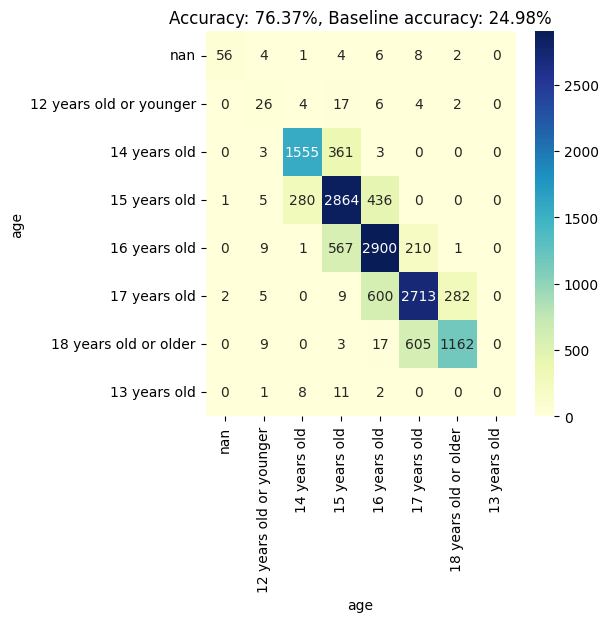

sex


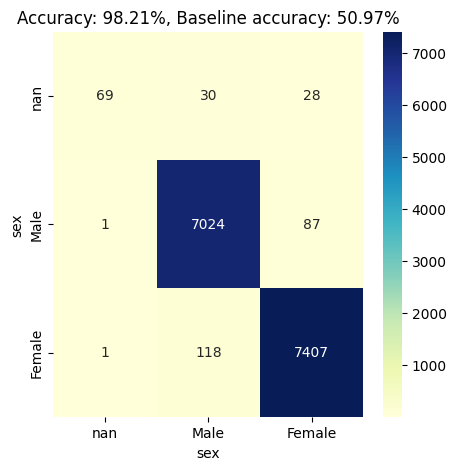

grade


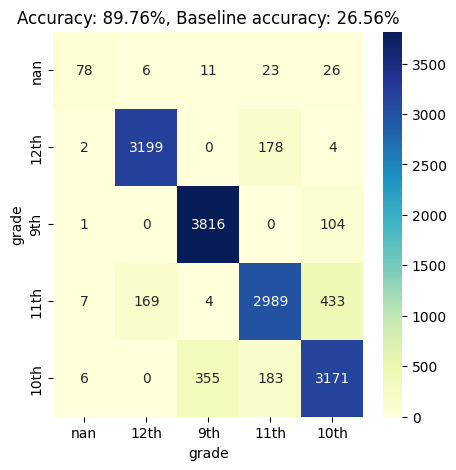

Hispanic_or_Latino


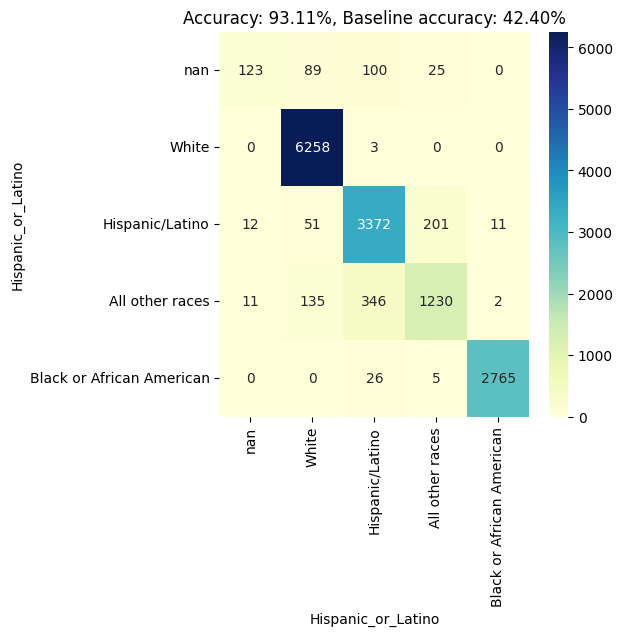

race


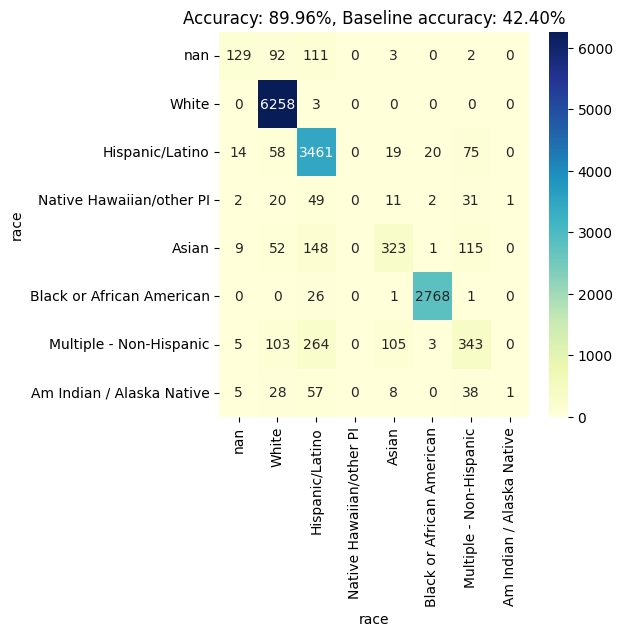

obese


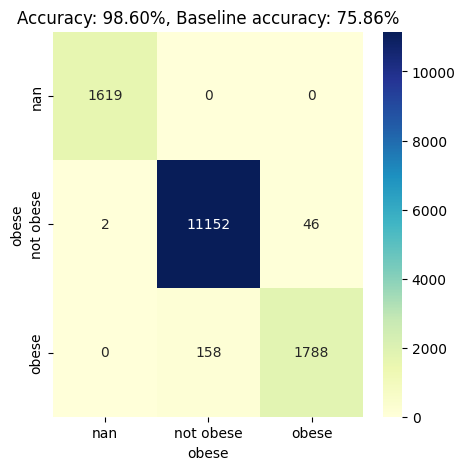

overweight


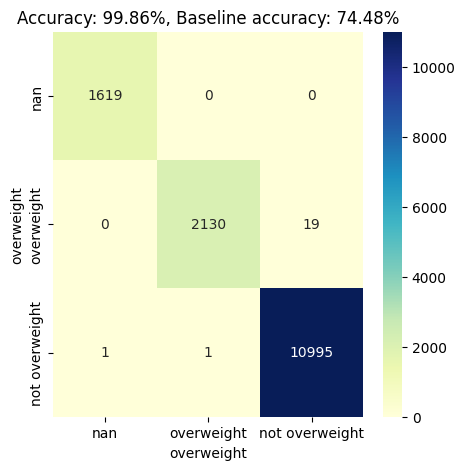

sexual_identity


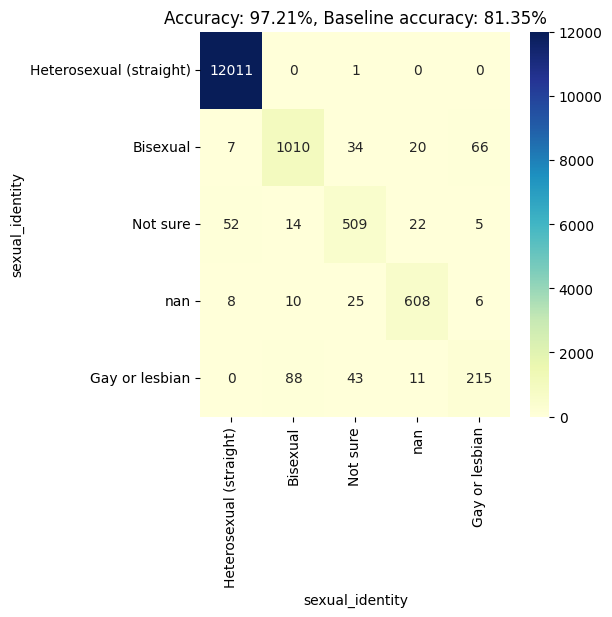

sex/sexual_contacts


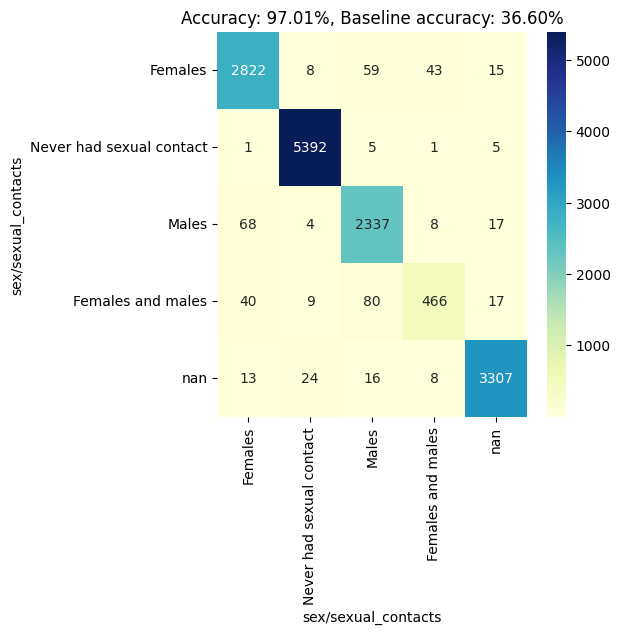

sexid


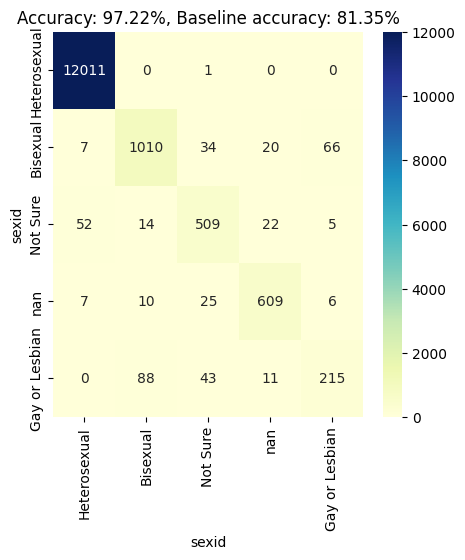

sexid2


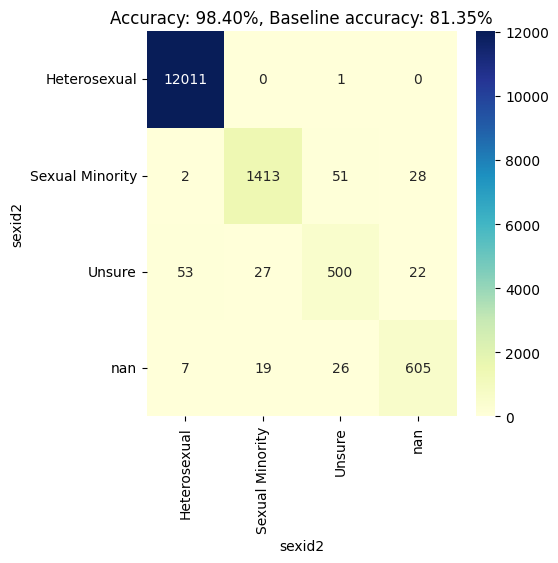

sexpart


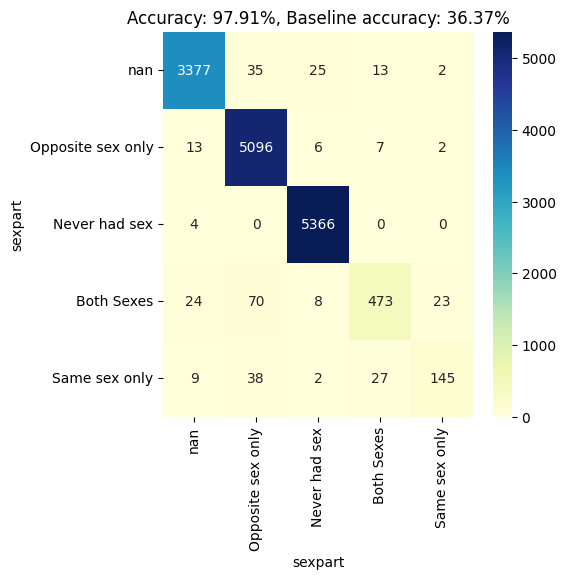

sexpart2


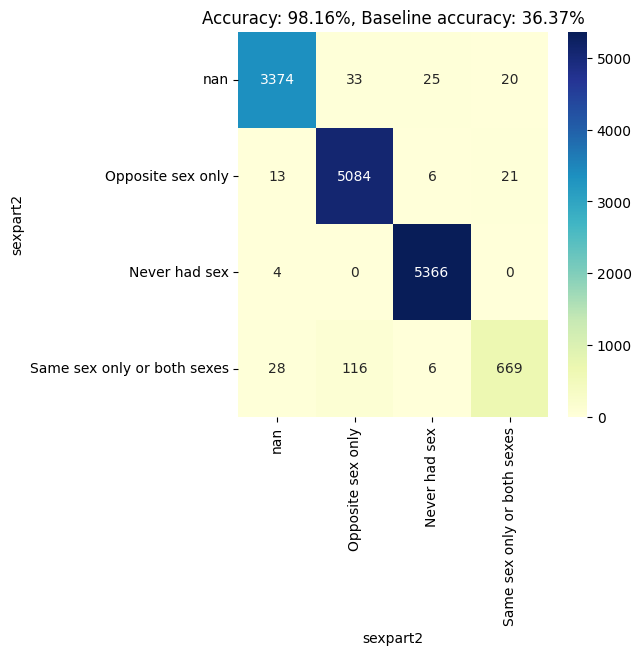

seat_belt_use


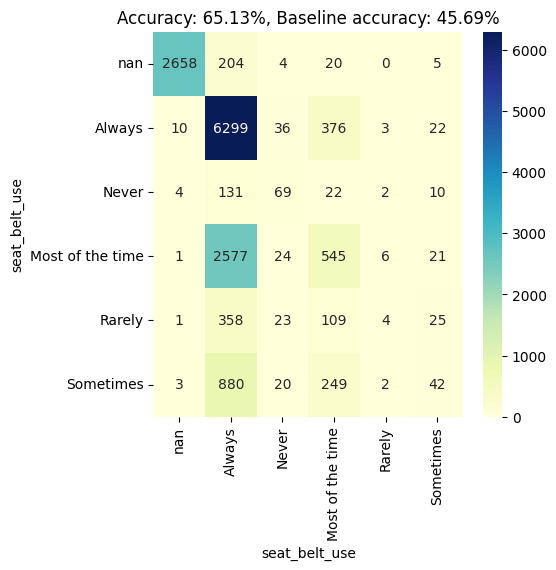

riding_with_a_drinking_driver


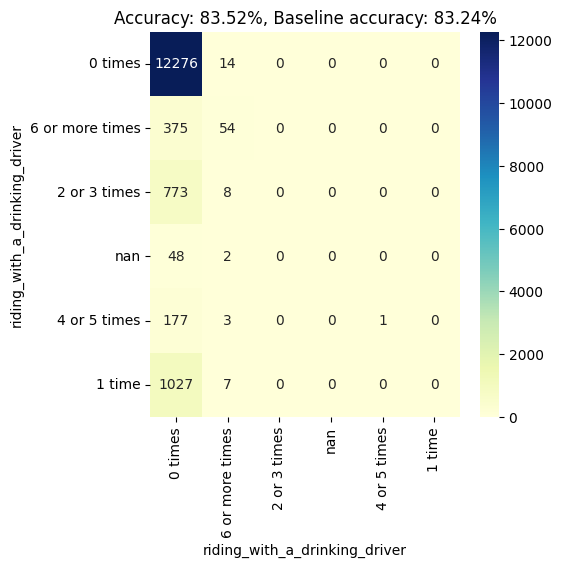

drinking_and_driving


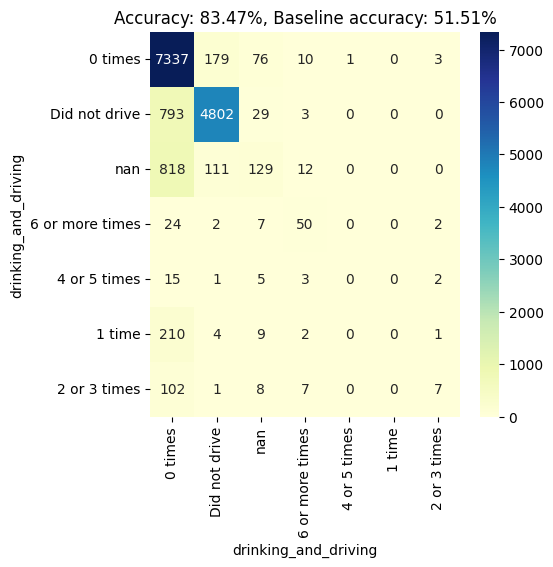

texting_and_driving


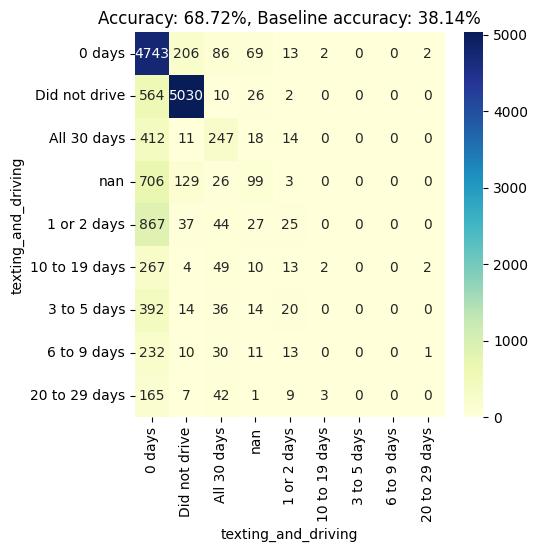

weapon_carrying


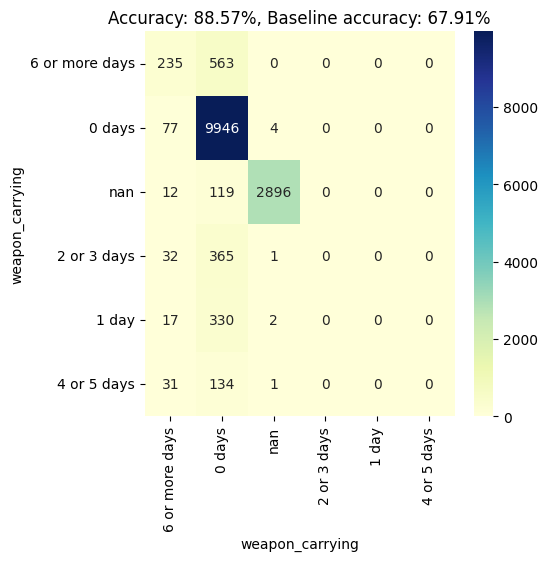

weapon_carrying_at_school


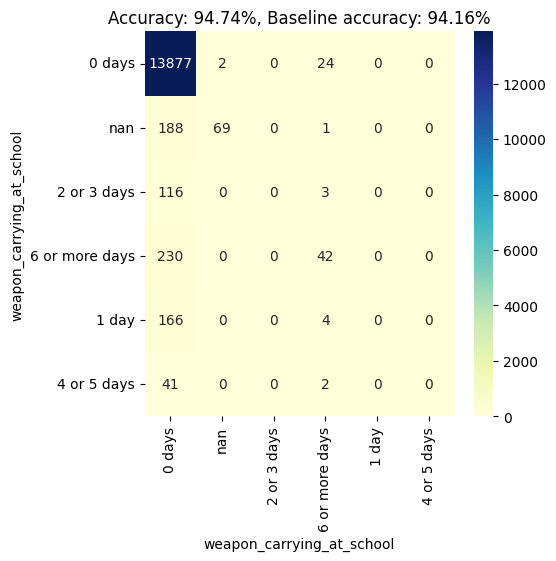

safety_concerns_at_school


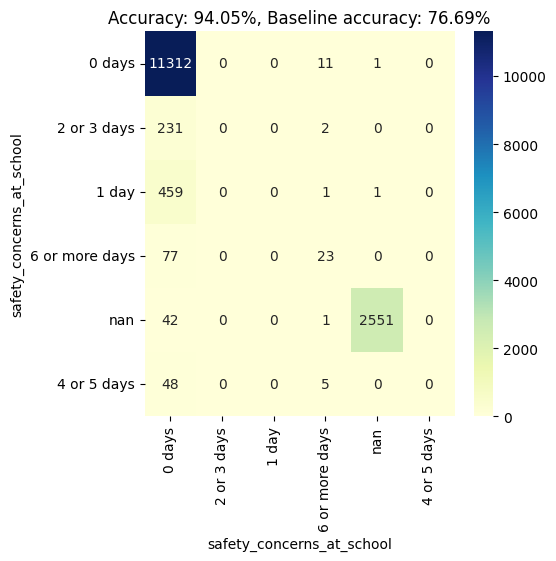

threatened_at_school


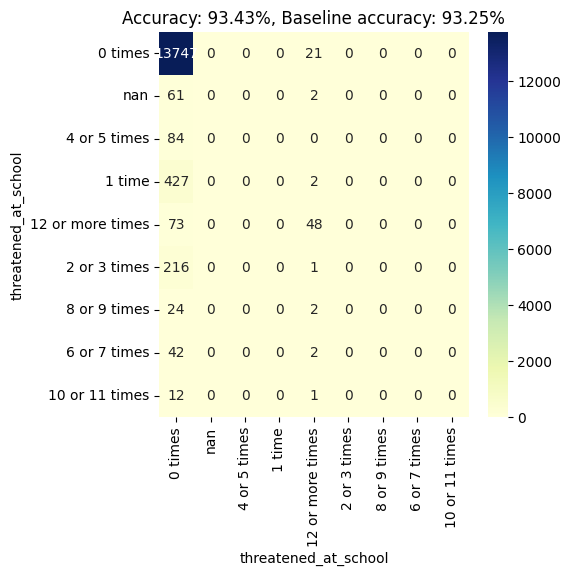

physical_fighting


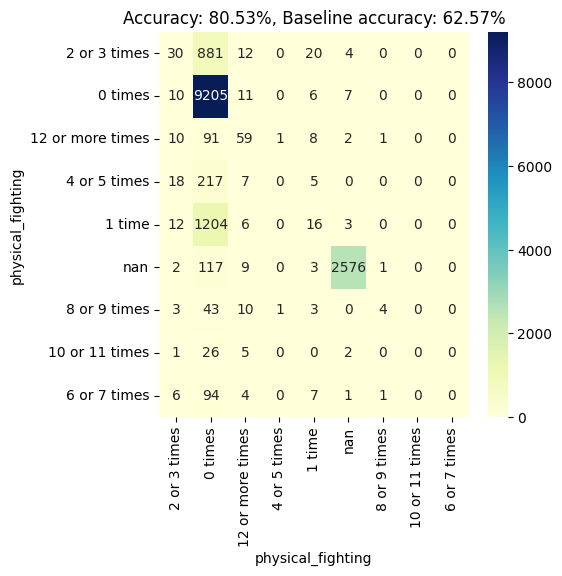

physical_fighting_at_school


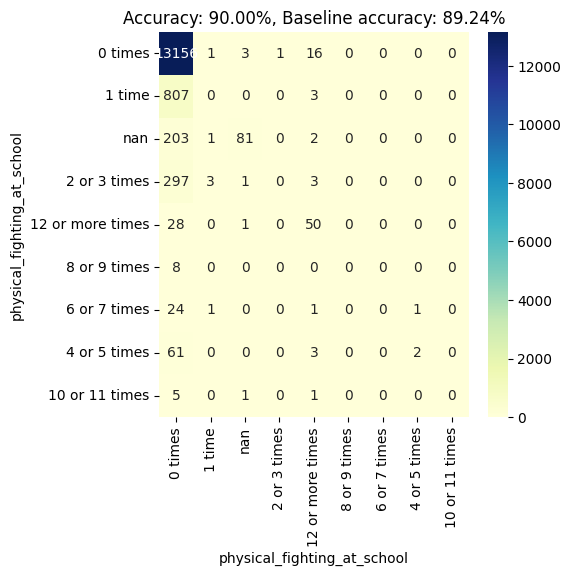

forced_sexual_intercourse


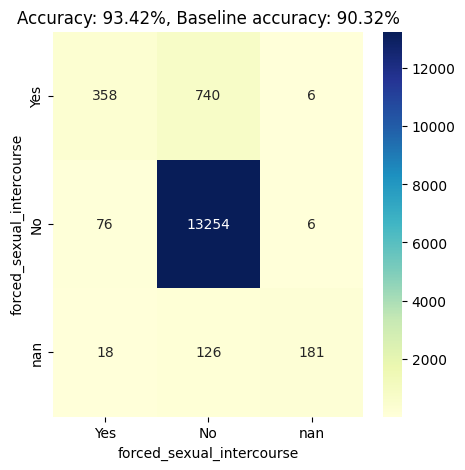

sexual_dating_violence


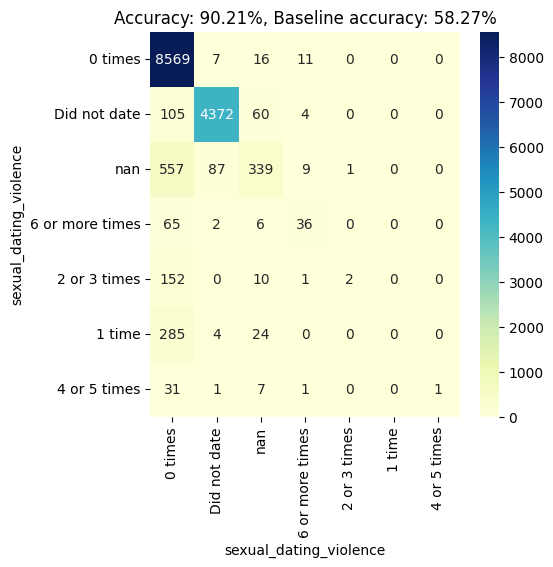

physical_dating_violence


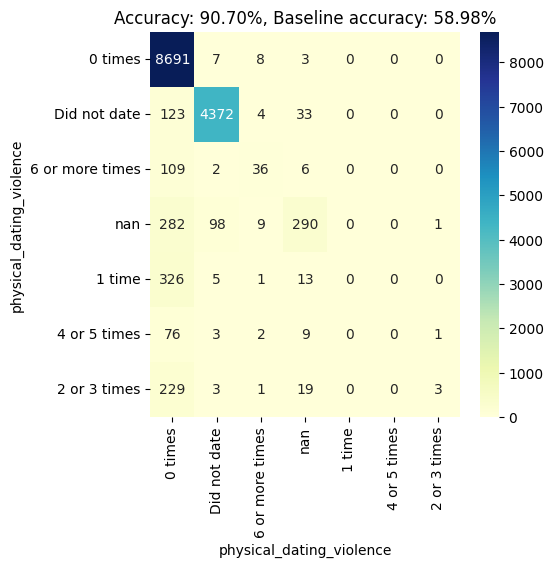

bullying_at_school


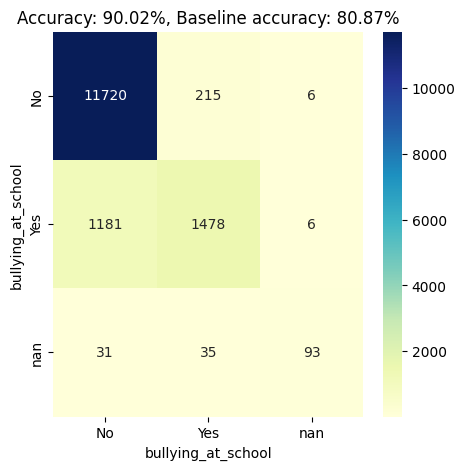

electronic_bullying


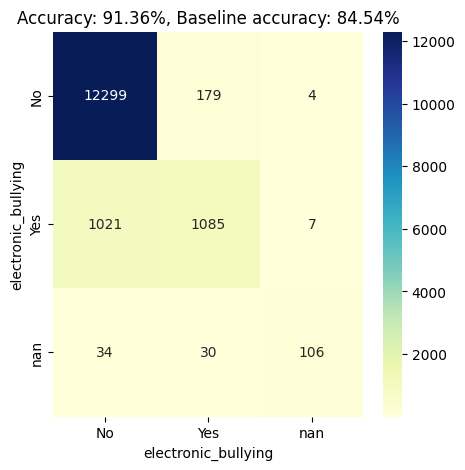

sad_or_hopeless


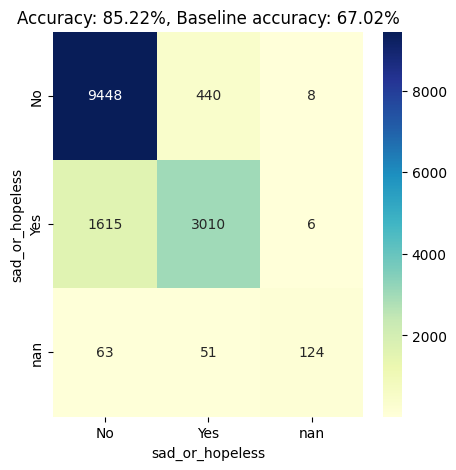

considered_suicide


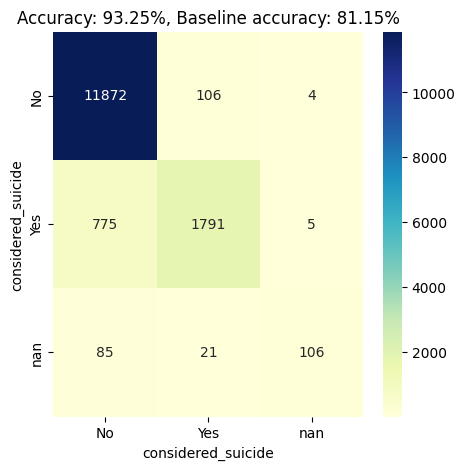

made_a_suicide_plan


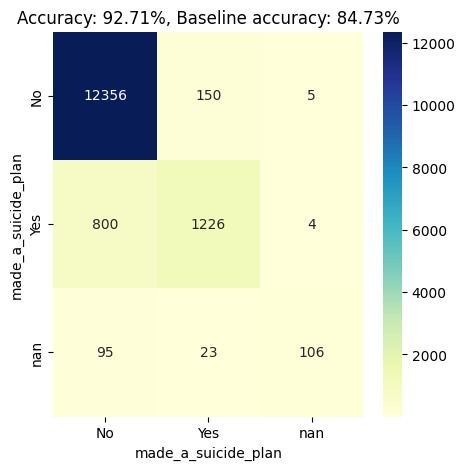

attempted_suicide


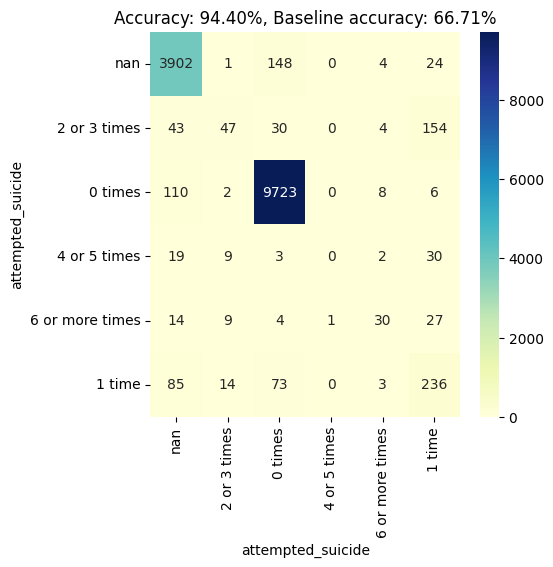

injurious_suicide_attempt


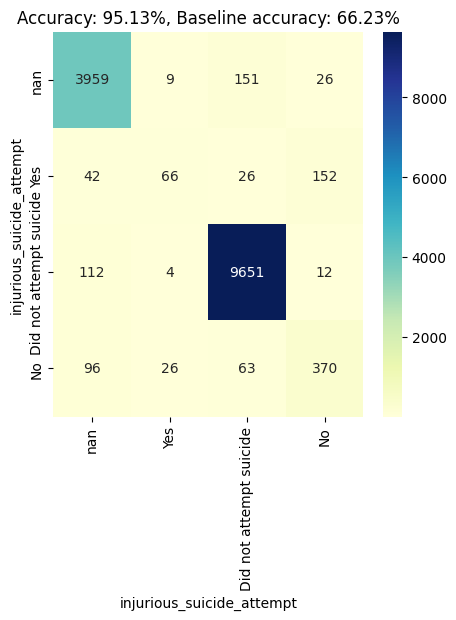

ever_cigarette_use


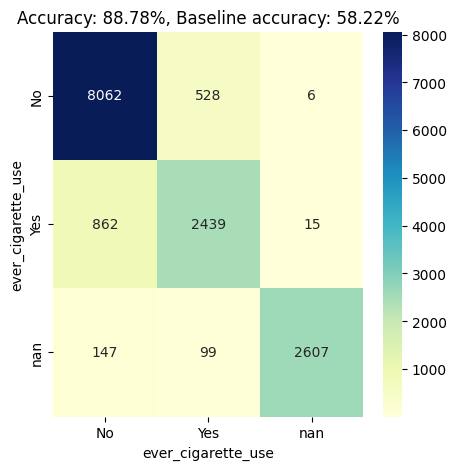

current_cigarette_use


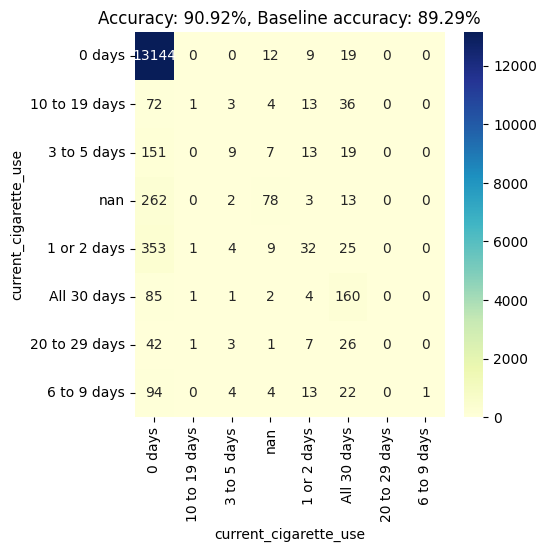

smoking_amounts_per_day


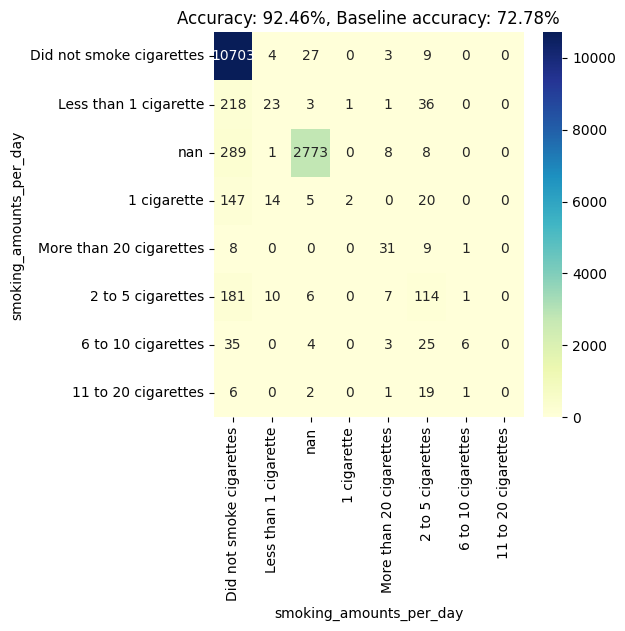

electronic_vapor_product_use


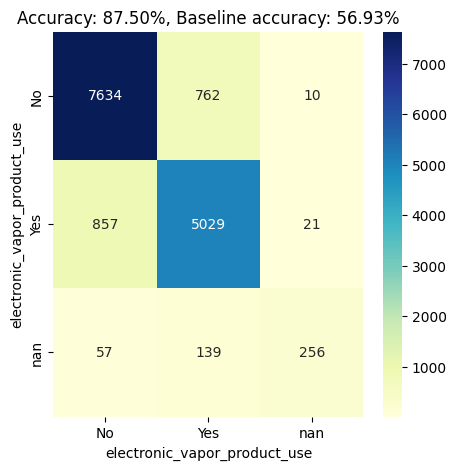

current_electronic_vapor_product_use


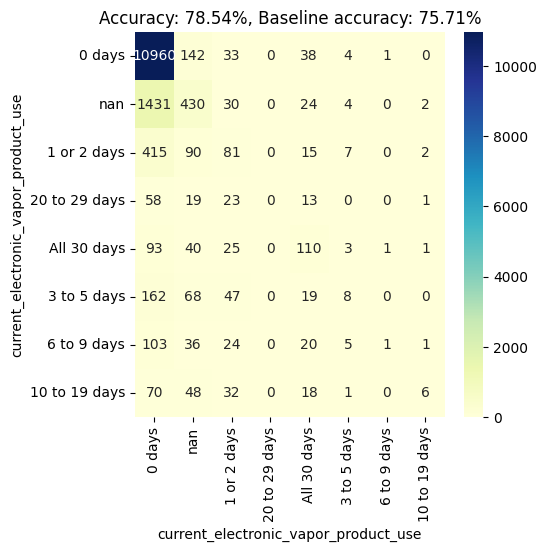

current_cigar_use


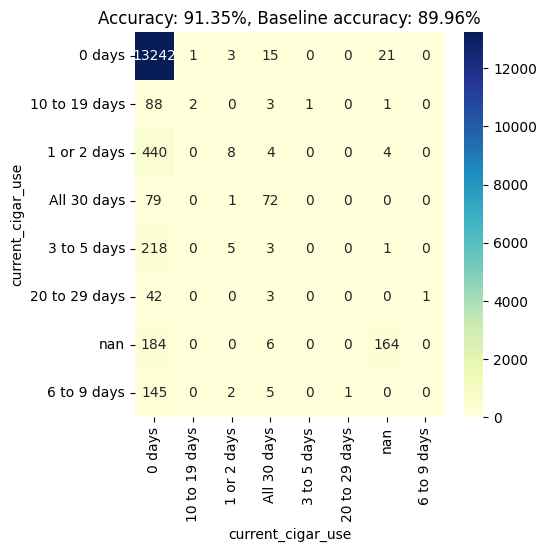

ever_alcohol_use


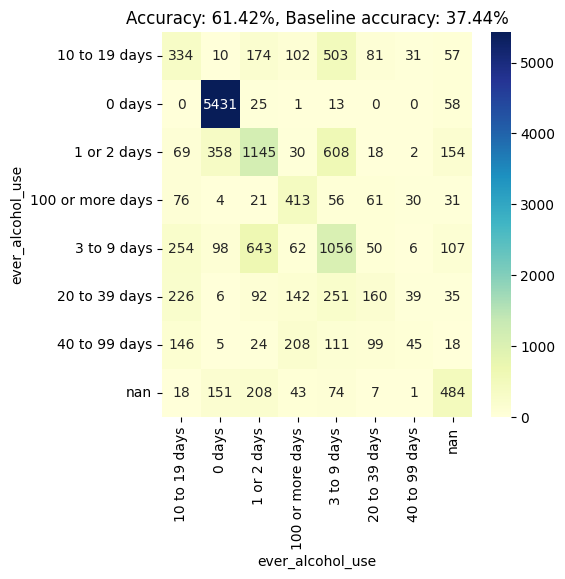

initiation_of_alcohol_use


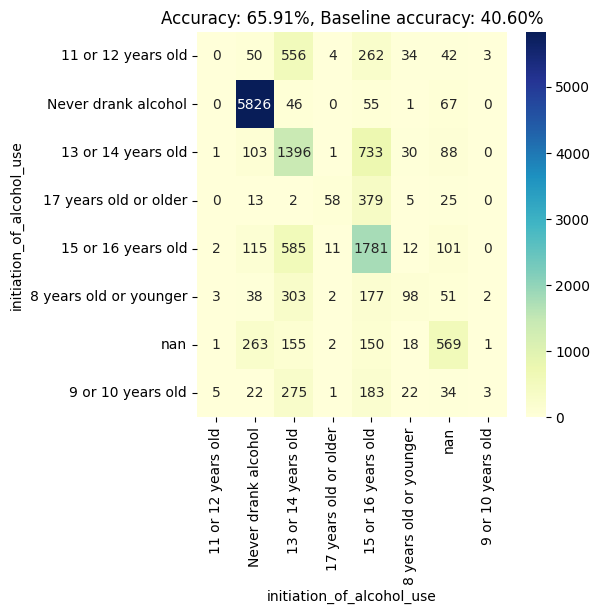

current_alcohol_use


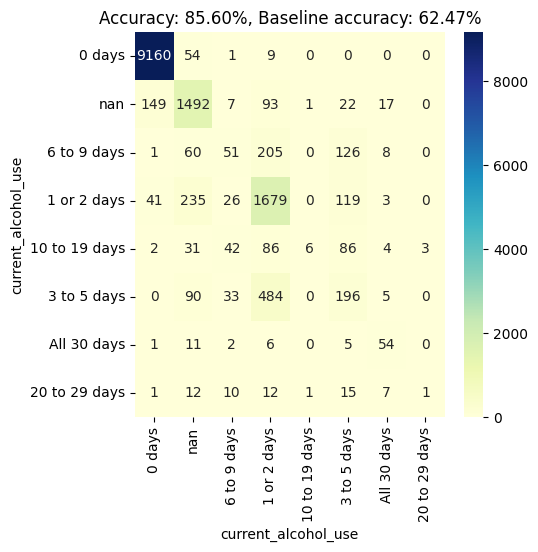

source_of_alcohol


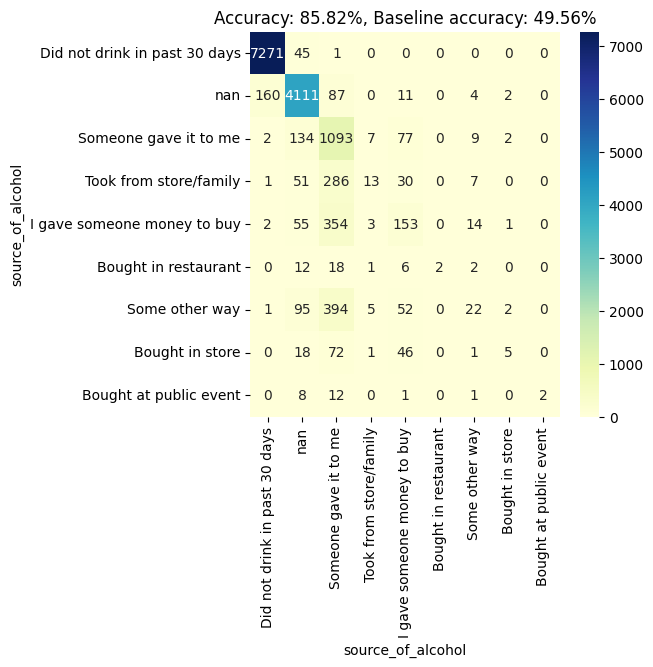

largest_number_of_drinks


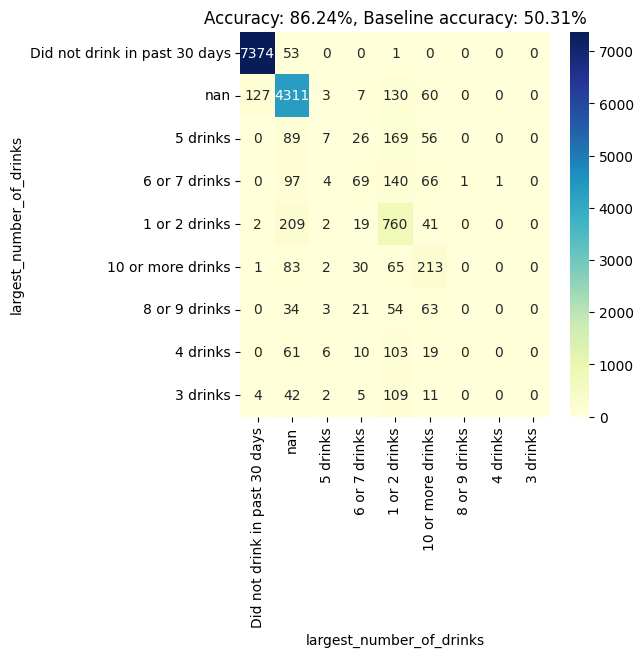

ever_marijuana_use


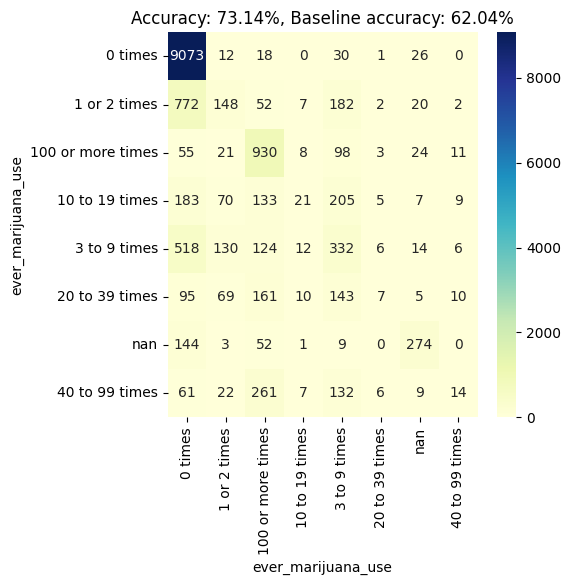

initiation_of_marijuana_use


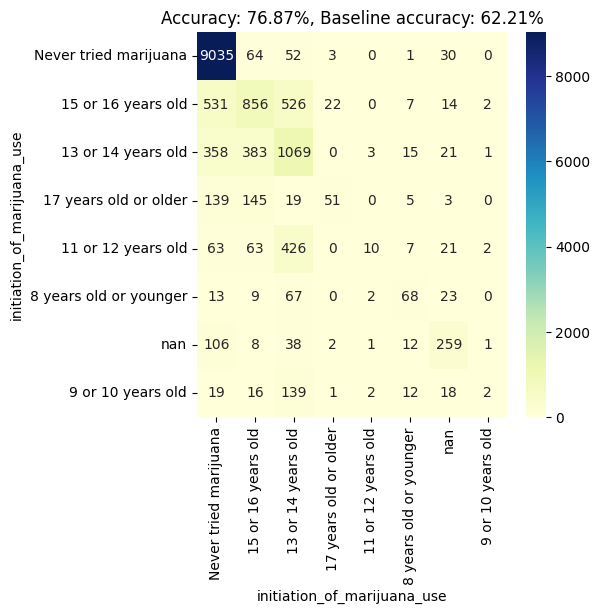

current_marijuana_use


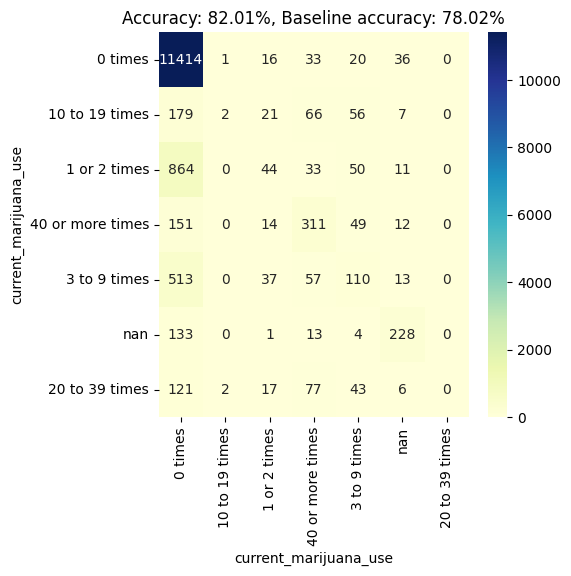

ever_cocaine_use


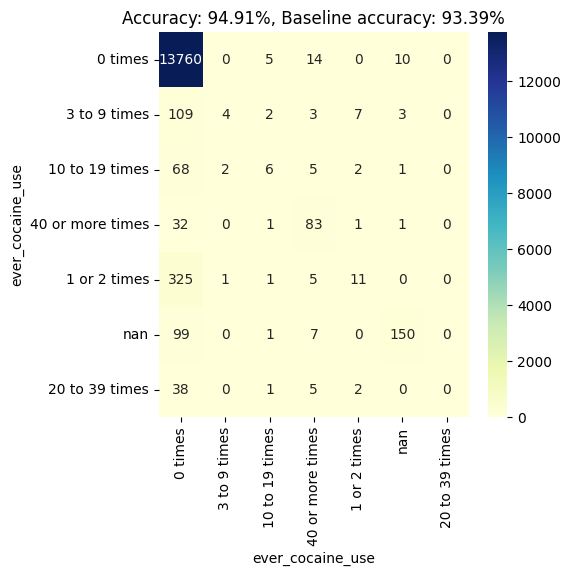

ever_inhalant_use


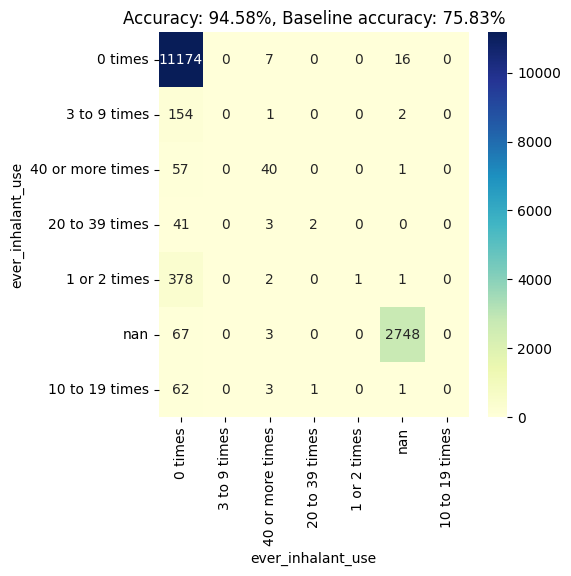

ever_heroin_use


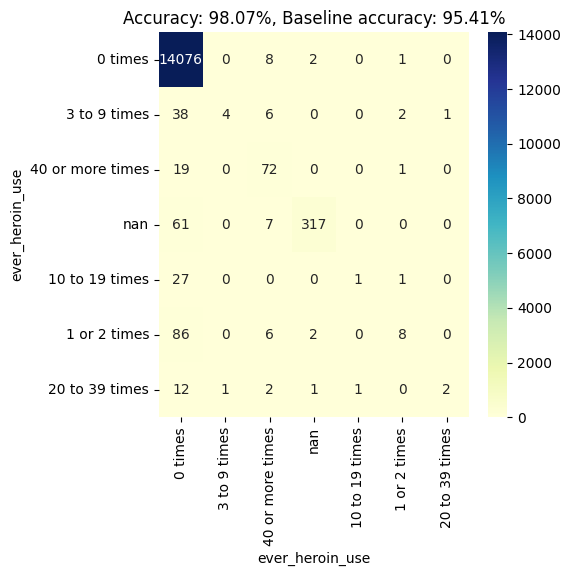

ever_methamphetamine_use


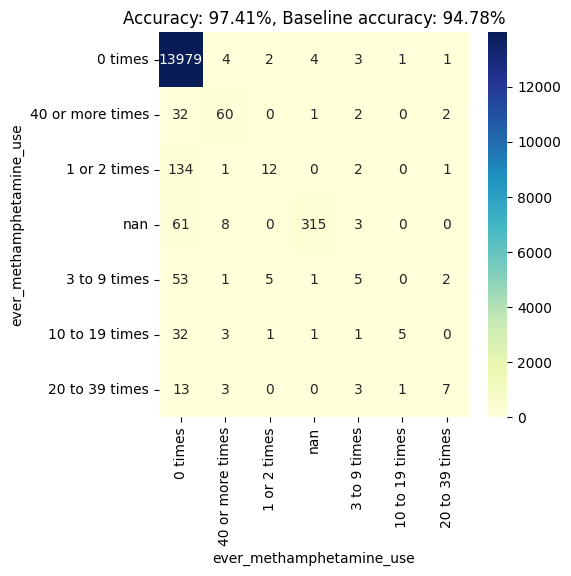

ever_ecstasy_use


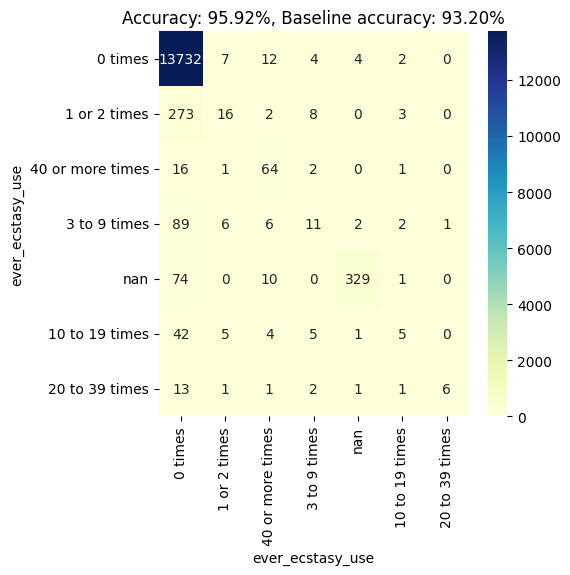

ever_synthetic_marijuana_use


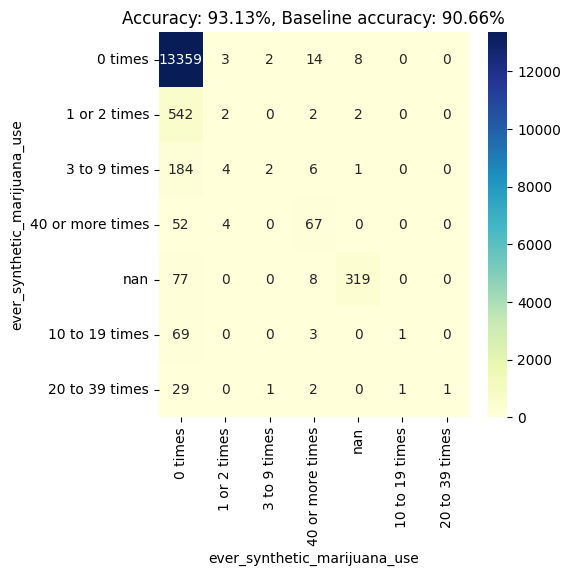

ever_steroid_use


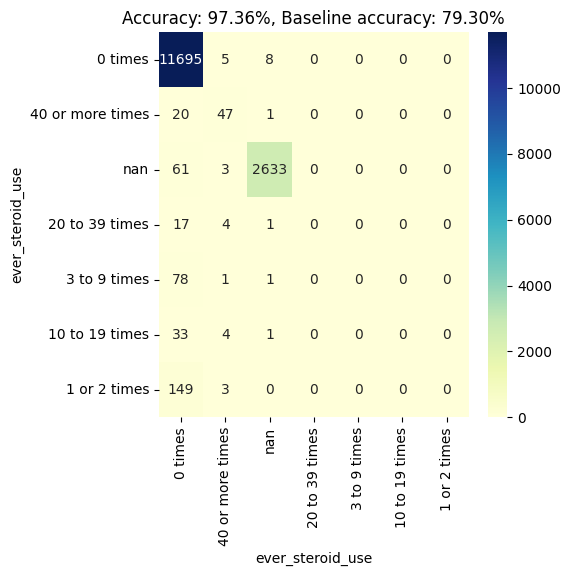

illegal_injected_drug_use


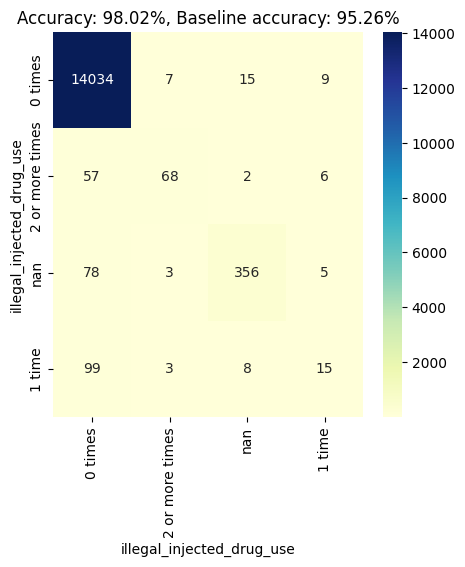

illegal_drugs_at_school


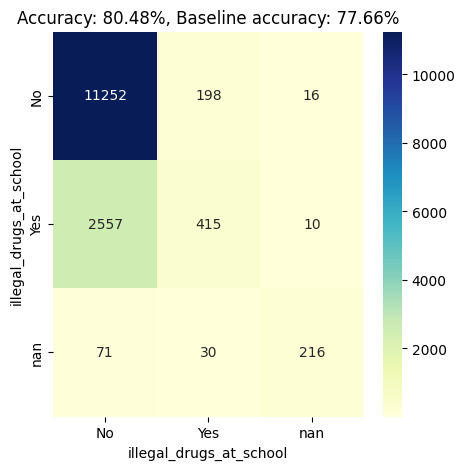

ever_sexual_intercourse


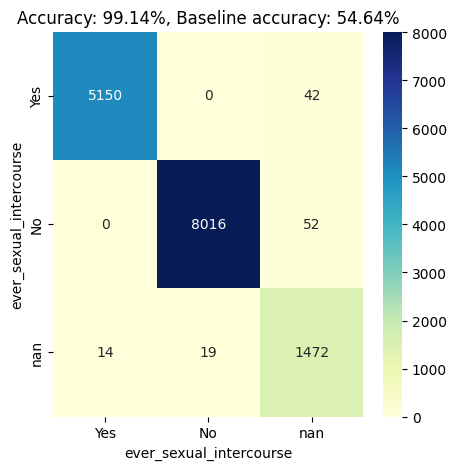

first_sex_intercourse


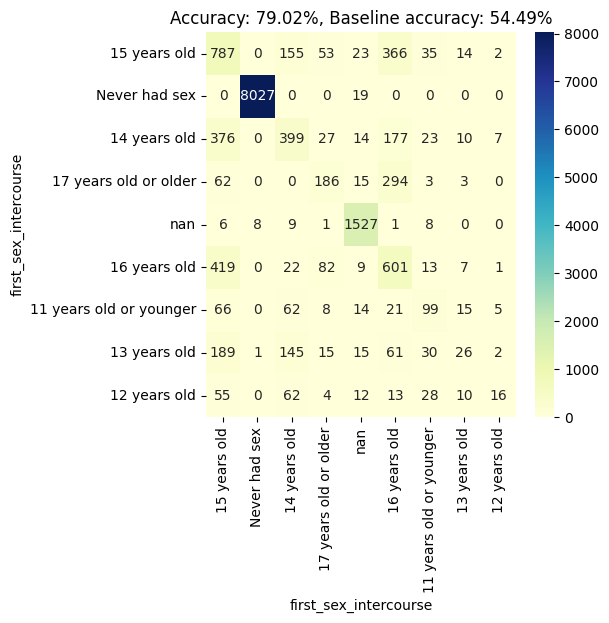

multiple_sex_partners


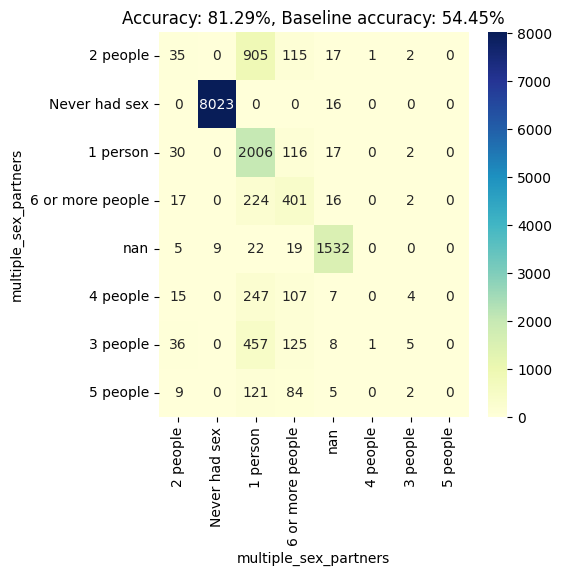

current_sexual_activity


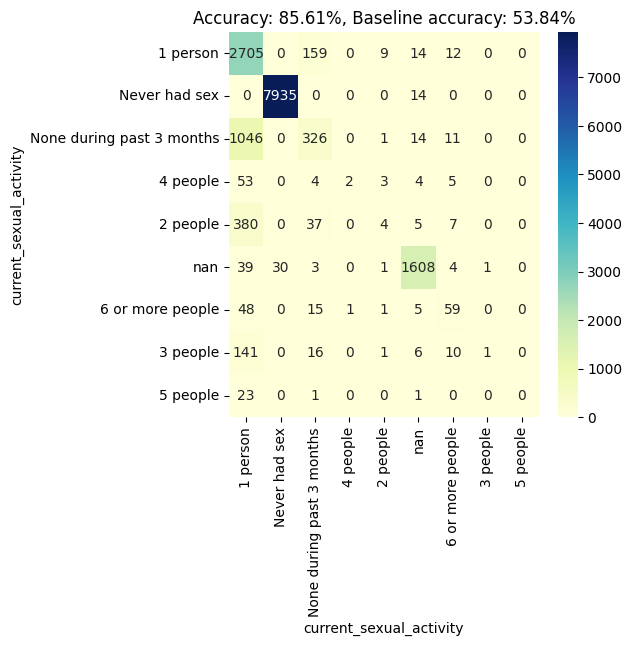

alcohol/drugs_at_sex


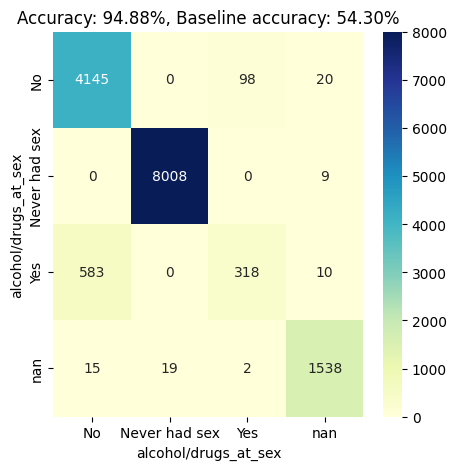

condom_use


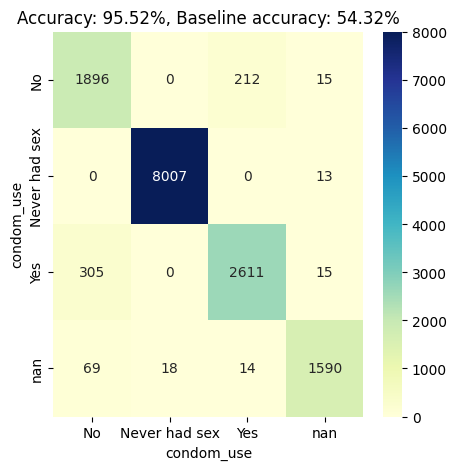

birth_control_pill_use


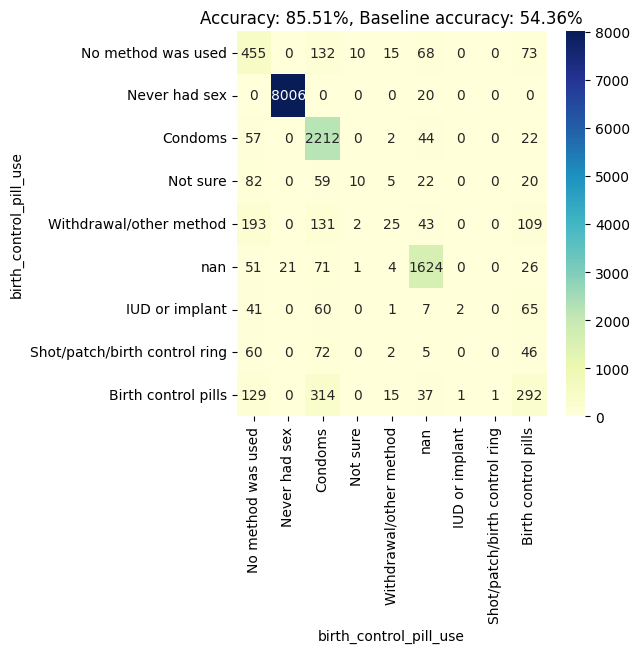

perception_of_weight


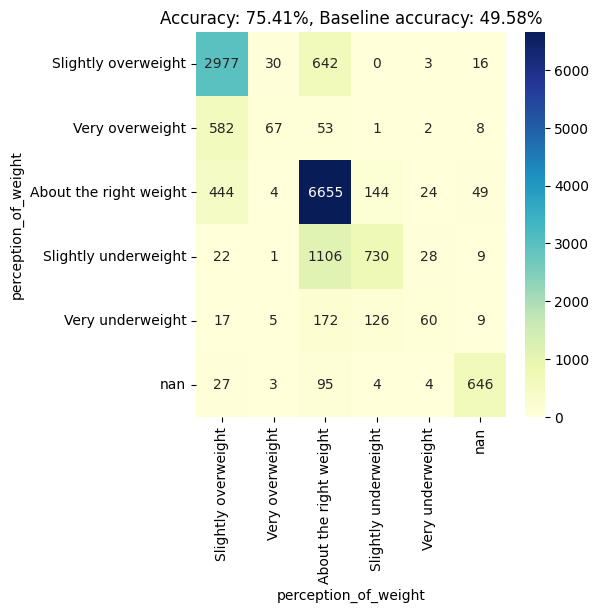

weight_loss


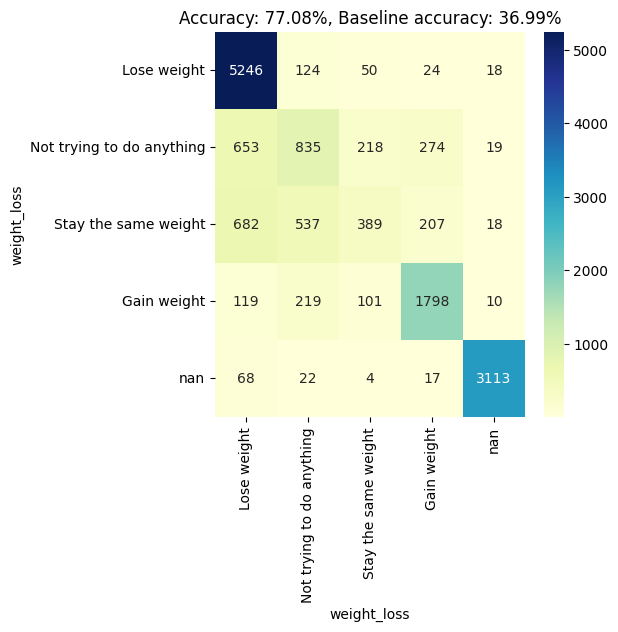

fruit_juice_drinking


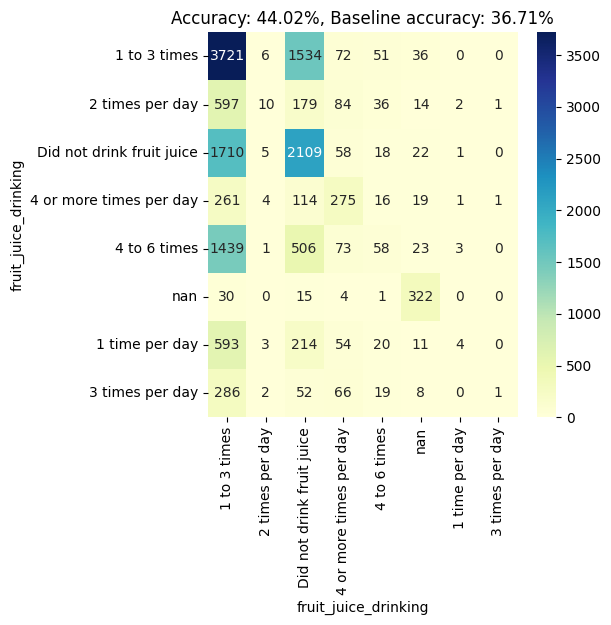

fruit_eating


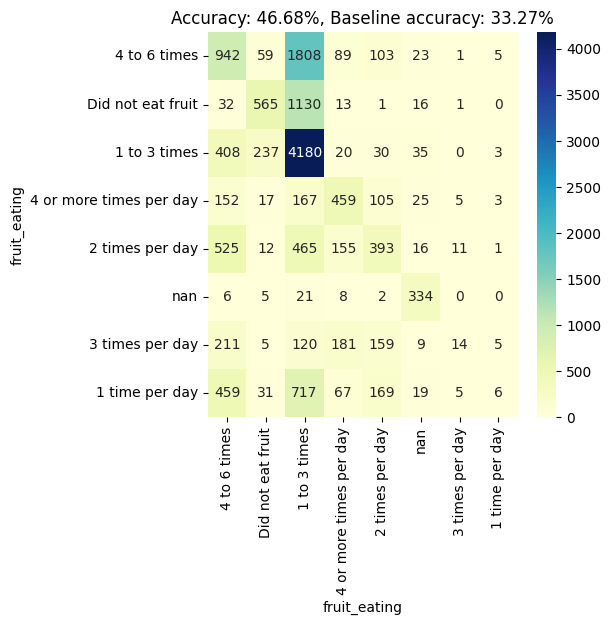

green _salad_eating


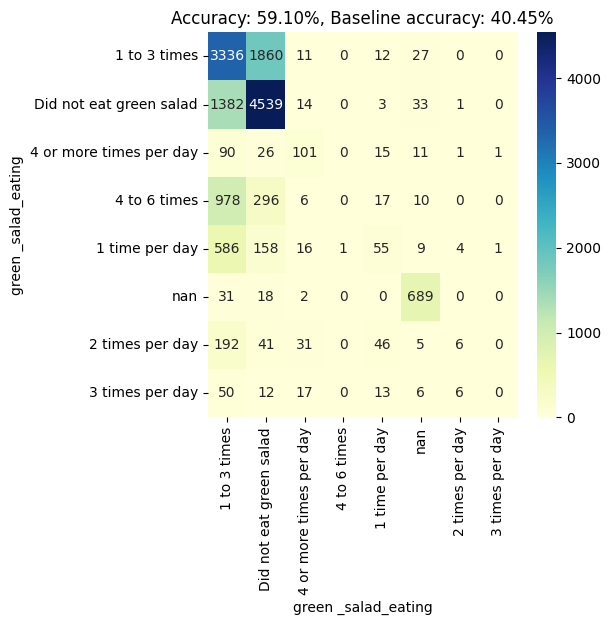

potato_eating


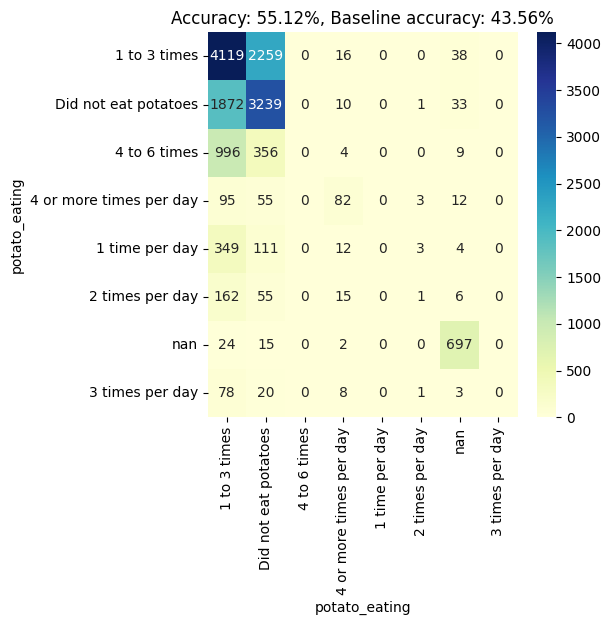

carrot_eating


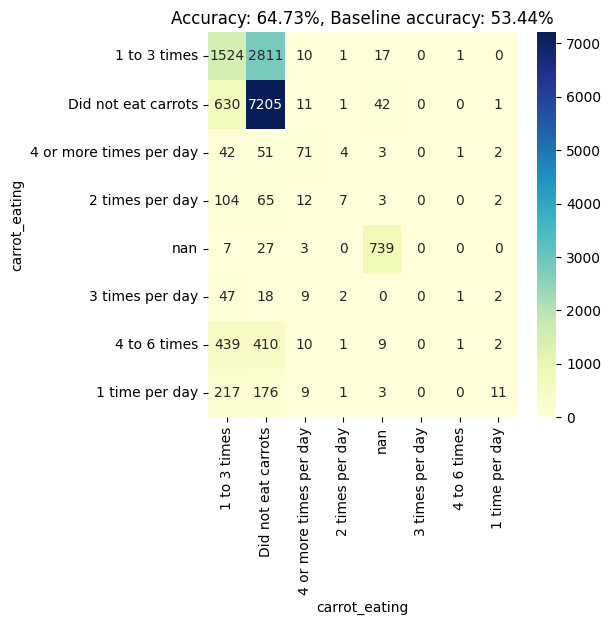

other_vegetable_eating


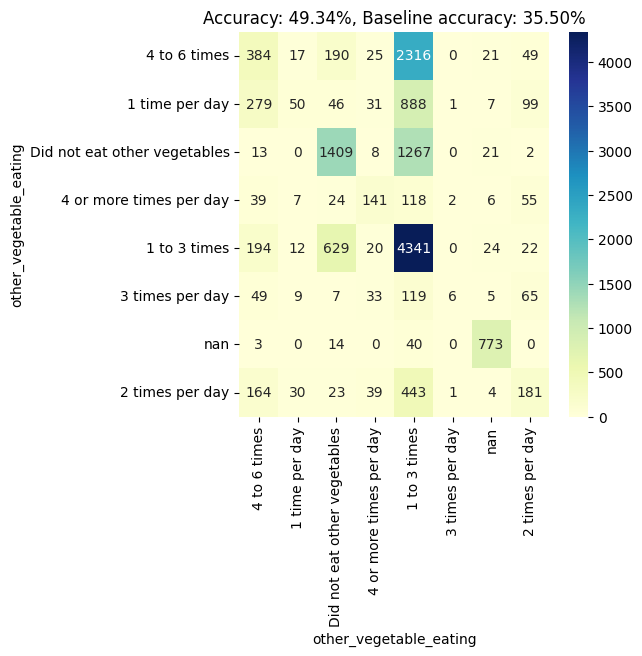

soda_drinking


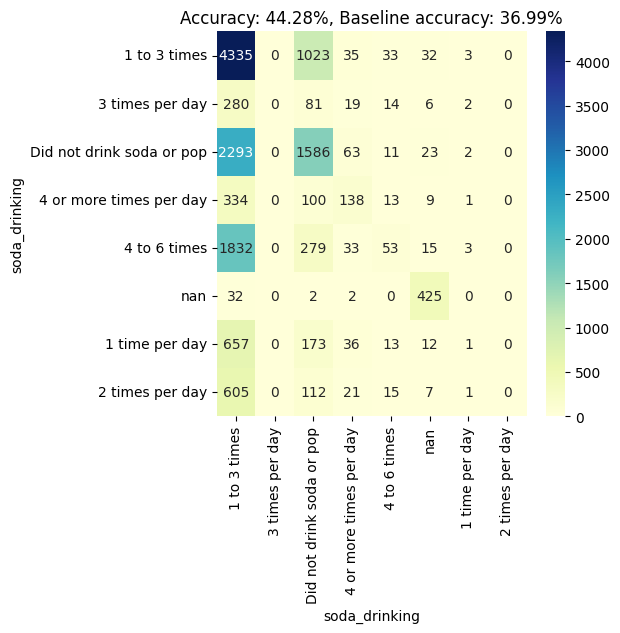

milk_drinking


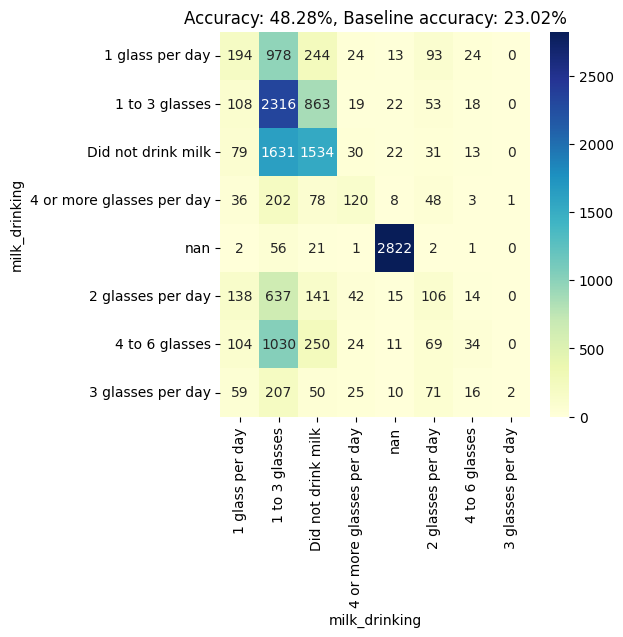

breakfast_eating


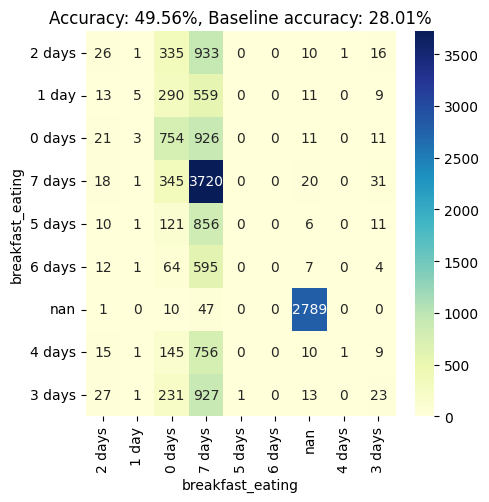

physical_activity


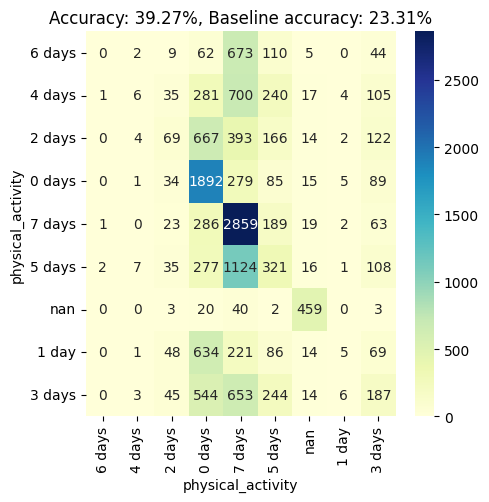

television_watching


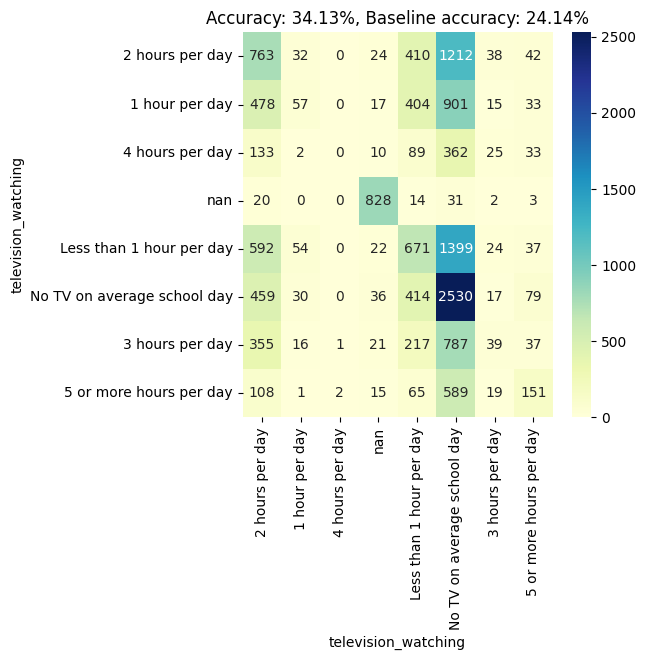

computer_not_school_work_use


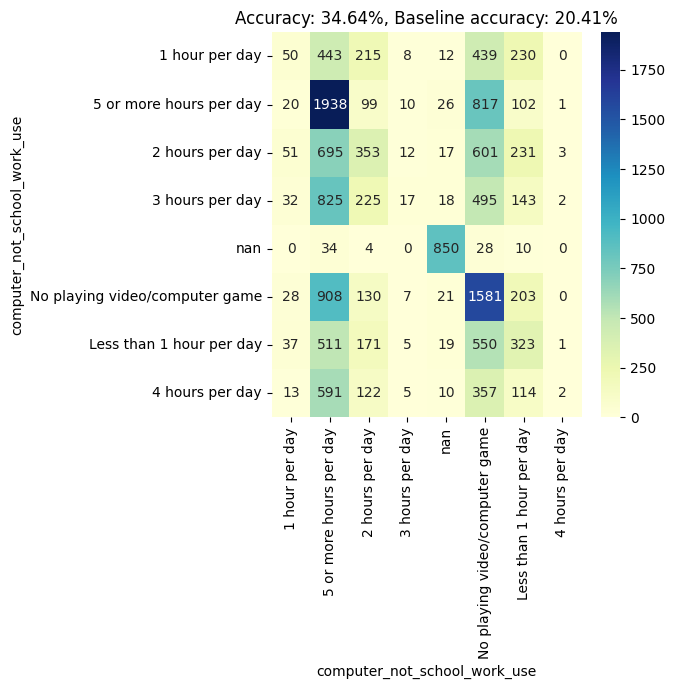

PE_attendance


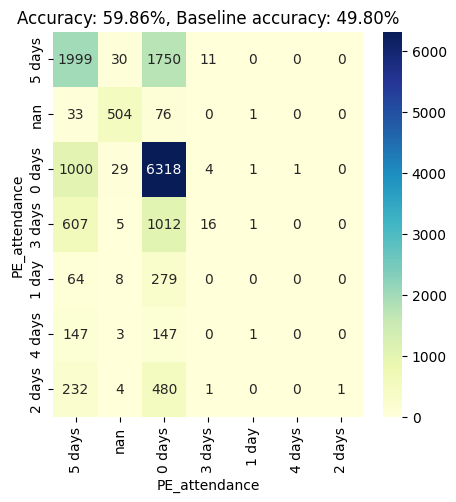

sports_team_participation


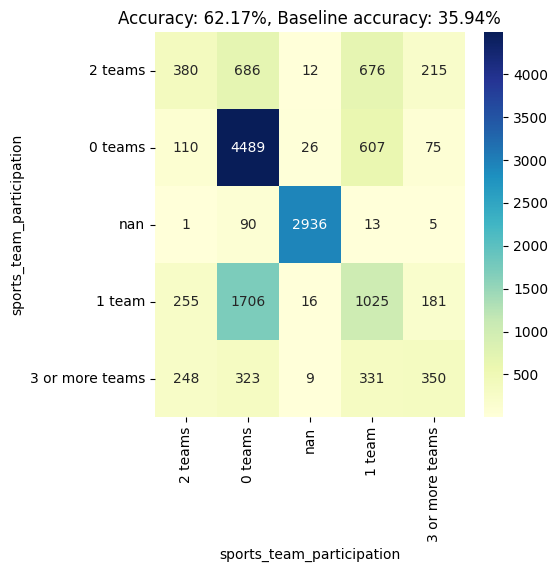

HIV_testing


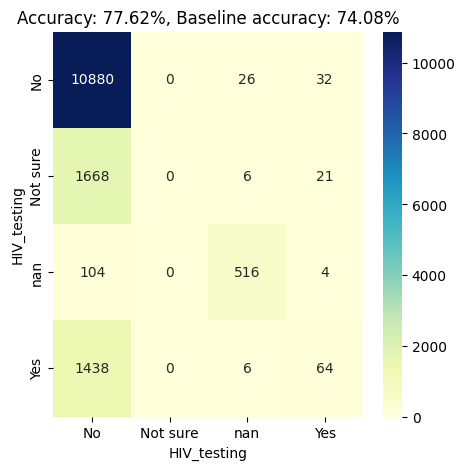

oral_health_care


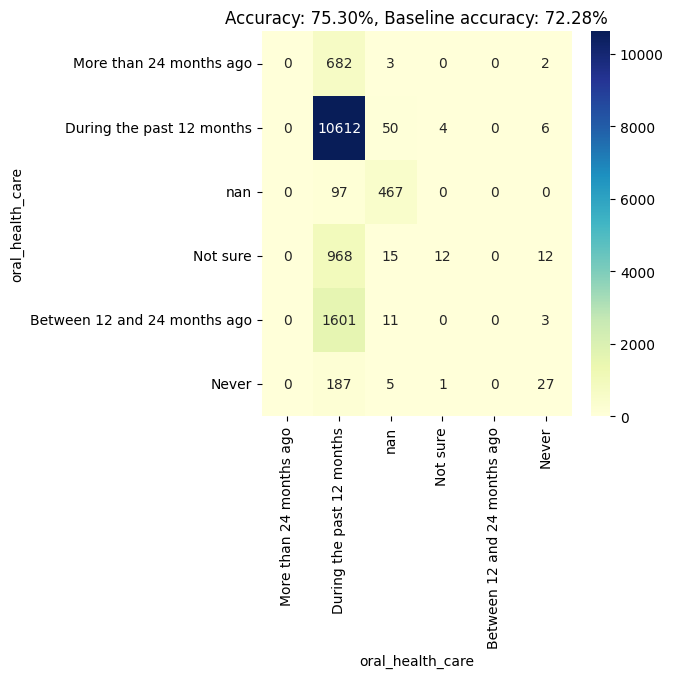

asthma


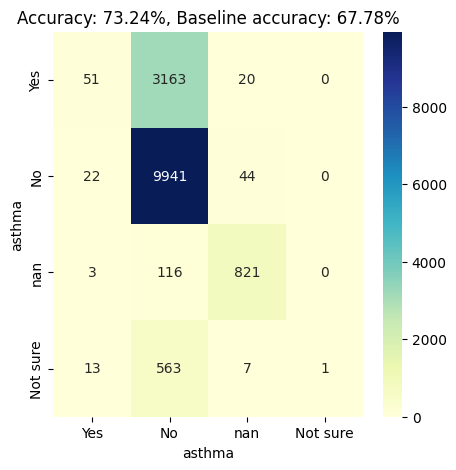

sleep_on_school_night


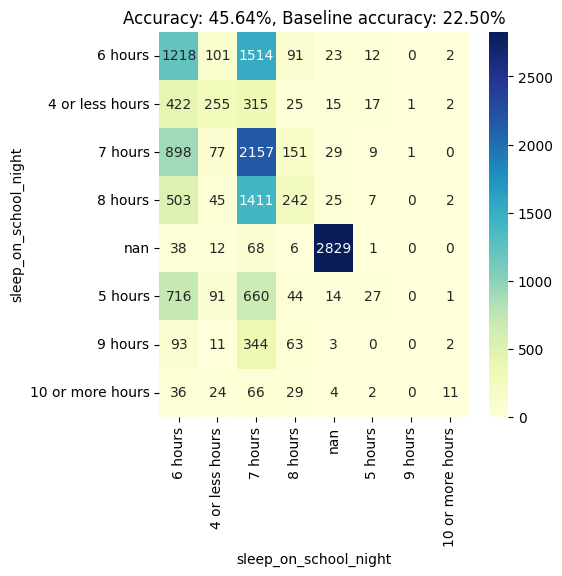

grades_in_school


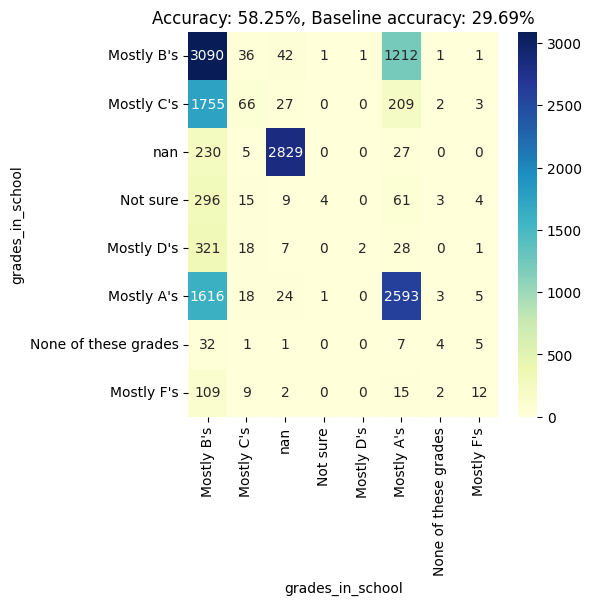

ever_used_LSD


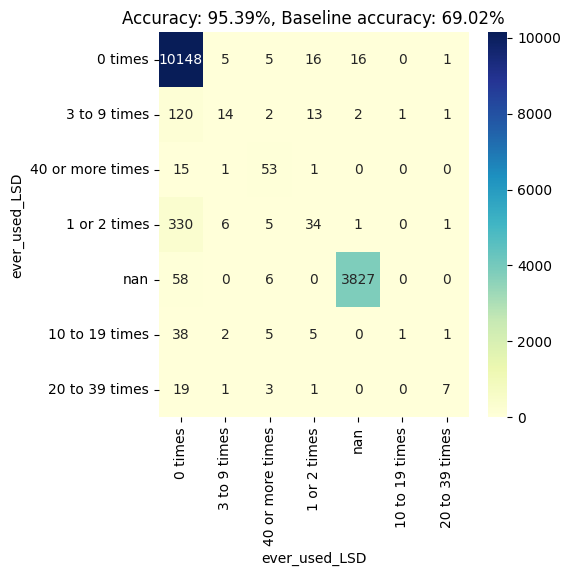

sports_drinks


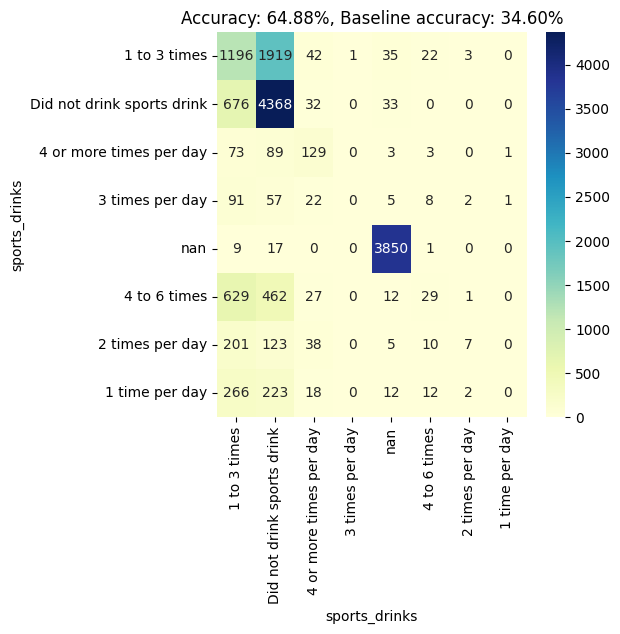

plain_water


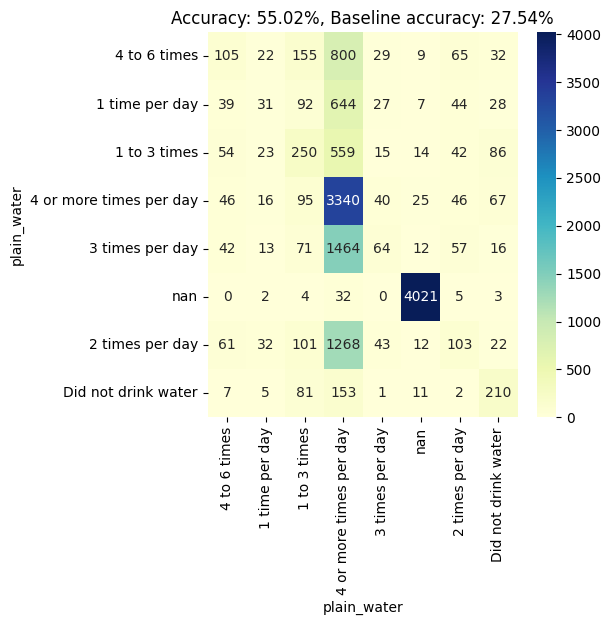

food_allergies


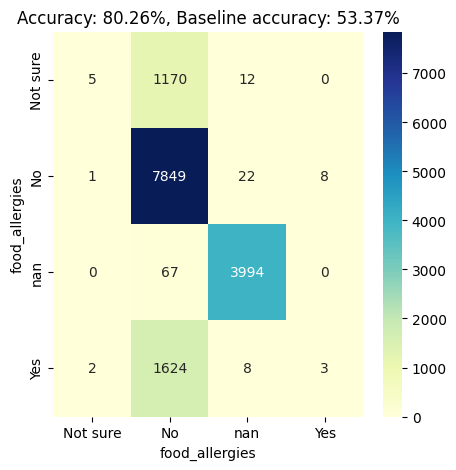

muscle_stregthening


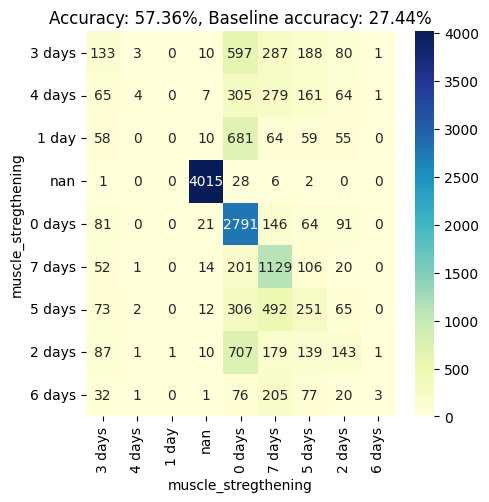

indoor_tanning


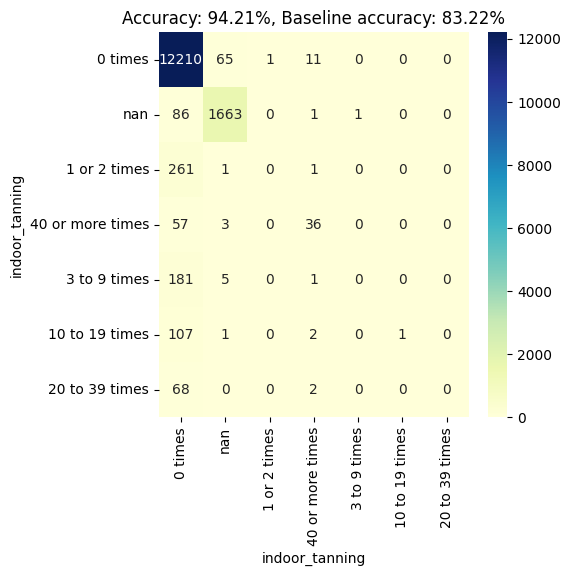

sunburn


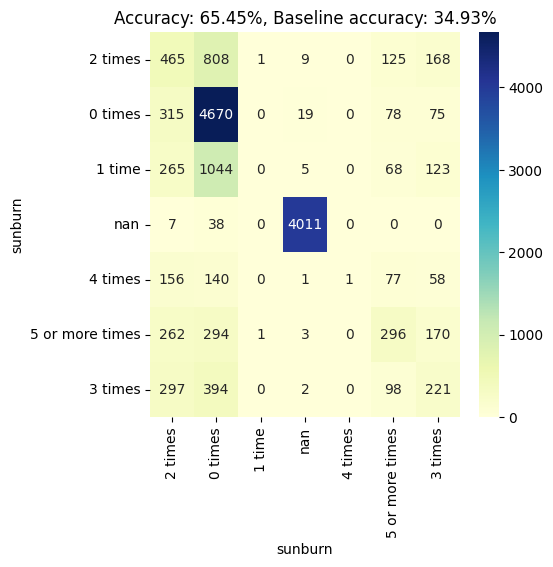

difficulty_concentrating


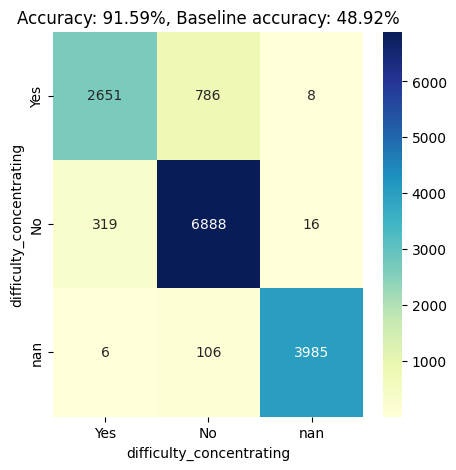

how_well_speak_English


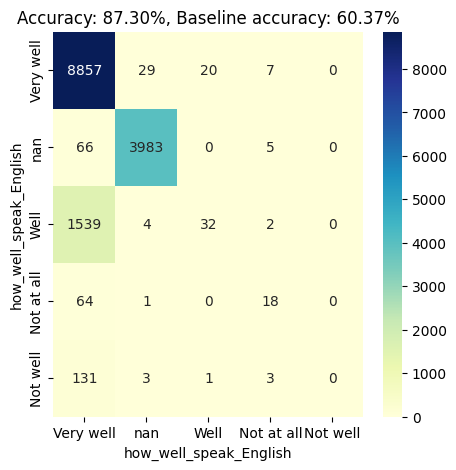

weight_cat


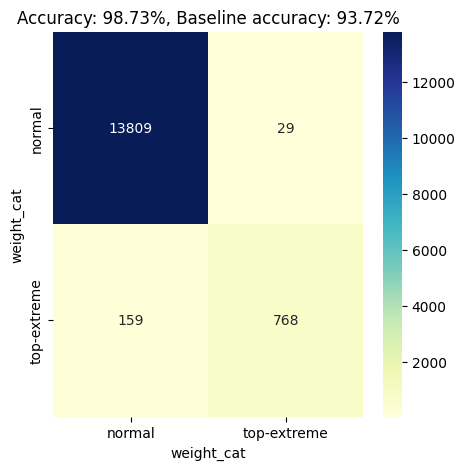

stheight_cat


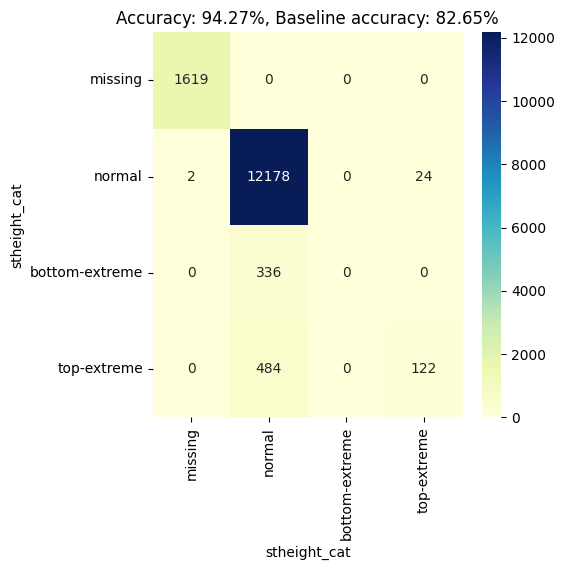

stweight_cat


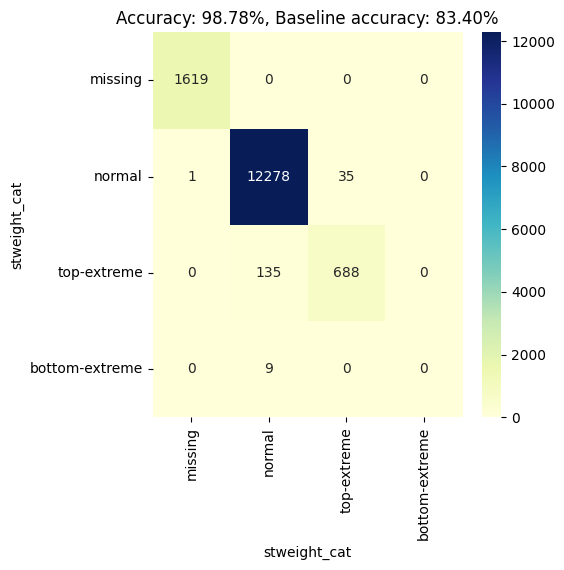

bmi_cat


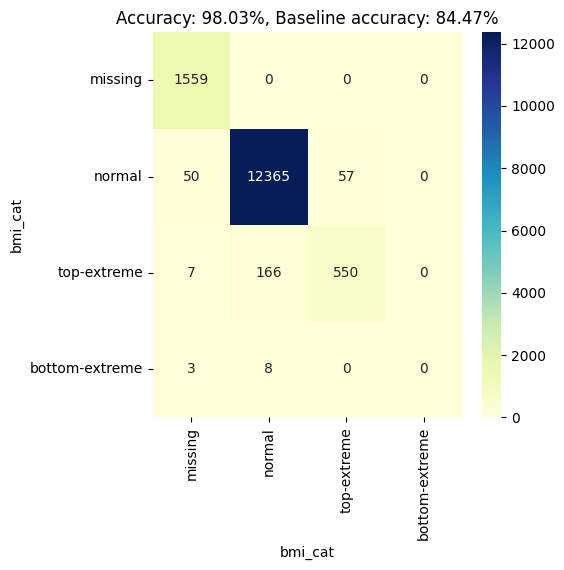

bmipct_cat


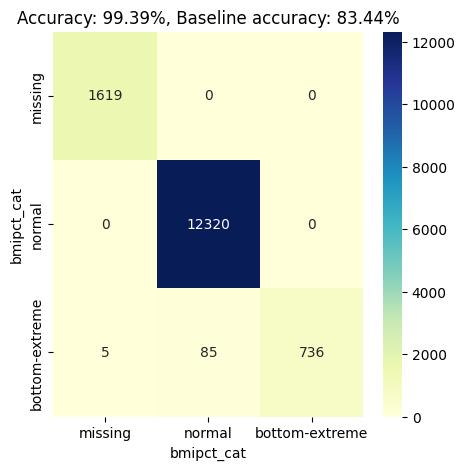

In [ ]:

def create_scatterplot_for_categorical(original_df, predicted_df, categ_attr):
    # Create a list of all unique categories present in the original data
    all_categories = original_df[categ_attr].unique()

    # Create the confusion matrix using crosstab
    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])

    # Reindex the confusion matrix to include all categories in the original data
    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    # Calculate accuracy
    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)
    accuracy = diagonal_sum / total_sum * 100

    # Calculate baseline accuracy
    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100


    plt.figure(figsize=(5, 5))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Accuracy: {accuracy:.2f}%, Baseline accuracy: {baseline_accuracy:.2f}%")
    plt.show()
    return accuracy, baseline_accuracy

result = []
for v in variable_types.keys():
  if variable_types[v] == 'categorical':
    print(v)
    a,b = create_scatterplot_for_categorical(project_data, tabular_from_predicted, v)
    entry = { 'variable': v, 'accuracy': a, 'baseline_accuracy': b }
    result.append(entry)

result = pd.DataFrame(result)




In [ ]:
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.preprocessing import label_binarize

def calculate_extended_metrics(original_df, predicted_df, categ_attr):
    all_categories = original_df[categ_attr].unique()
    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])
    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)

    accuracy = diagonal_sum / total_sum * 100
    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100

    # One-vs-All ROC and AUC
    y_true = label_binarize(original_df[categ_attr], classes=all_categories)
    y_pred = label_binarize(predicted_df[categ_attr], classes=all_categories)
    ova_roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr', average='macro')

    return accuracy, baseline_accuracy, ova_roc_auc

# Example usage:
# accuracy, baseline_accuracy, ova_roc_auc = calculate_extended_metrics_without_prob(original_df, predicted_df, categ_attr)


result = []
for v in variable_types.keys():
  if variable_types[v] == 'categorical':
    print(v)
    if v.endswith("_cat"): continue # do not analyze numeric vars for now
    a,b, c = calculate_extended_metrics(project_data, tabular_from_predicted, v)
    entry = { 'variable': v, 'accuracy': round(a,1), 'baseline_accuracy': round(b,1), 'ova_auc': c, 'lift': round(a/b,2) }
    result.append(entry)

df = pd.DataFrame(result)

df['lift'].mean()



age
sex
grade
Hispanic_or_Latino
race
obese
overweight
sexual_identity
sex/sexual_contacts
sexid
sexid2
sexpart
sexpart2
seat_belt_use
riding_with_a_drinking_driver
drinking_and_driving
texting_and_driving
weapon_carrying
weapon_carrying_at_school
safety_concerns_at_school
threatened_at_school
physical_fighting
physical_fighting_at_school
forced_sexual_intercourse
sexual_dating_violence
physical_dating_violence
bullying_at_school
electronic_bullying
sad_or_hopeless
considered_suicide
made_a_suicide_plan
attempted_suicide
injurious_suicide_attempt
ever_cigarette_use
current_cigarette_use
smoking_amounts_per_day
electronic_vapor_product_use
current_electronic_vapor_product_use
current_cigar_use
ever_alcohol_use
initiation_of_alcohol_use
current_alcohol_use
source_of_alcohol
largest_number_of_drinks
ever_marijuana_use
initiation_of_marijuana_use
current_marijuana_use
ever_cocaine_use
ever_inhalant_use
ever_heroin_use
ever_methamphetamine_use
ever_ecstasy_use
ever_synthetic_marijuana_use
e

1.4949462365591397

In [ ]:
df.sort_values(by='ova_auc', ascending=False).head(25)

,variable,accuracy,baseline_accuracy,ova_auc,lift
6,overweight,99.9,74.5,0.997630,1.34
56,ever_sexual_intercourse,99.1,54.6,0.992025,1.81
5,obese,98.6,75.9,0.977744,1.30
12,sexpart2,98.2,36.4,0.969924,2.70
8,sex/sexual_contacts,97.0,36.6,0.962175,2.65
61,condom_use,95.5,54.3,0.958489,1.76
10,sexid2,98.4,81.4,0.957760,1.21
11,sexpart,97.9,36.4,0.939035,2.69
91,difficulty_concentrating,91.6,48.9,0.924429,1.87
9,sexid,97.2,81.4,0.921435,1.19


In [ ]:
df.sort_values(by=['ova_auc','baseline_accuracy'], ascending=True).head(25)

,variable,accuracy,baseline_accuracy,ova_auc,lift
14,riding_with_a_drinking_driver,83.5,83.2,0.513183,1.00
20,threatened_at_school,93.4,93.2,0.525068,1.00
18,weapon_carrying_at_school,94.7,94.2,0.546489,1.01
22,physical_fighting_at_school,90.0,89.2,0.557695,1.01
37,current_electronic_vapor_product_use,78.5,75.7,0.568360,1.04
38,current_cigar_use,91.4,90.0,0.572531,1.02
34,current_cigarette_use,90.9,89.3,0.580856,1.02
80,oral_health_care,75.3,72.3,0.590459,1.04
73,breakfast_eating,49.6,28.0,0.594044,1.77
71,soda_drinking,44.3,37.0,0.595506,1.20


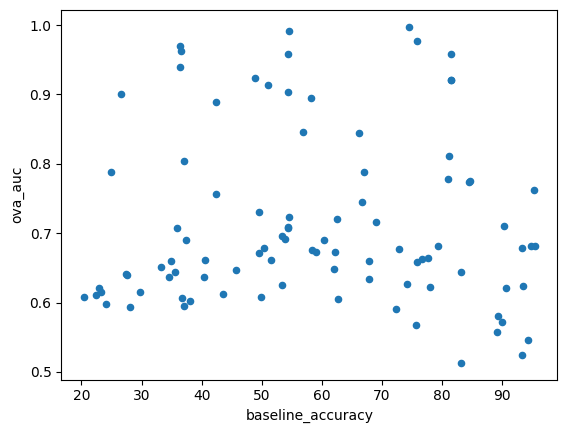

In [ ]:
df.plot(x='baseline_accuracy', y='ova_auc', kind='scatter')
plt.show()

Variational Autoencoder Loading

In [19]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import custom_object_scope
import gcsfs




# Define the path to the file on GCS
gcs_model_path = "gs://autoencoder_census_models/best_parameters_variationalautoencoder.keras"

# Define the local path where the model will be downloaded
local_model_path = "best_parameters_variationalautoencoder.keras"

# Create a GCS filesystem object using your project ID
fs = gcsfs.GCSFileSystem(project='autoencoder-census')

# Download the model file from GCS
with fs.open(gcs_model_path, 'rb') as gcs_file:
    with open(local_model_path, 'wb') as local_file:
        local_file.write(gcs_file.read())


# Initialize AutoencoderModel with attribute_cardinalities
# to use the custom loss function
attr_cardinalities = list(project_data.describe().T['unique'].values)
variational_autoencoder_model = VariationalAutoencoderModel(attr_cardinalities)


# Load the model from the local file
model = load_model(local_model_path, safe_mode = False)

Make Predictions and Fill in the Missing Value

In [20]:
filled = vectorized_df.fillna(vectorized_df.median())

epsilon = 1e-5
old_filled = None

while old_filled is None or np.abs(filled - old_filled).sum().sum() > epsilon:
  old_filled = filled.copy()
  predicted = model.predict(filled)
  mask = vectorized_df.isna()
  filled[mask] = np.where(mask, predicted, filled)

462/462 [==============================] - 7s 6ms/step


In [21]:
predicted = pd.DataFrame(model.predict(filled))
predicted.columns = filled.columns

462/462 [==============================] - 4s 8ms/step


In [22]:
tabular_from_predicted = vectorizer.tabularize_vector(predicted)

Visualization of the original vs. the reconstructed

In [23]:
def create_scatterplot_for_numeric(original_df, predicted_df, numeric_attr):
  plt.figure(figsize=(10, 6))
  plt.scatter(original_df[numeric_attr], predicted_df[numeric_attr], s=1)
  plt.xlabel(f'Original Data ({numeric_attr})')
  plt.ylabel(f'Reconstructed Data ({numeric_attr})')
  plt.title(f'Scatterplot for {numeric_attr}')
  plt.show()

for v in variable_types.keys():
  if variable_types[v] == 'numeric':
    print(v)
    create_scatterplot_for_numeric(project_data, tabular_from_predicted, v)

age


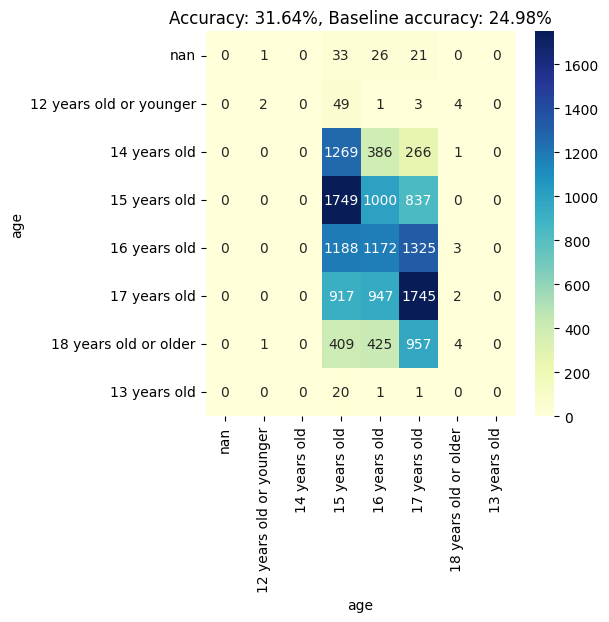

sex


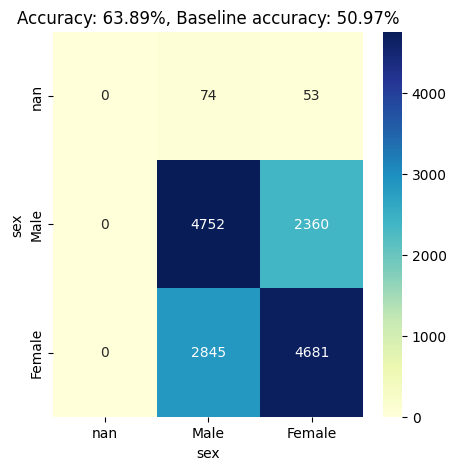

grade


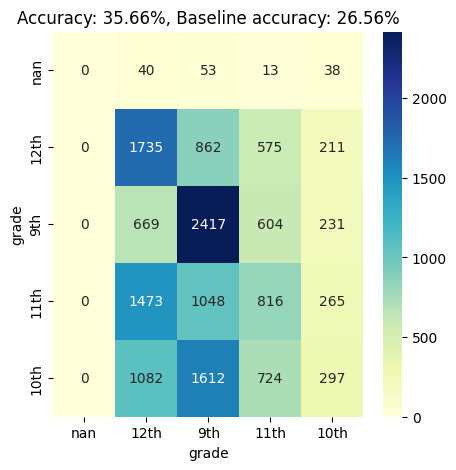

Hispanic_or_Latino


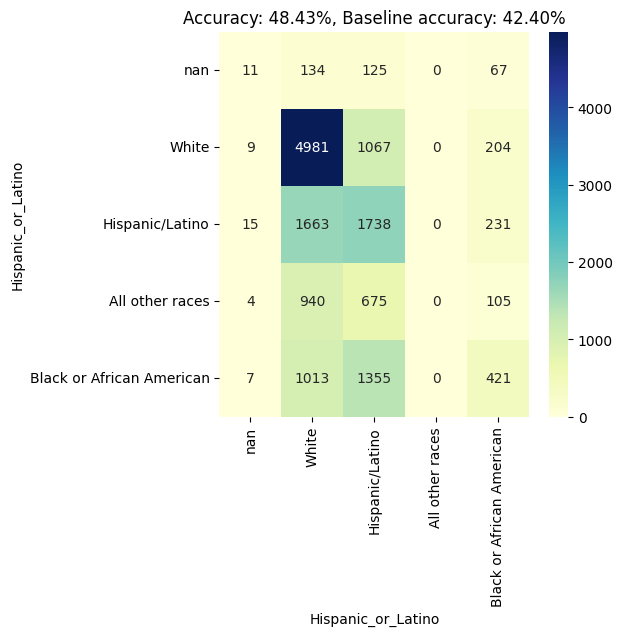

race


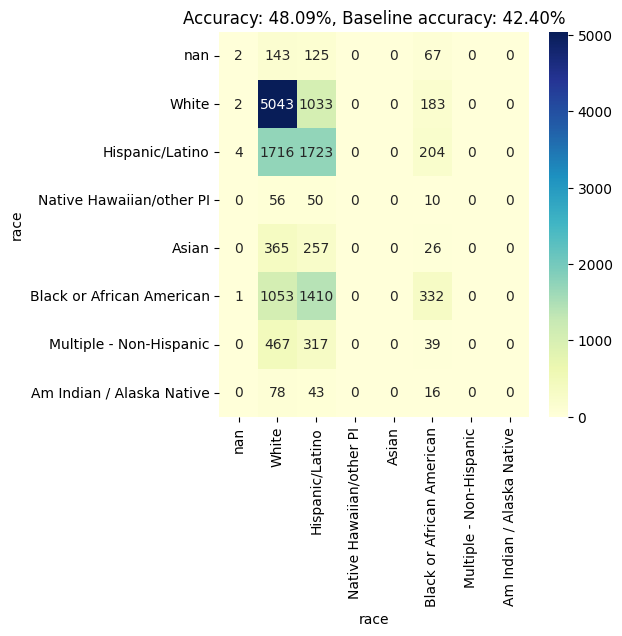

obese


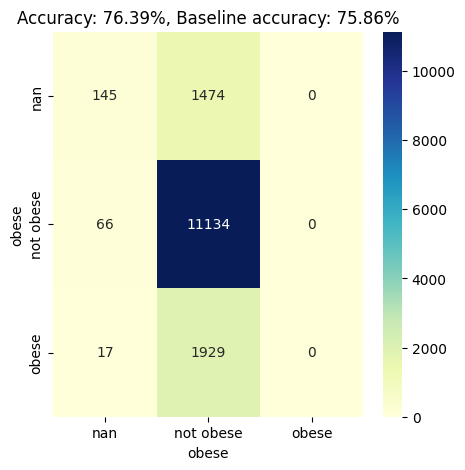

overweight


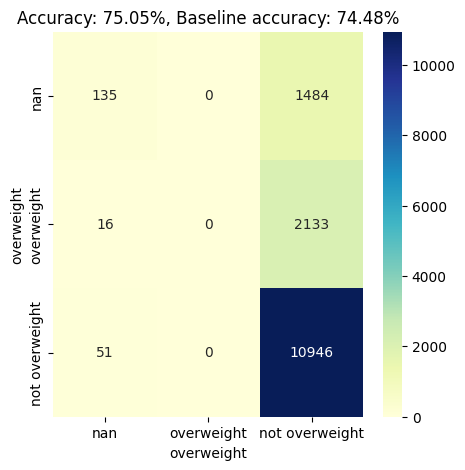

sexual_identity


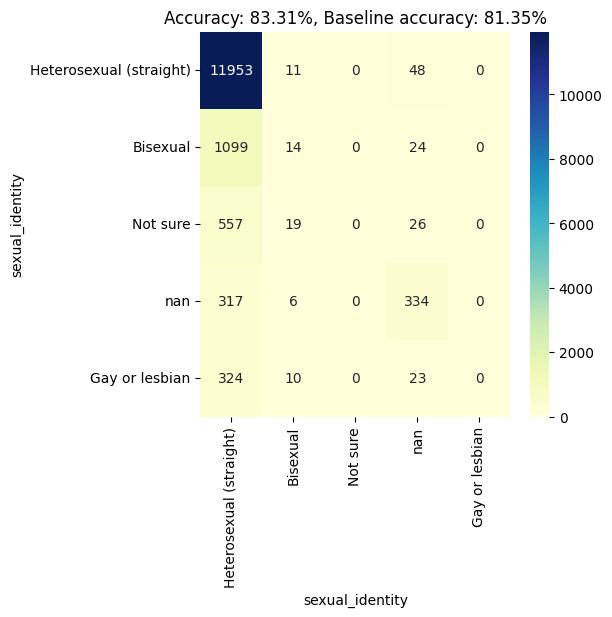

sex/sexual_contacts


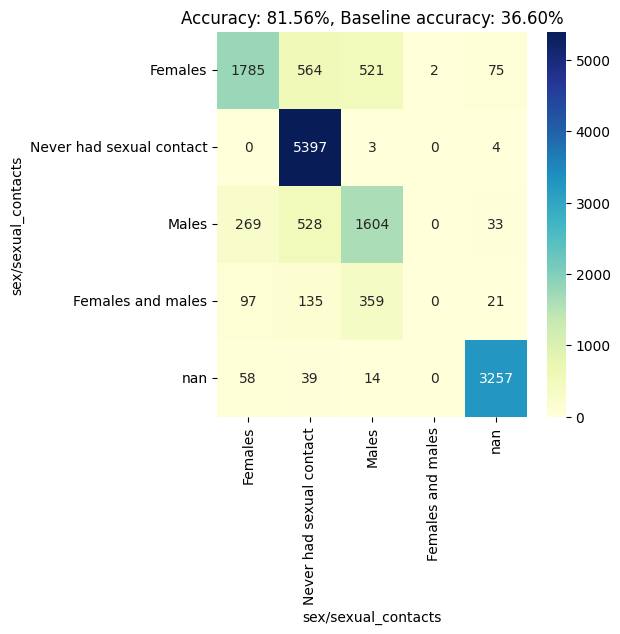

sexid


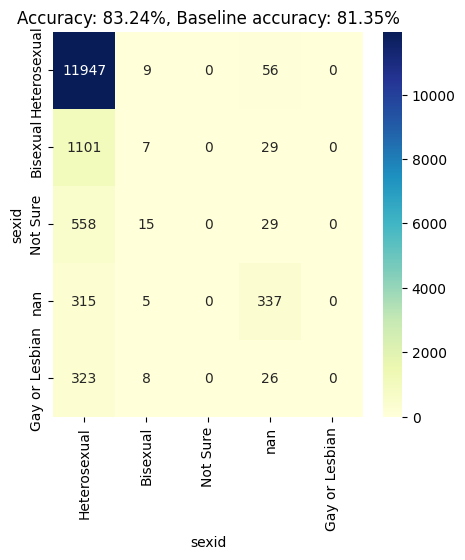

sexid2


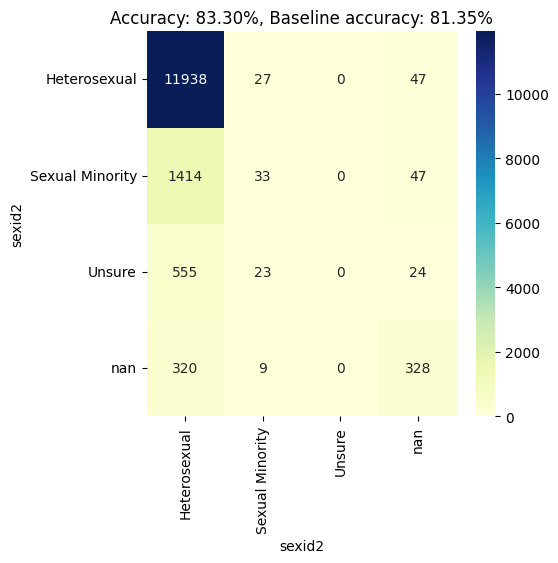

sexpart


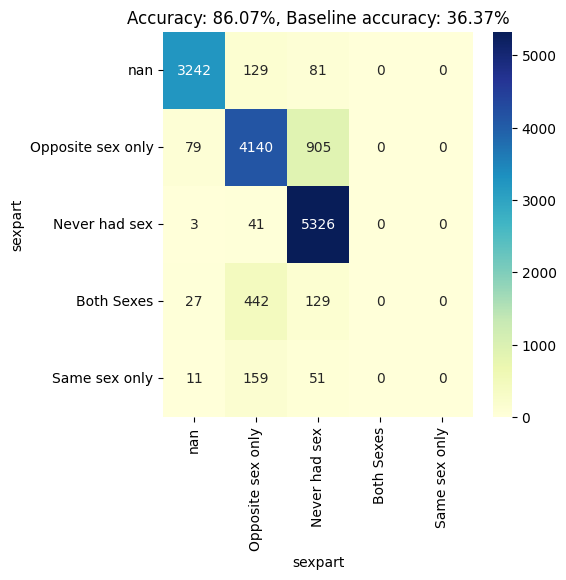

sexpart2


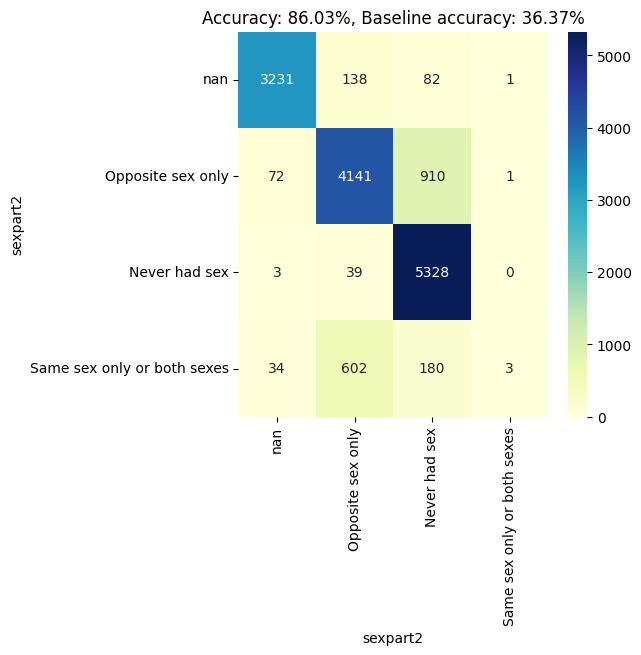

seat_belt_use


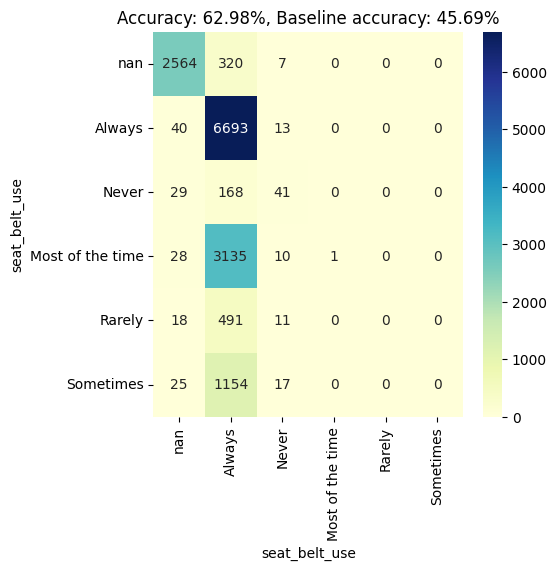

riding_with_a_drinking_driver


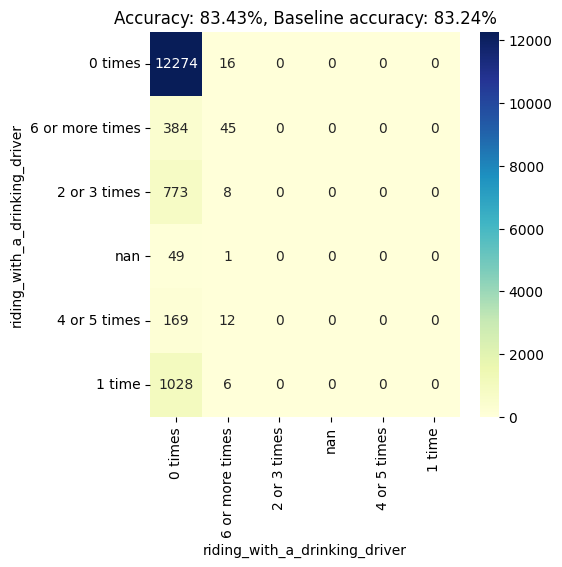

drinking_and_driving


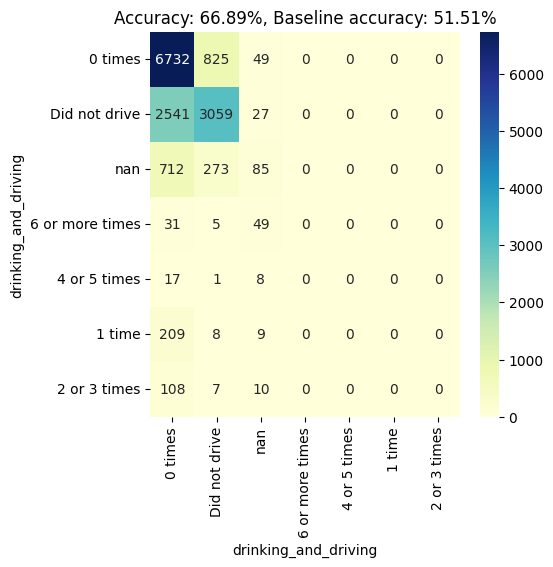

texting_and_driving


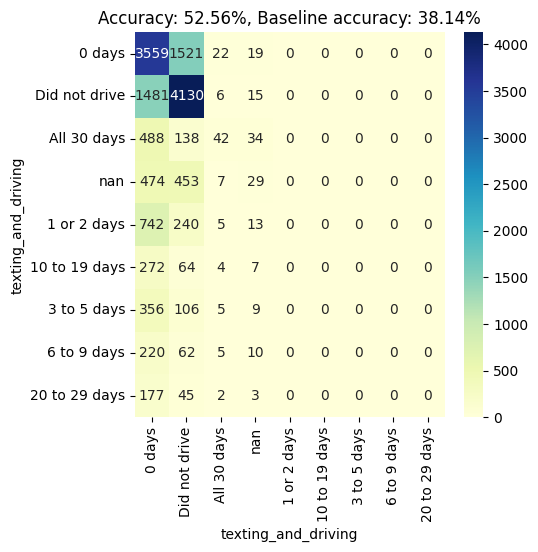

weapon_carrying


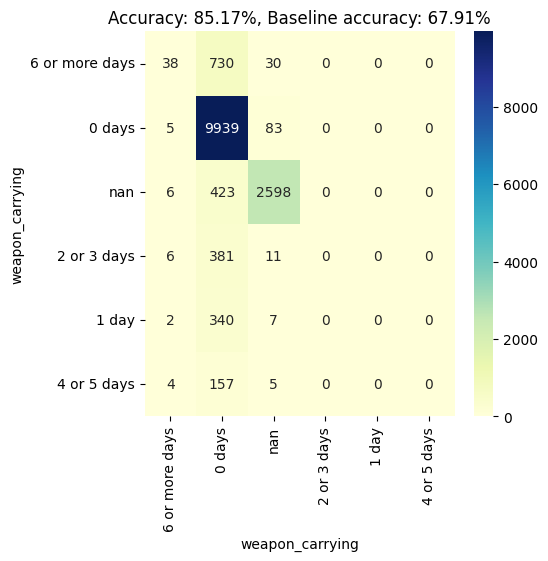

weapon_carrying_at_school


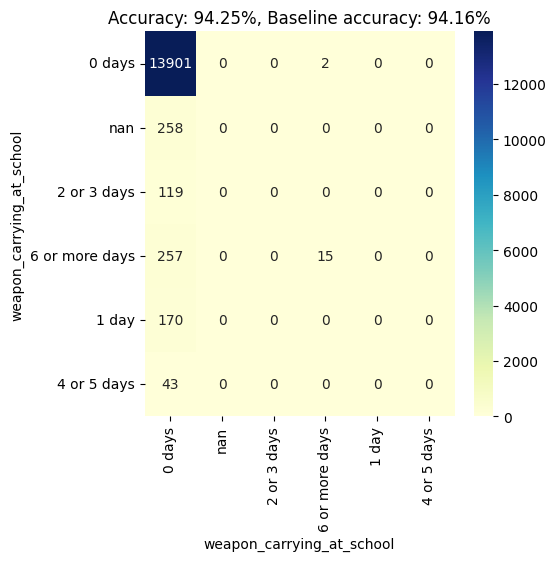

safety_concerns_at_school


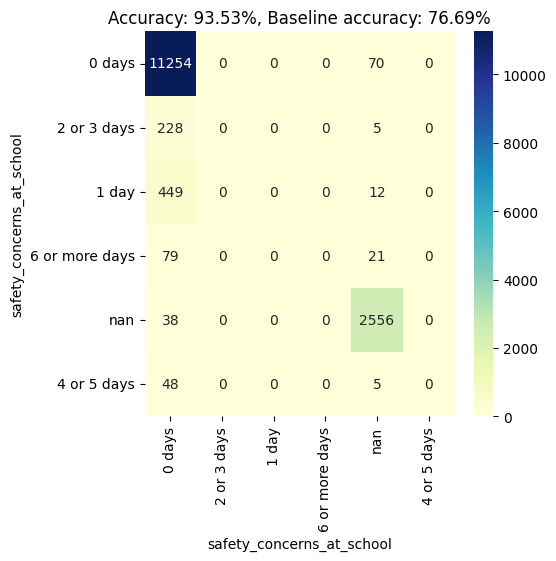

threatened_at_school


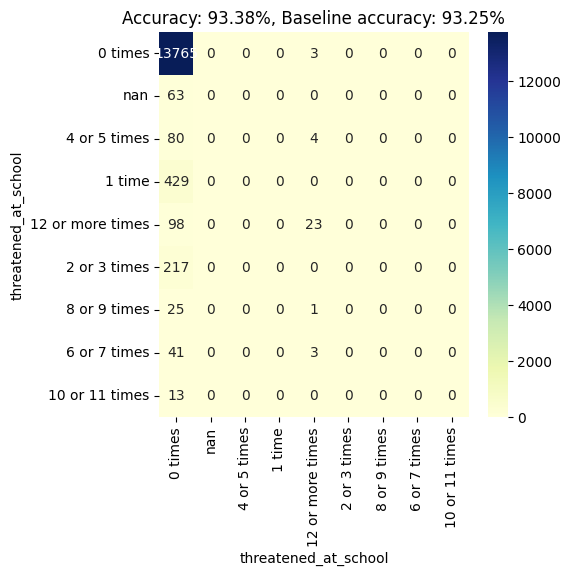

physical_fighting


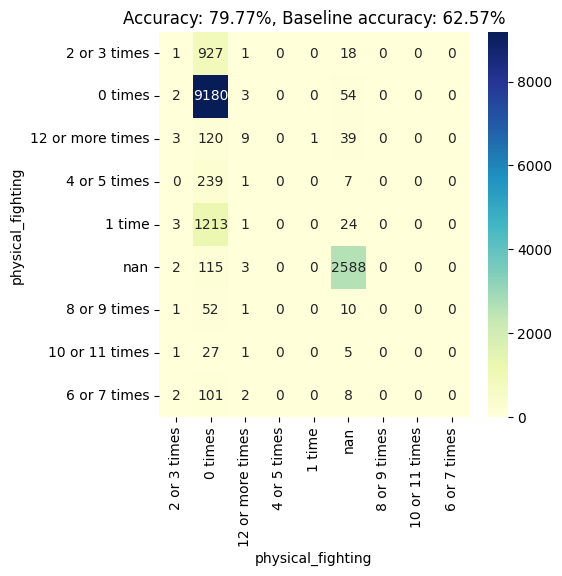

physical_fighting_at_school


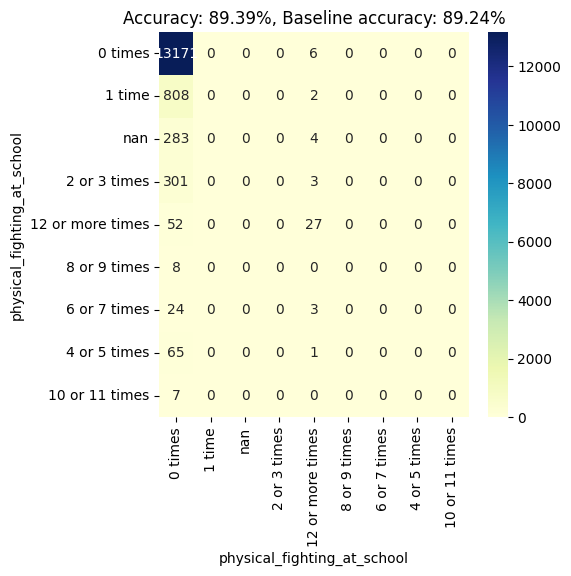

forced_sexual_intercourse


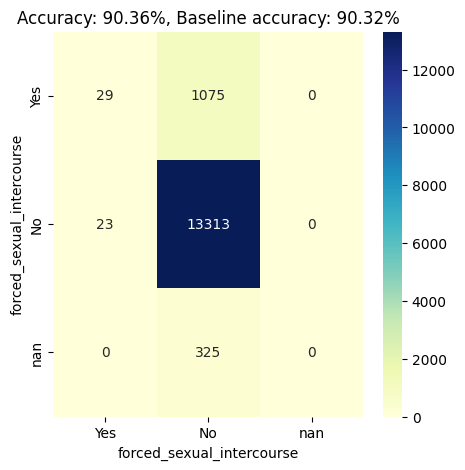

sexual_dating_violence


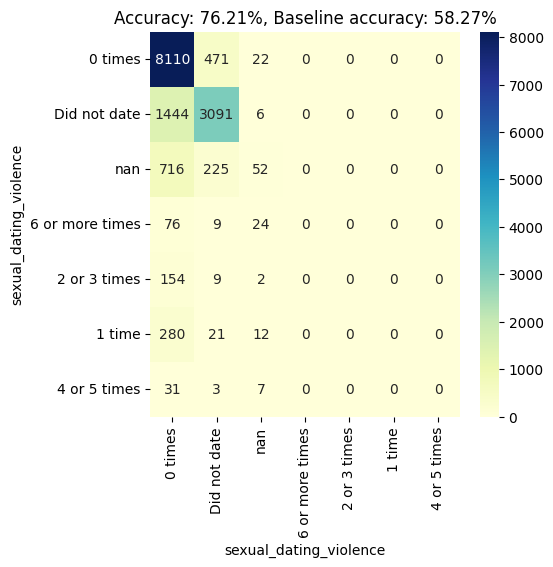

physical_dating_violence


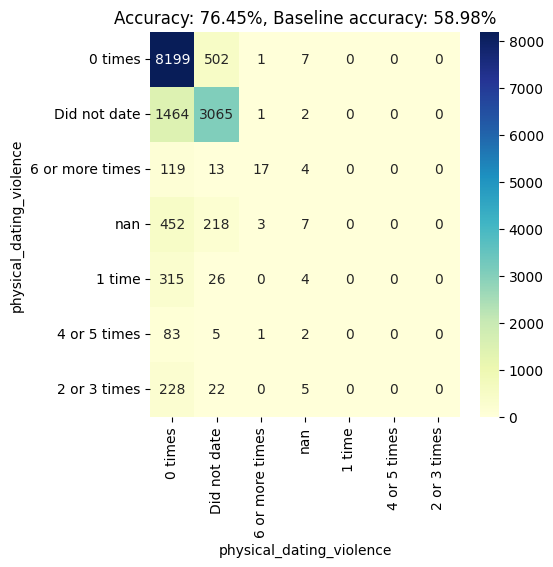

bullying_at_school


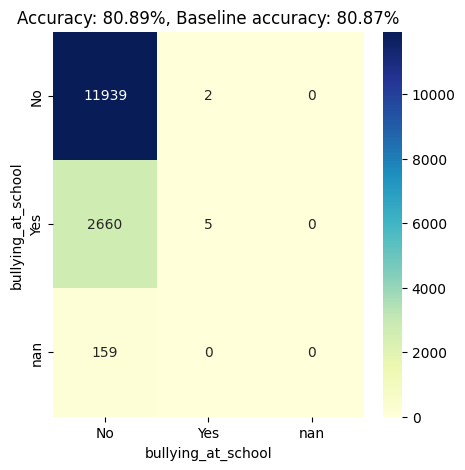

electronic_bullying


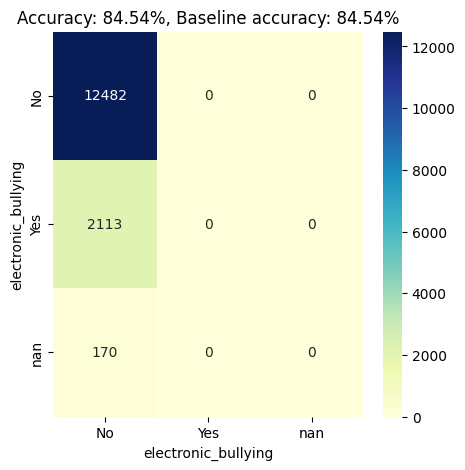

sad_or_hopeless


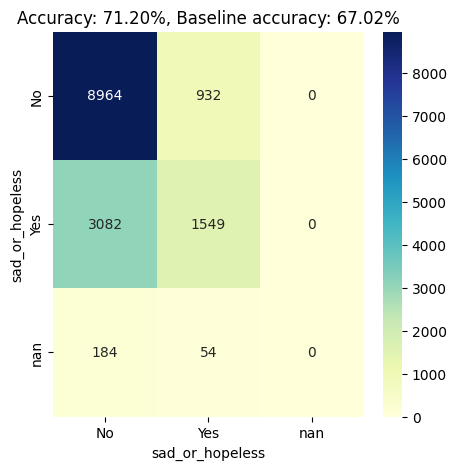

considered_suicide


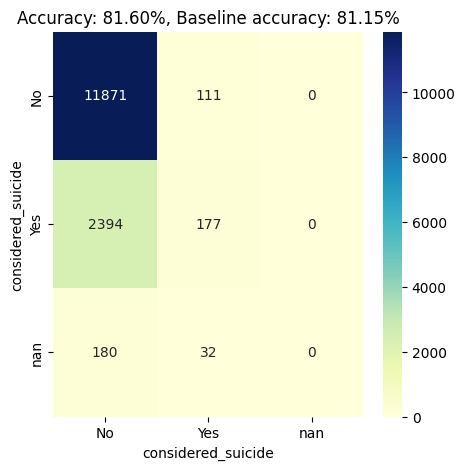

made_a_suicide_plan


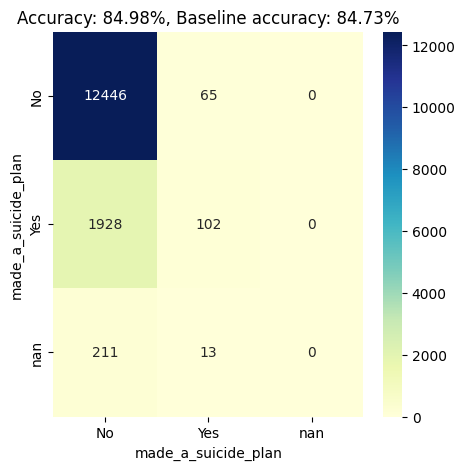

attempted_suicide


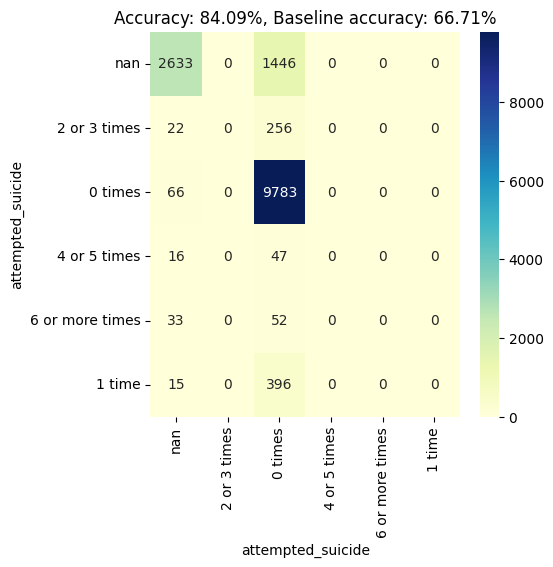

injurious_suicide_attempt


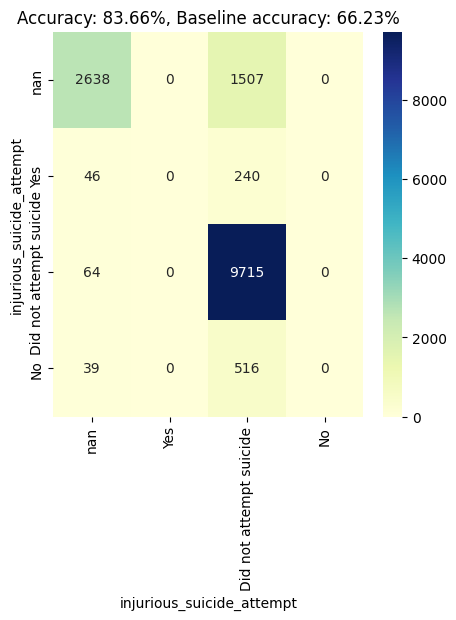

ever_cigarette_use


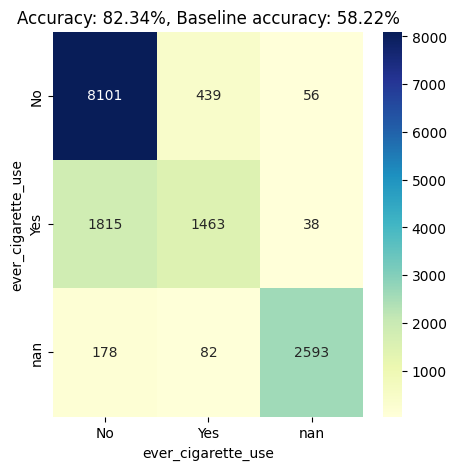

current_cigarette_use


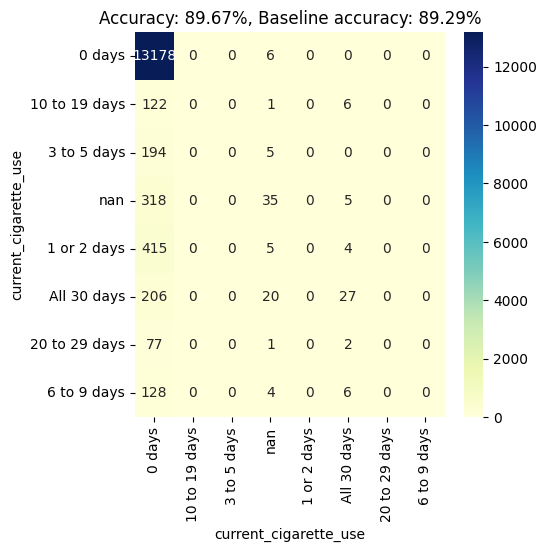

smoking_amounts_per_day


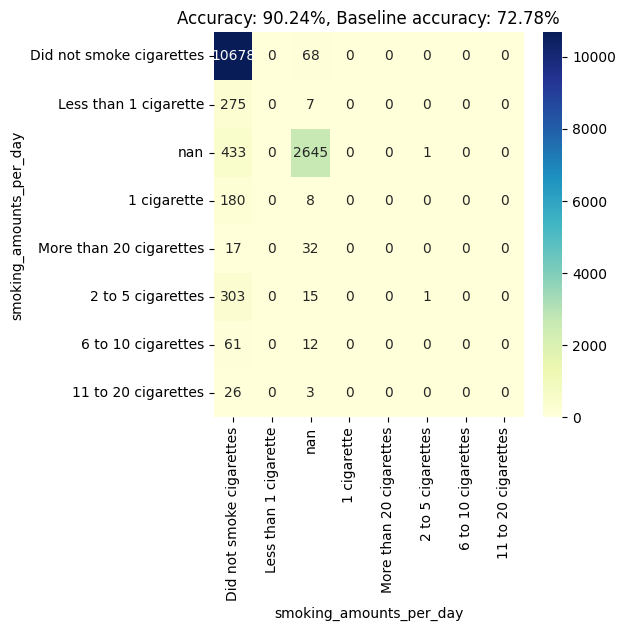

electronic_vapor_product_use


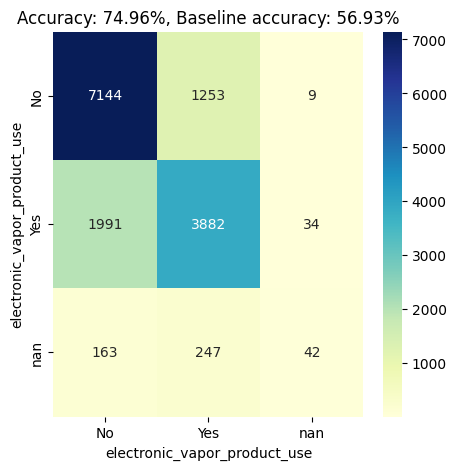

current_electronic_vapor_product_use


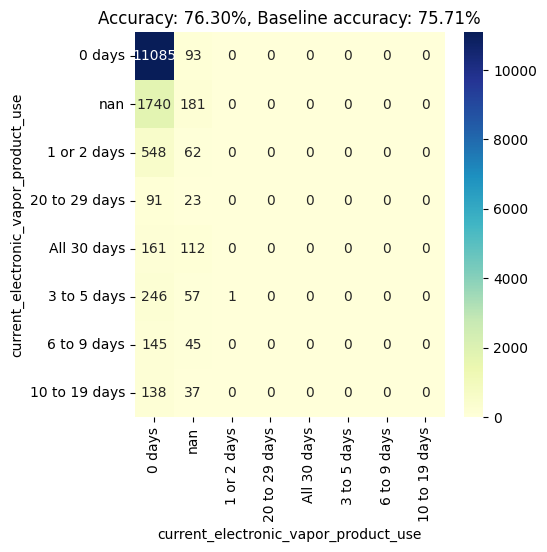

current_cigar_use


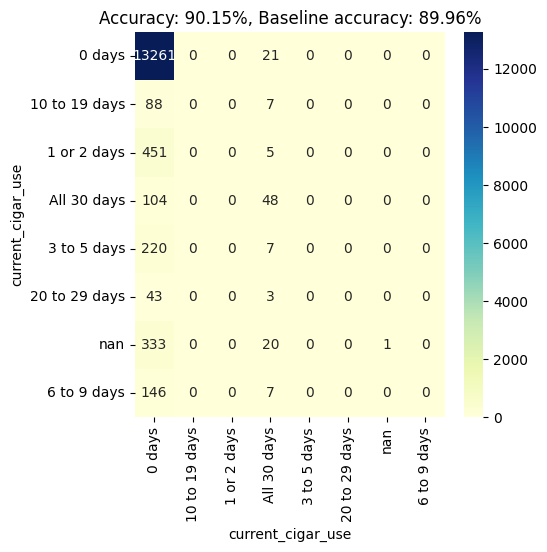

ever_alcohol_use


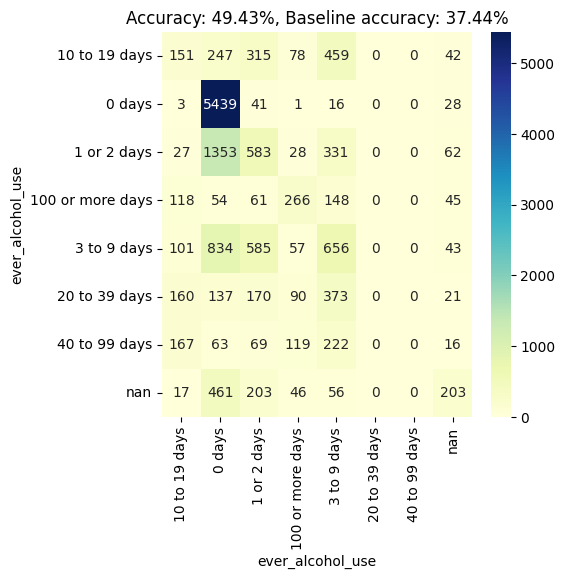

initiation_of_alcohol_use


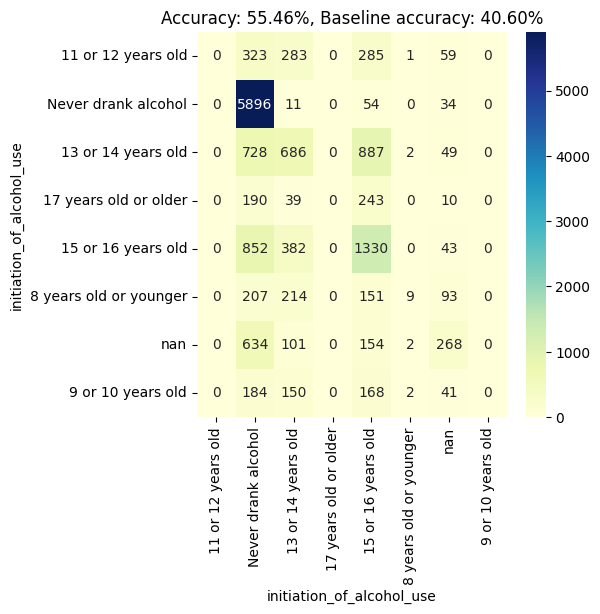

current_alcohol_use


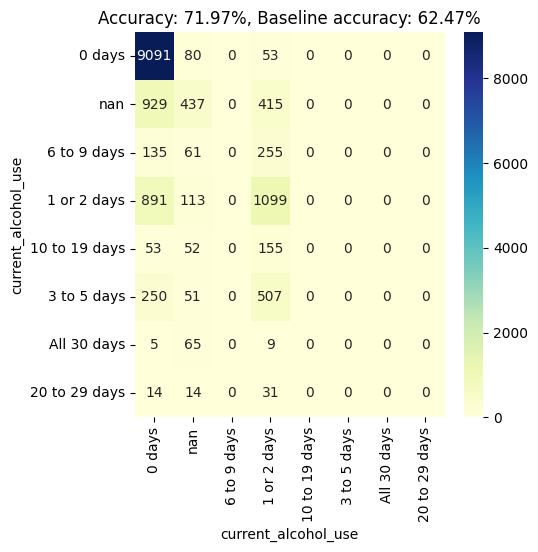

source_of_alcohol


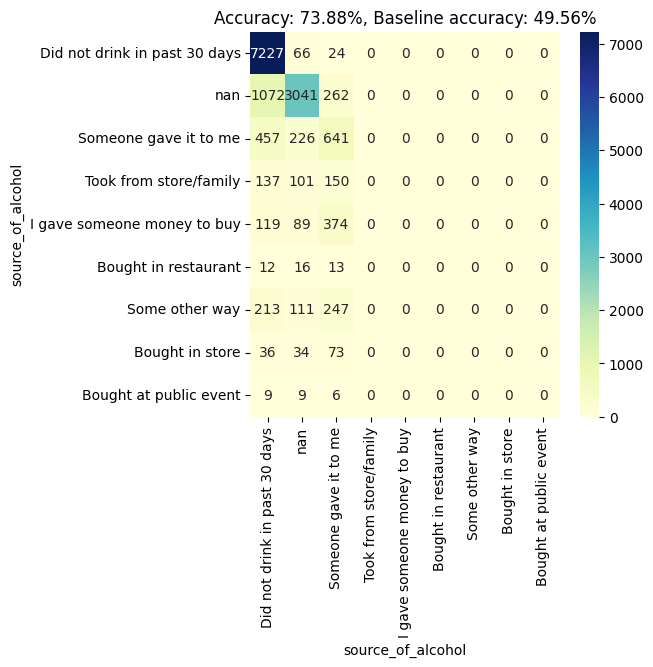

largest_number_of_drinks


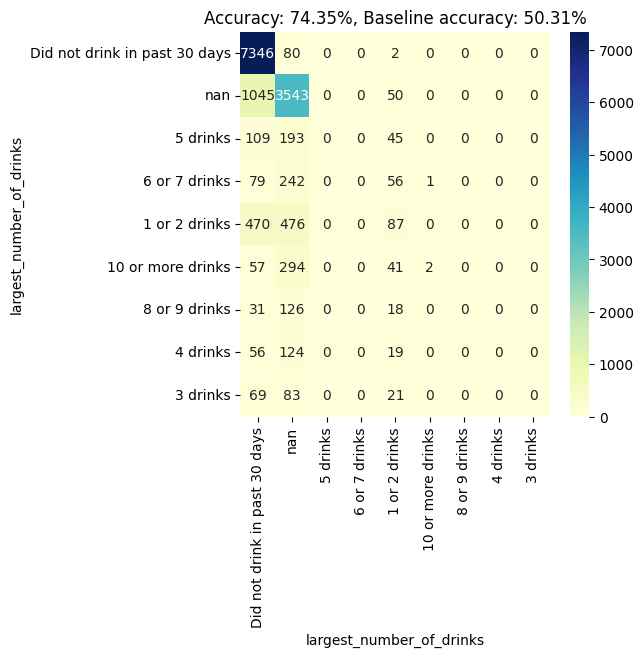

ever_marijuana_use


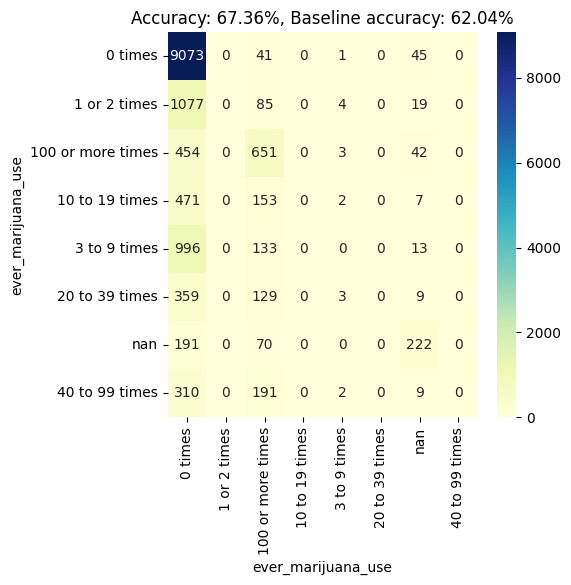

initiation_of_marijuana_use


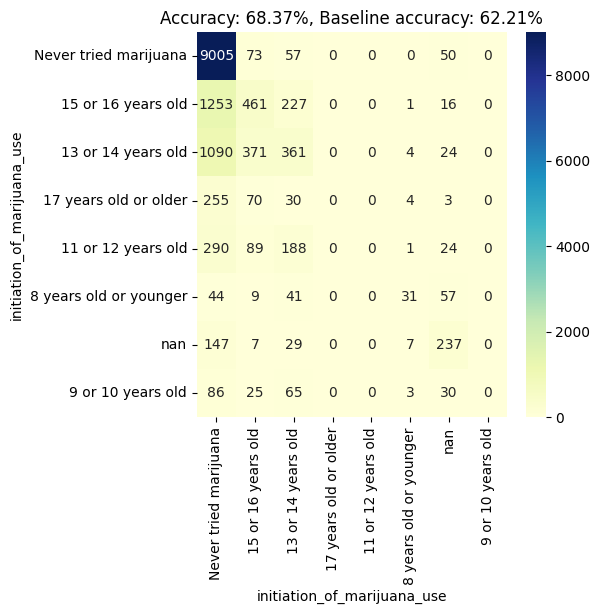

current_marijuana_use


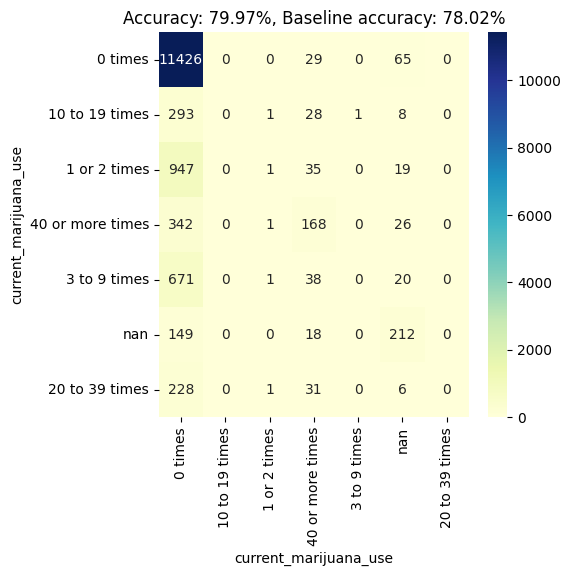

ever_cocaine_use


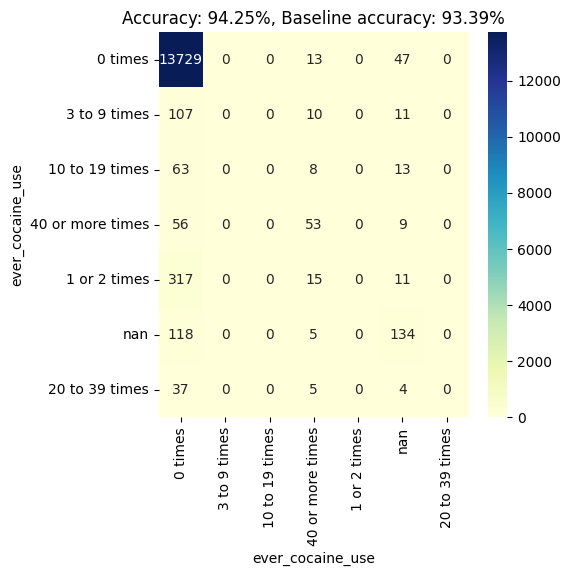

ever_inhalant_use


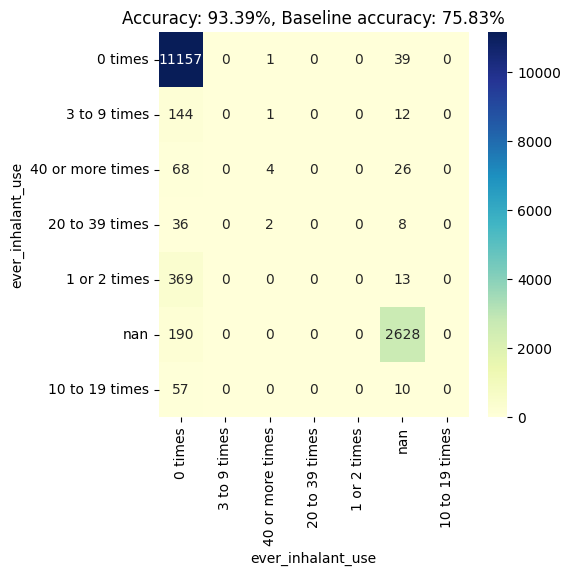

ever_heroin_use


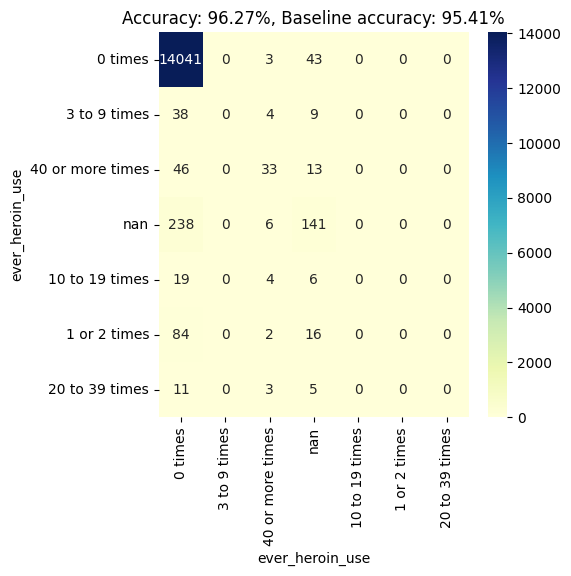

ever_methamphetamine_use


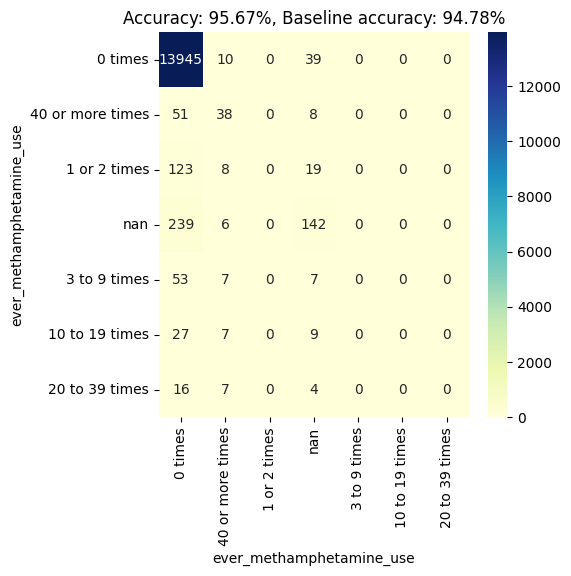

ever_ecstasy_use


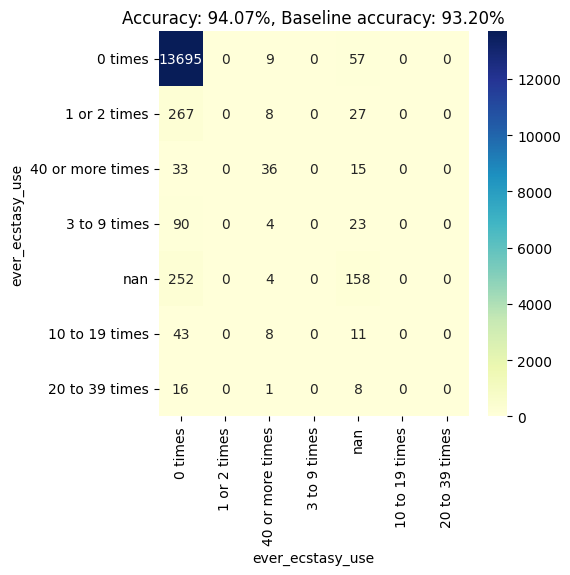

ever_synthetic_marijuana_use


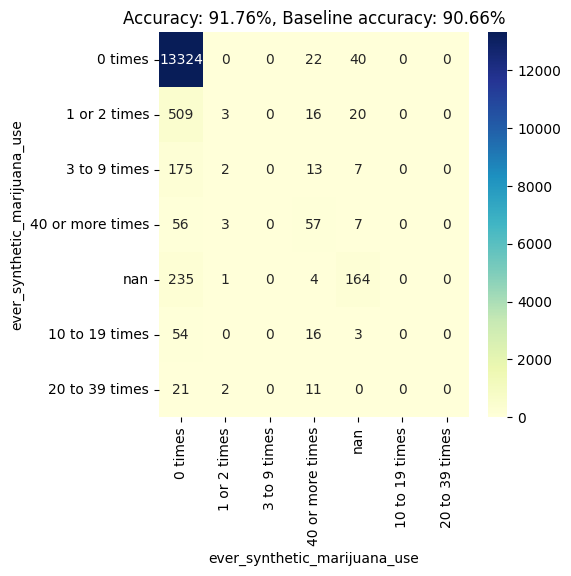

ever_steroid_use


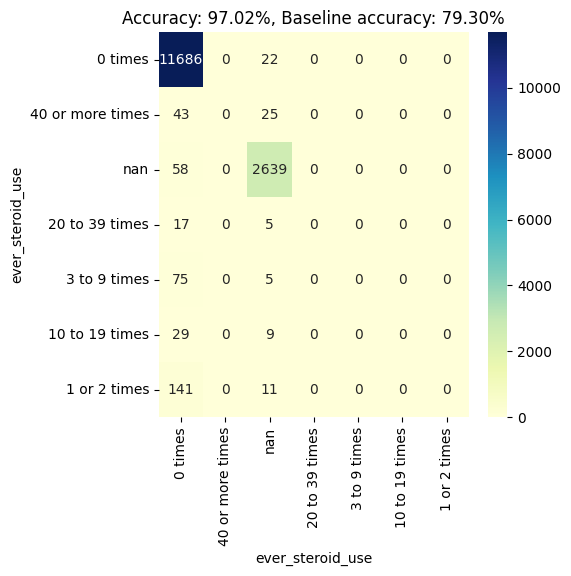

illegal_injected_drug_use


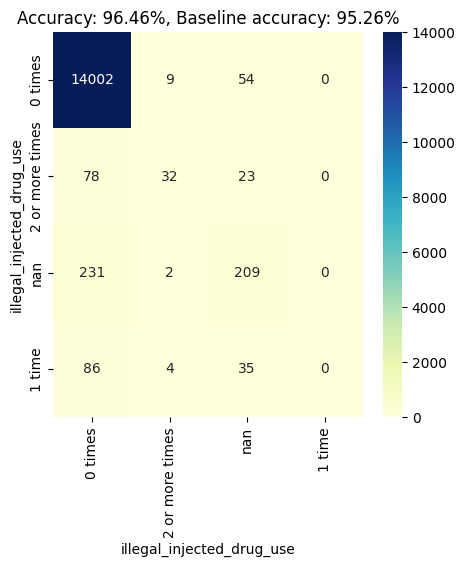

illegal_drugs_at_school


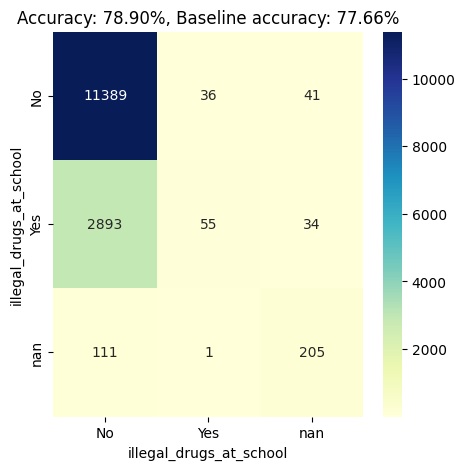

ever_sexual_intercourse


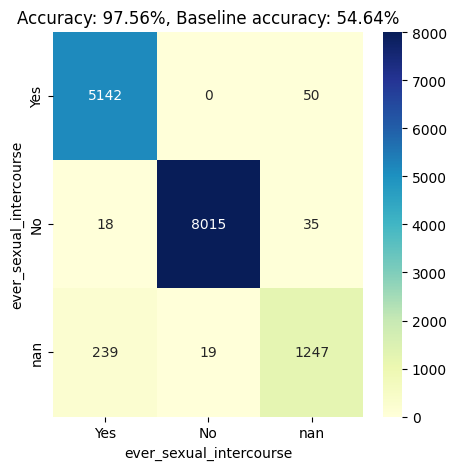

first_sex_intercourse


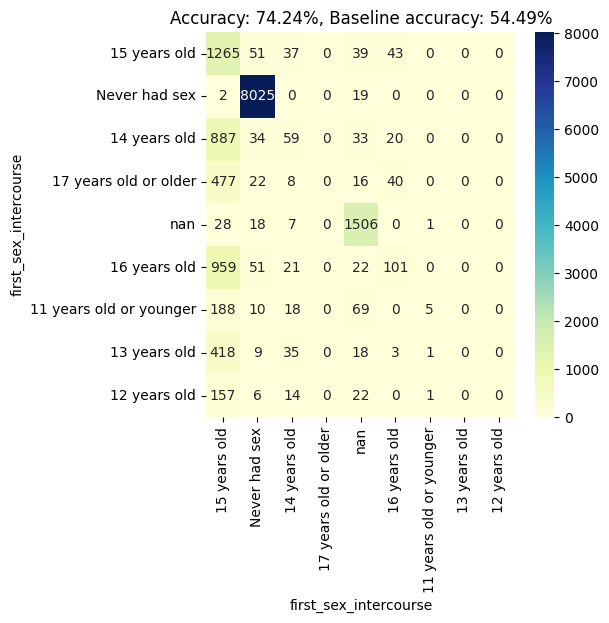

multiple_sex_partners


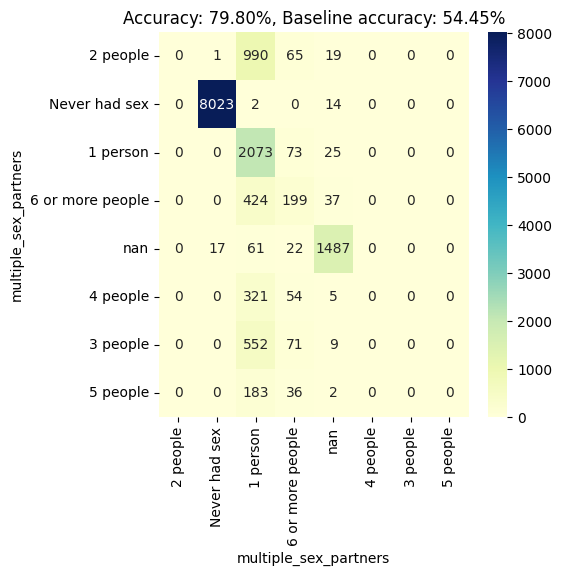

current_sexual_activity


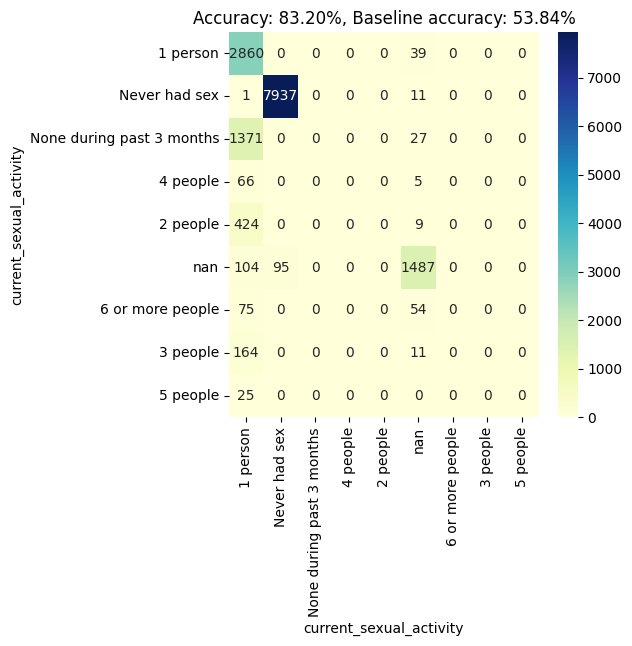

alcohol/drugs_at_sex


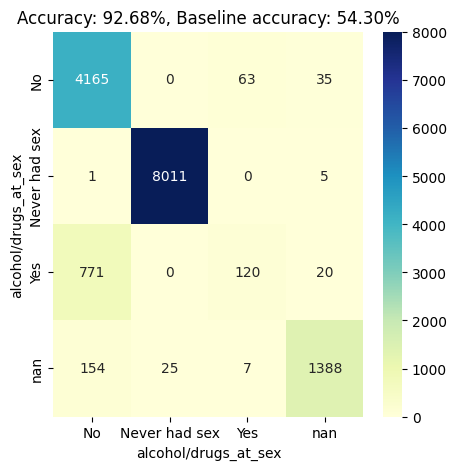

condom_use


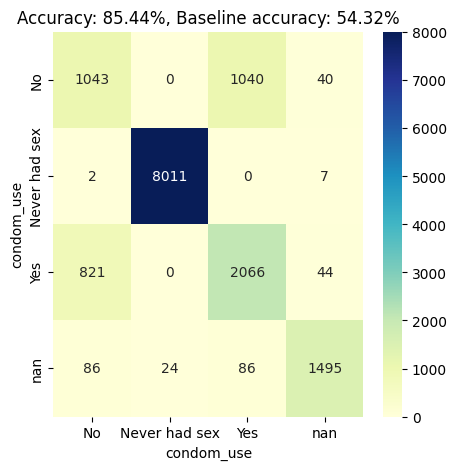

birth_control_pill_use


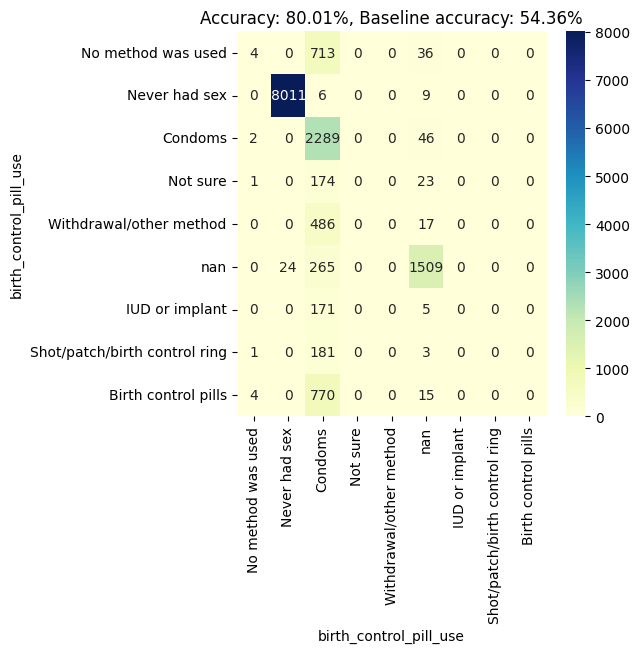

perception_of_weight


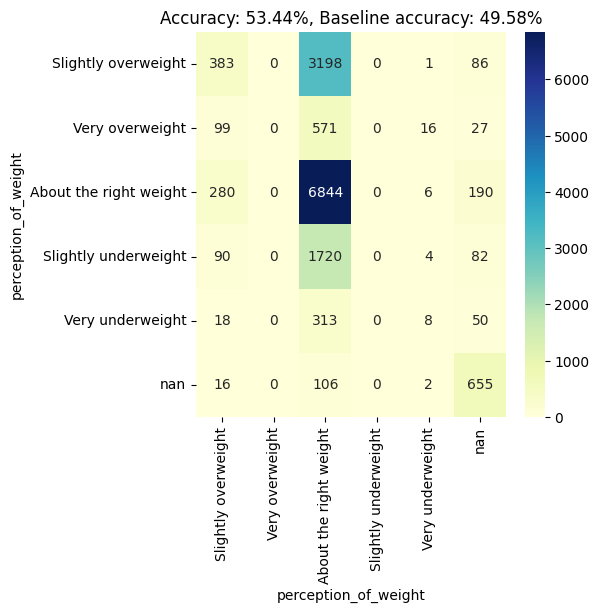

weight_loss


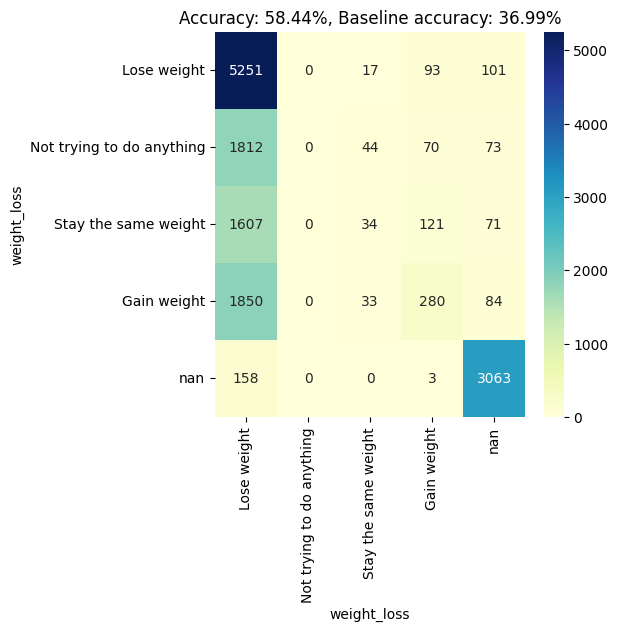

fruit_juice_drinking


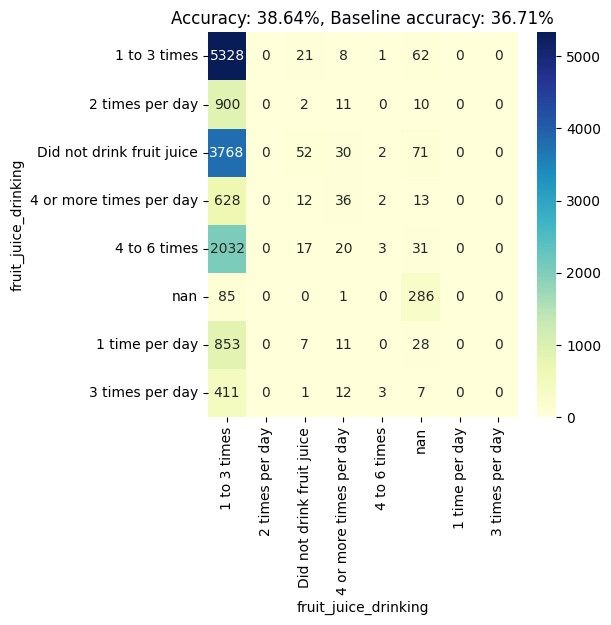

fruit_eating


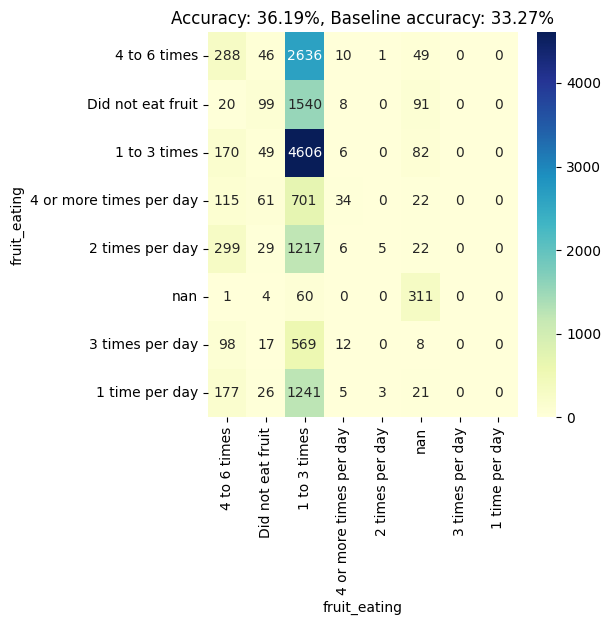

green _salad_eating


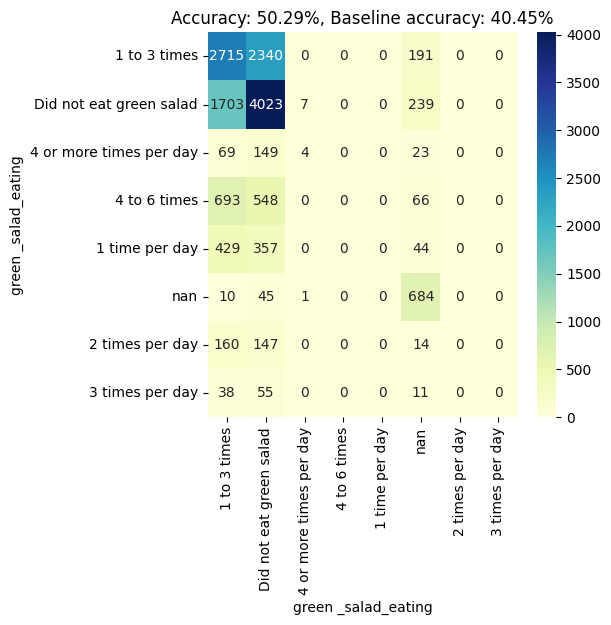

potato_eating


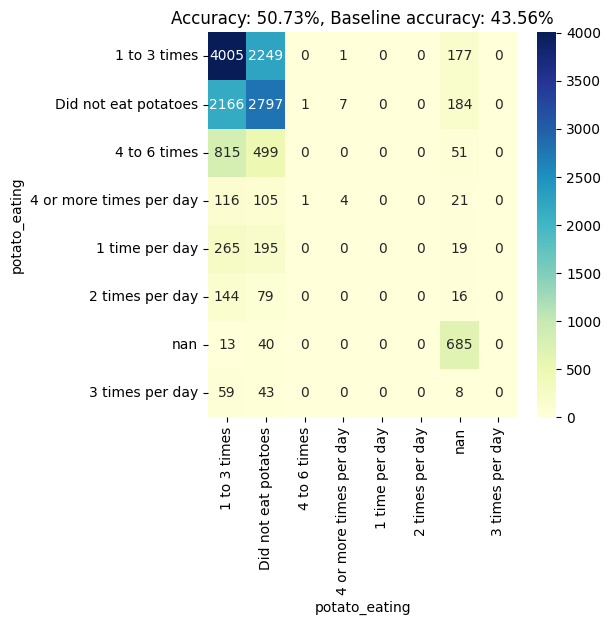

carrot_eating


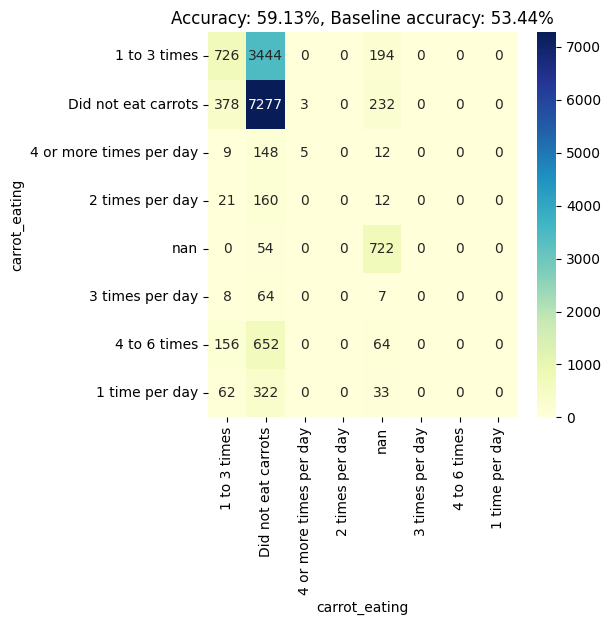

other_vegetable_eating


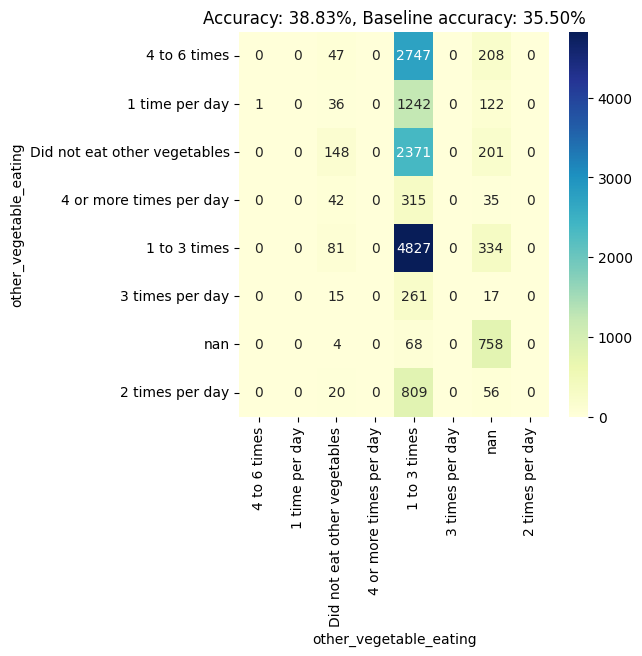

soda_drinking


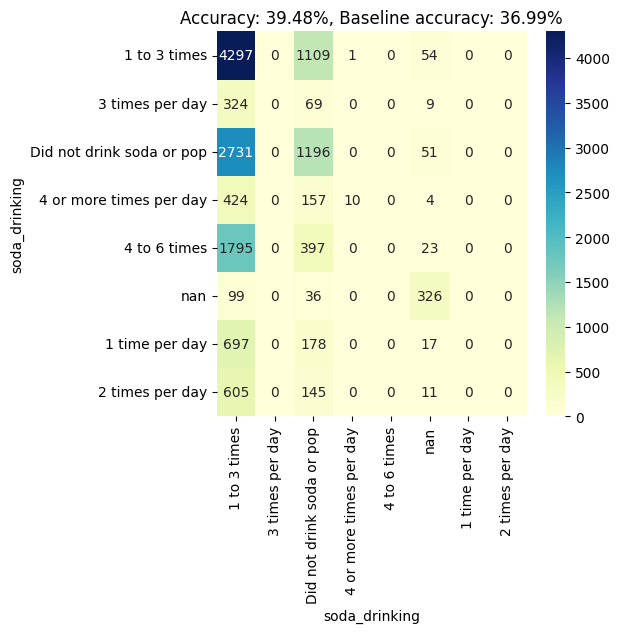

milk_drinking


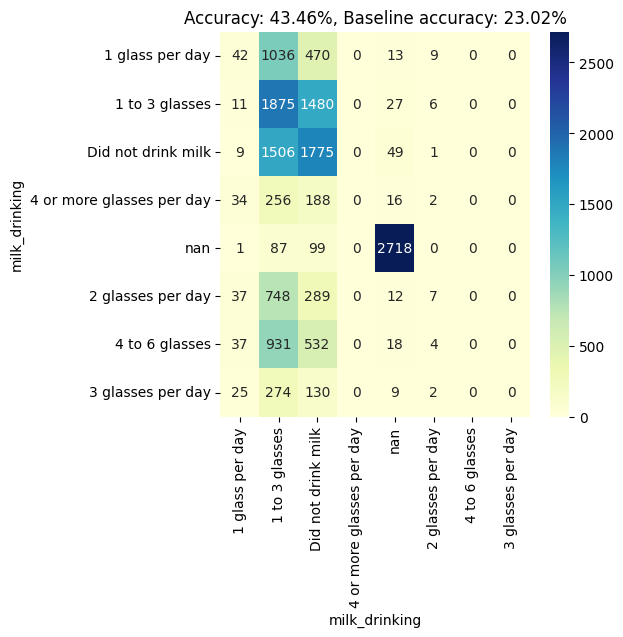

breakfast_eating


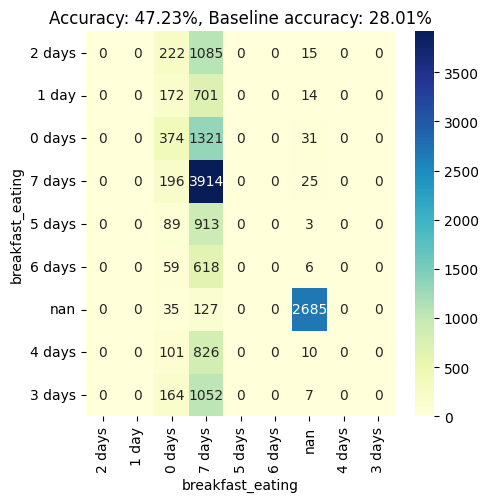

physical_activity


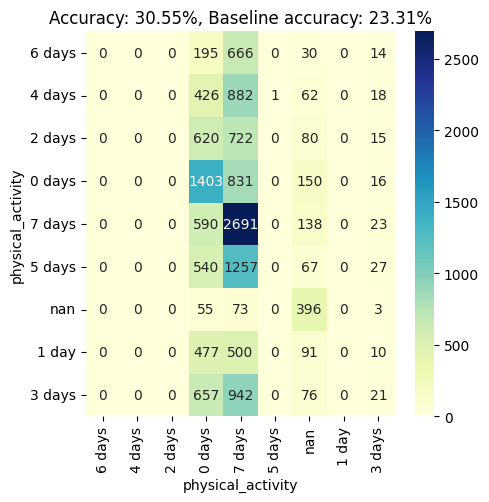

television_watching


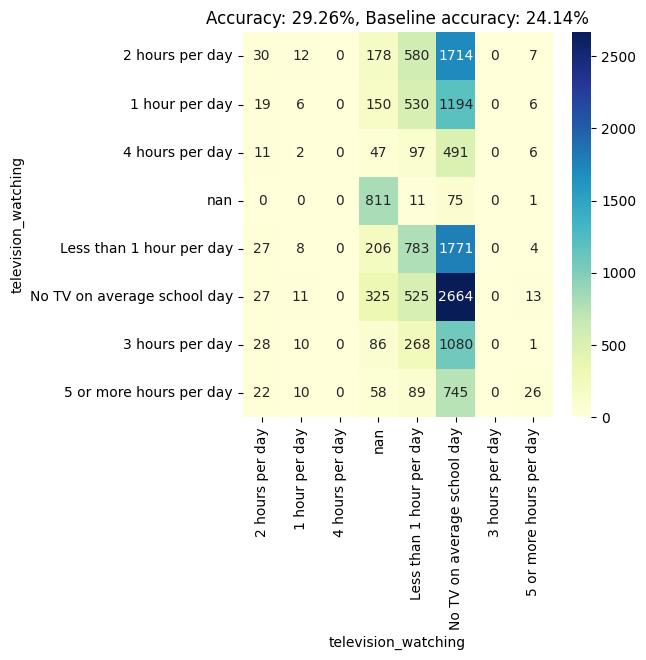

computer_not_school_work_use


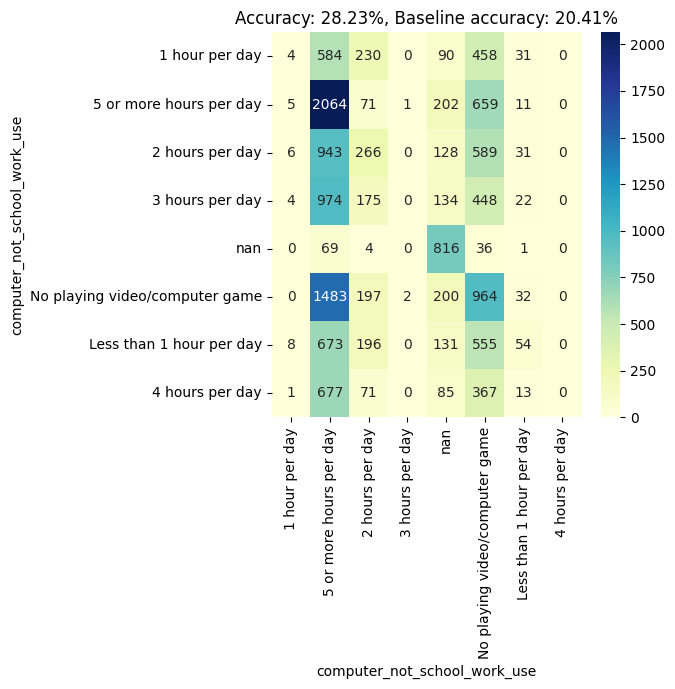

PE_attendance


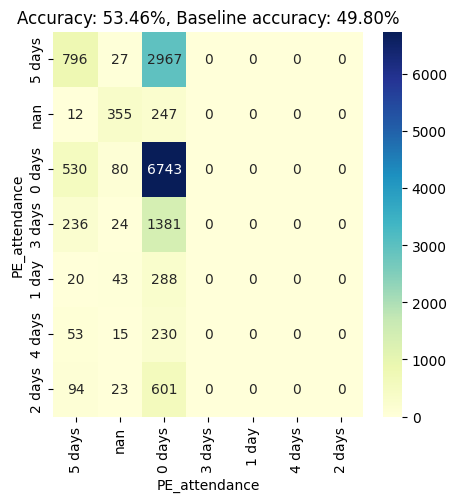

sports_team_participation


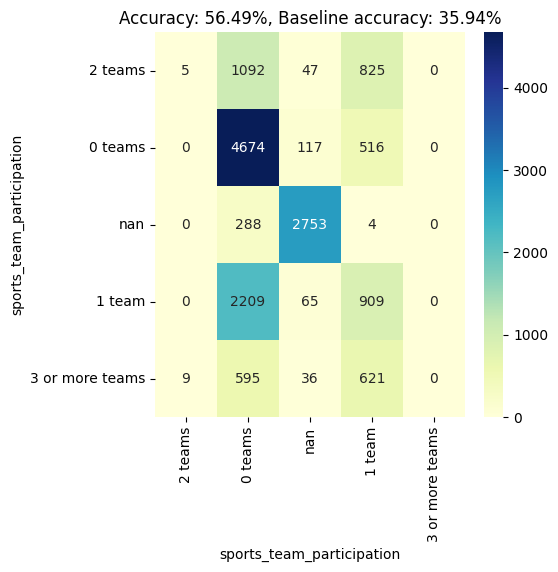

HIV_testing


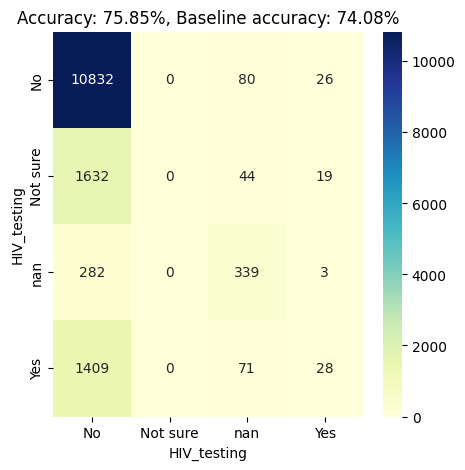

oral_health_care


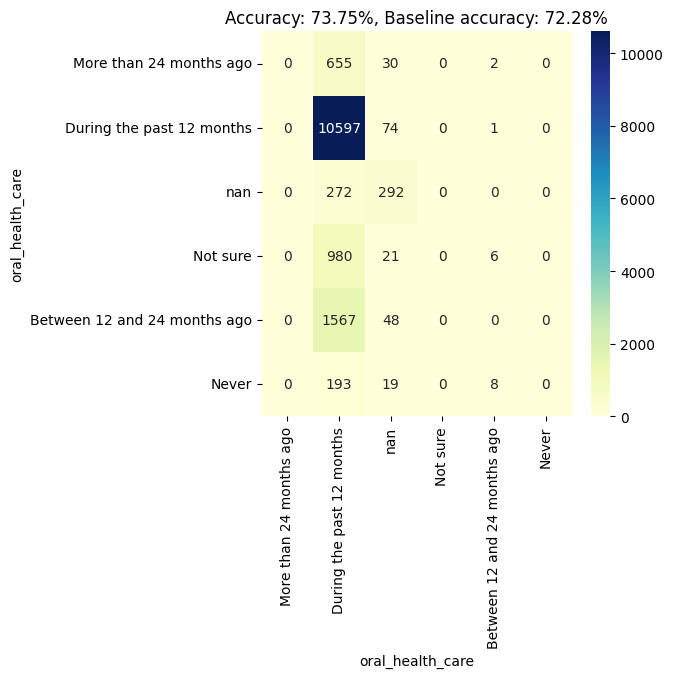

asthma


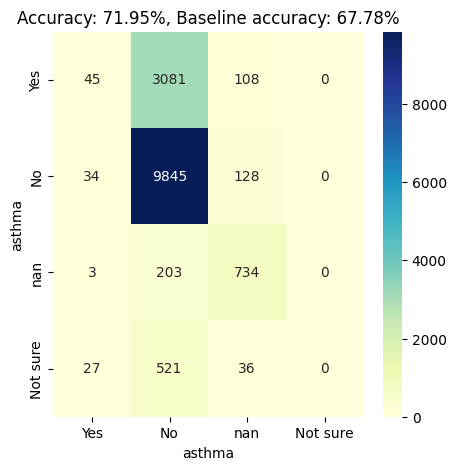

sleep_on_school_night


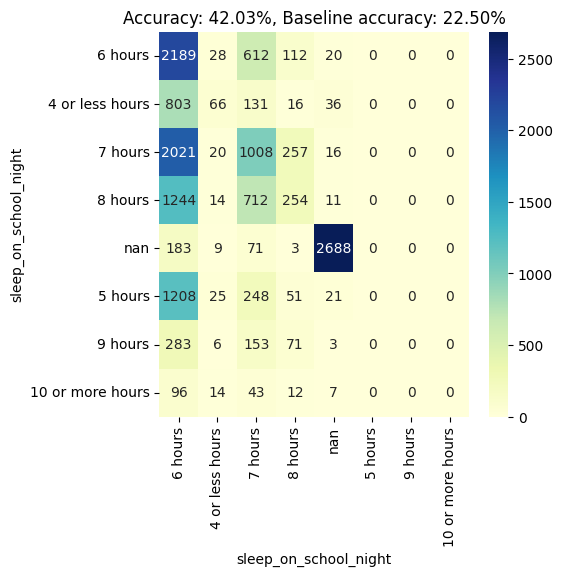

grades_in_school


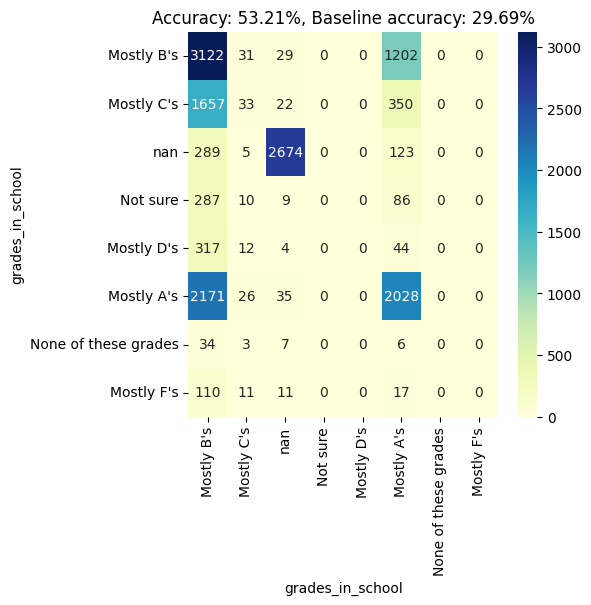

ever_used_LSD


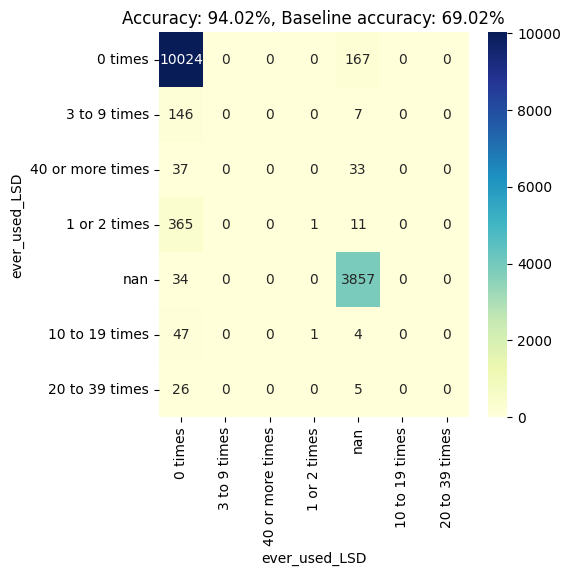

sports_drinks


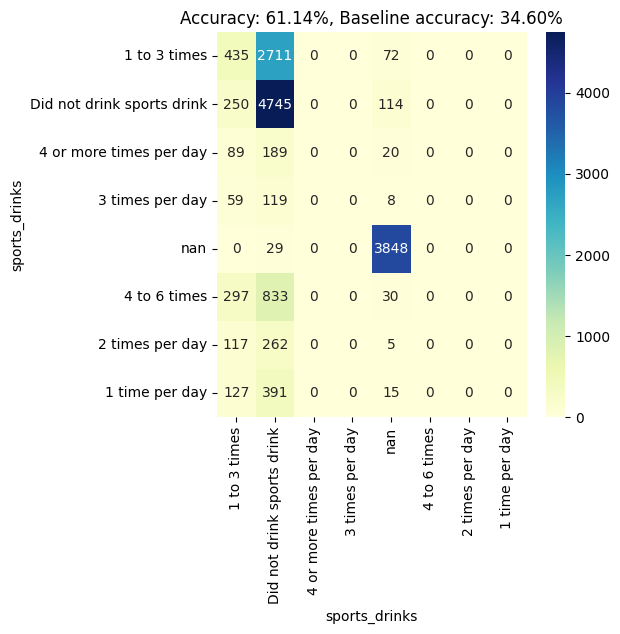

plain_water


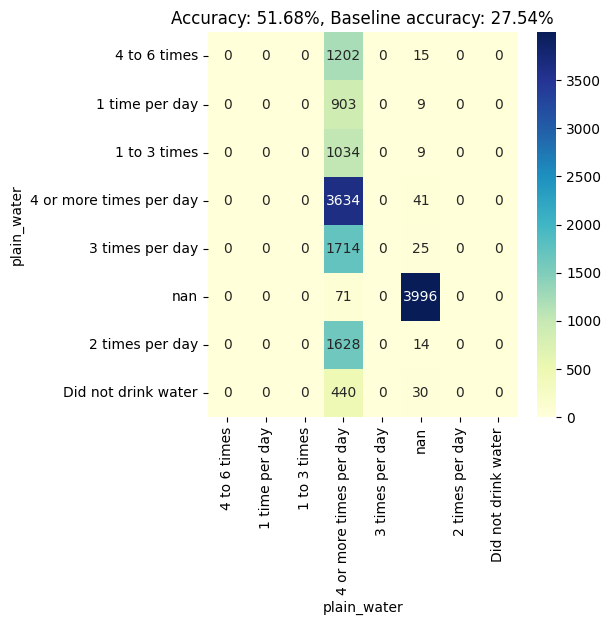

food_allergies


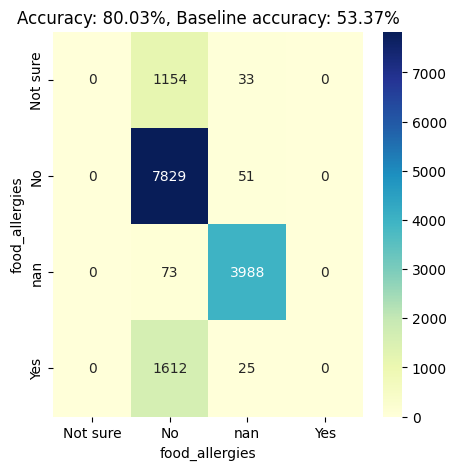

muscle_stregthening


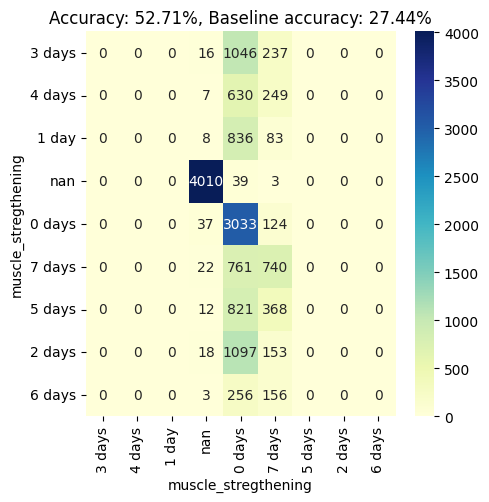

indoor_tanning


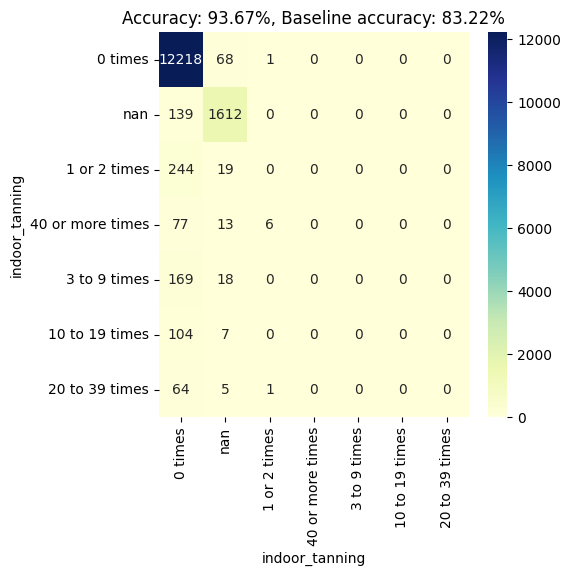

sunburn


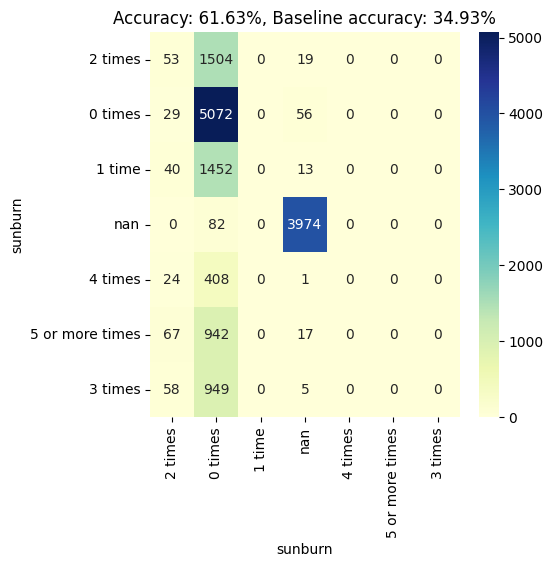

difficulty_concentrating


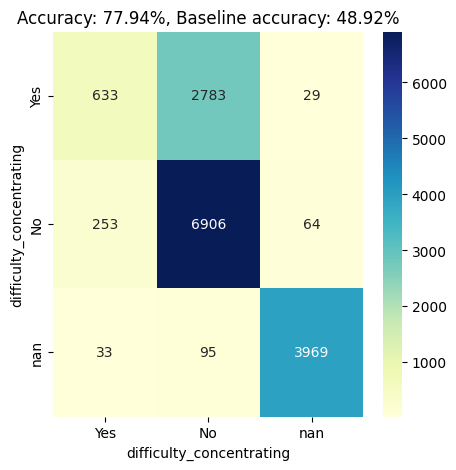

how_well_speak_English


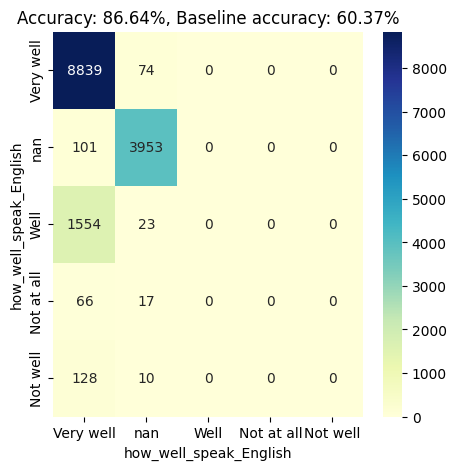

weight_cat


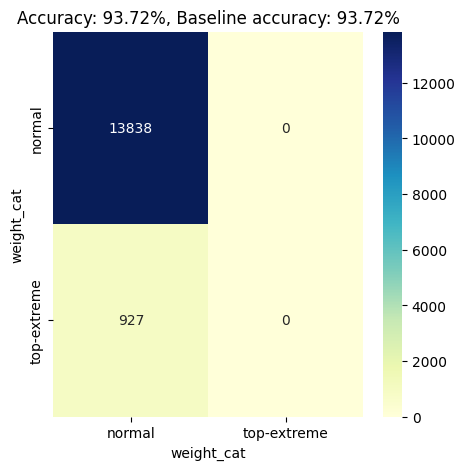

stheight_cat


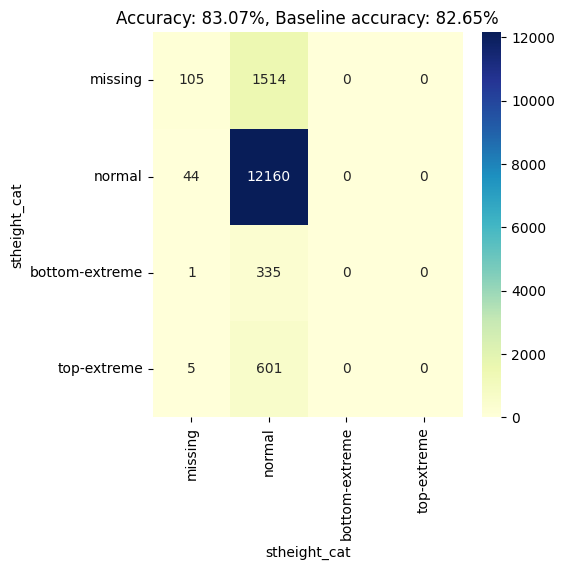

stweight_cat


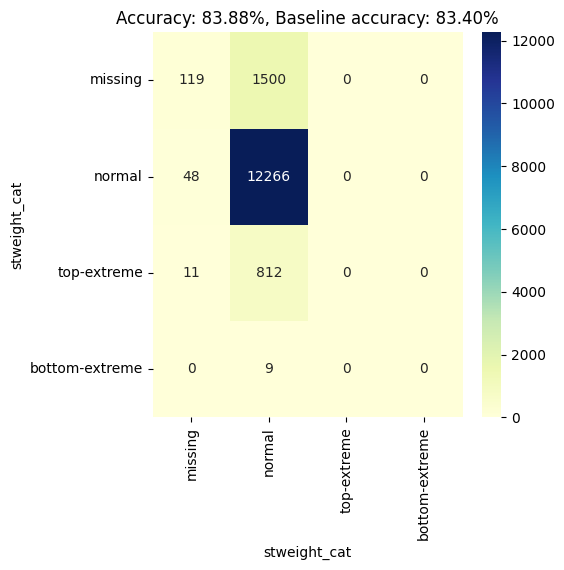

bmi_cat


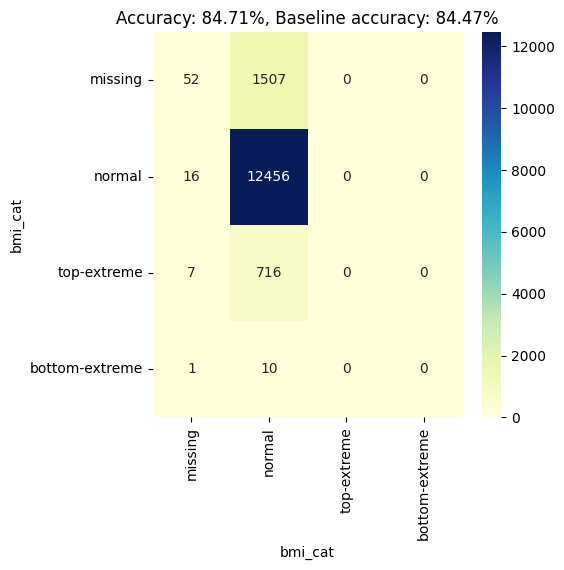

bmipct_cat


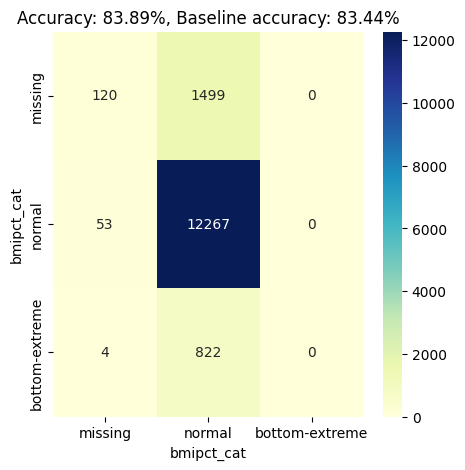

In [24]:
def create_scatterplot_for_categorical(original_df, predicted_df, categ_attr):
    all_categories = original_df[categ_attr].unique()
    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])
    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)
    accuracy = diagonal_sum / total_sum * 100

    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100


    plt.figure(figsize=(5, 5))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap="YlGnBu")
    plt.title(f"Accuracy: {accuracy:.2f}%, Baseline accuracy: {baseline_accuracy:.2f}%")
    plt.show()
    return accuracy, baseline_accuracy

result = []
for v in variable_types.keys():
  if variable_types[v] == 'categorical':
    print(v)
    a,b = create_scatterplot_for_categorical(project_data, tabular_from_predicted, v)
    entry = { 'variable': v, 'accuracy': a, 'baseline_accuracy': b }
    result.append(entry)

result = pd.DataFrame(result)

In [ ]:
def calculate_extended_metrics(original_df, predicted_df, categ_attr):
    all_categories = original_df[categ_attr].unique()
    confusion_matrix = pd.crosstab(original_df[categ_attr], predicted_df[categ_attr])
    confusion_matrix = confusion_matrix.reindex(index=all_categories, columns=all_categories, fill_value=0)

    diagonal_sum = np.trace(confusion_matrix.values)
    total_sum = np.sum(confusion_matrix.values)

    accuracy = diagonal_sum / total_sum * 100
    baseline_accuracy = original_df[categ_attr].value_counts().max() / total_sum * 100

    y_true = label_binarize(original_df[categ_attr], classes=all_categories)
    y_pred = label_binarize(predicted_df[categ_attr], classes=all_categories)
    ova_roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr', average='macro')

    return accuracy, baseline_accuracy, ova_roc_auc

# Example usage:
# accuracy, baseline_accuracy, ova_roc_auc = calculate_extended_metrics_without_prob(original_df, predicted_df, categ_attr)


result = []
for v in variable_types.keys():
  if variable_types[v] == 'categorical':
    print(v)
    if v.endswith("_cat"): continue
    a,b, c = calculate_extended_metrics(project_data, tabular_from_predicted, v)
    entry = { 'variable': v, 'accuracy': round(a,1), 'baseline_accuracy': round(b,1), 'ova_auc': c, 'lift': round(a/b,2) }
    result.append(entry)

df = pd.DataFrame(result)

df['lift'].mean()

In [28]:
df.sort_values(by='ova_auc', ascending=False).head(25)

,variable,accuracy,baseline_accuracy,ova_auc,lift
56,ever_sexual_intercourse,97.6,54.6,0.962713,1.79
61,condom_use,85.4,54.3,0.862695,1.57
60,alcohol/drugs_at_sex,92.7,54.3,0.861042,1.71
33,ever_cigarette_use,82.3,58.2,0.819335,1.41
12,sexpart2,86.0,36.4,0.815582,2.37
8,sex/sexual_contacts,81.6,36.6,0.797477,2.23
91,difficulty_concentrating,77.9,48.9,0.782173,1.59
11,sexpart,86.1,36.4,0.752425,2.37
87,food_allergies,80.0,53.4,0.694128,1.50
58,multiple_sex_partners,79.8,54.4,0.684774,1.47


In [29]:
df.sort_values(by=['ova_auc','baseline_accuracy'], ascending=True).head(25)

,variable,accuracy,baseline_accuracy,ova_auc,lift
27,electronic_bullying,84.5,84.5,0.500000,1.00
26,bullying_at_school,80.9,80.9,0.500552,1.00
18,weapon_carrying_at_school,94.2,94.2,0.506022,1.00
23,forced_sexual_intercourse,90.4,90.3,0.507192,1.00
14,riding_with_a_drinking_driver,83.4,83.2,0.510807,1.00
20,threatened_at_school,93.4,93.2,0.512234,1.00
37,current_electronic_vapor_product_use,76.3,75.7,0.512303,1.01
30,made_a_suicide_plan,85.0,84.7,0.514991,1.00
34,current_cigarette_use,89.7,89.3,0.517254,1.00
6,overweight,75.0,74.5,0.518954,1.01


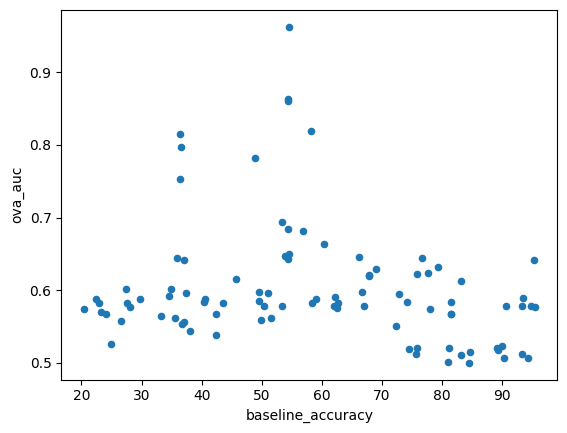

In [30]:
df.plot(x='baseline_accuracy', y='ova_auc', kind='scatter')
plt.show()